#  IRSHINE — Mask R-CNN Medicine Counting and Instance Segmentation
## Mask R-CNN + **ResNet-101 FPN** | AdamW | Target mAP > 0.90

---


```

## 🔑 Alasan Parameter

### 1. ResNet-101 FPN (backbone baru)
```
- 44.5M params backbone → kapasitas 2× lebih besar  daripada ResNet-50
- Lebih dalam → fitur lebih kaya untuk membedakan tablet/kapsul yang mirip secara visual

Alasan aman dipakai di dataset ini:
- Tetap pakai COCO pretrained weights
- Layer tambahan sudah terlatih, tidak dari nol
- Dengan AdamW + LR kecil, overfitting terkontrol
```

### 2. AdamW optimizer (ganti SGD)
```
- SGD   : 
Update seragam untuk semua parameter → lambat untuk head baru
- AdamW : 
Adaptive per-parameter → head baru belajar cepat, backbone belajar pelan secara otomatis
- AdamW vs Adam: 
AdamW pisahkan weight decay dari gradient update → regularisasi lebih efektif, generalisasi lebih baik

Referensi: Loshchilov & Hutter (2019) 'Decoupled Weight Decay Regularization'
```

### 3. CosineAnnealingWarmRestarts
```
- Cosine biasa :

Turun satu kali dari max ke min → stuck di local minimum
- Warm Restarts :

LR restart beberapa kali (T0=30 epoch, T_mult=2)

Siklus: 30 epoch → restart → 60 epoch → restart → ...

Setiap restart 'menendang' model keluar dari local min → Lebih cocok untuk dataset kecil yang landscape loss-nya penuh local minima
```

### 4. Input size 1024px (dari 800px)
```
- Objek obat yang kecil dan saling overlap lebih mudah dibedakan
- Mask segmentasi lebih presisi (IoU naik)
- Trade-off: Memory lebih besar → batch_size  2 dan waktu/epoch membutuhkan lebih lama
```

### 5. Mosaic Augmentation
```
Cara kerja: 
Gabungkan 4 gambar berbeda menjadi 1 gambar training

Keuntungan:
  - Model melihat 4× lebih banyak variasi per batch
  - Belajar mendeteksi objek kecil (karena gambar di-scale down 0.5×)
  - Regularisasi implicit yang kuat
  - Dipopulerkan YOLO v4, terbukti efektif untuk counting task
```

### 6. Metrik Baru: Accuracy, Precision, F1-Score
```
- Accuracy  = TP / (TP + FP + FN) per kelas
- Precision = TP / (TP + FP) → seberapa akurat prediksi positif
- Recall    = TP / (TP + FN) → seberapa lengkap deteksi (= mAR)
- F1-Score  = 2 × (Prec × Rec) / (Prec + Rec) → harmonic mean
```

### Pipeline:
```
- CELL 1  → Environment Check
- CELL 2  → Install Dependencies
- CELL 3  → Mount Google Drive
- CELL 4  → Pull Dataset dari Roboflow
- CELL 5  → Dataset Analysis
- CELL 6  → Dataset Class & DataLoader [Mosaic Augmentation]
- CELL 7  → Model ResNet-101 FPN + AdamW + CosineWarmRestarts
- CELL 8  → Training Utilities [+Accuracy, Precision, F1]
- CELL 9  → Training Loop 150 Epoch
- CELL 10 → Visualisasi + Perbandingan Exp1/2/3/4
- CELL 11 → Load Best Model + TTA Inference
- CELL 12 → Final Evaluation Lengkap [mAP, IoU, Acc, Prec, Recall, F1]
- CELL 13 → Upload Gambar Custom
```

---
## 📦 CELL 1 — Environment Check

In [ ]:
# ============================================================
# CELL 1: ENVIRONMENT CHECK
# ============================================================
import subprocess, sys, os
import torch

print('=' * 65)
print('   IRSHINE — Eksperimen 4')
print('   ResNet-101 FPN + AdamW + Mosaic | Target mAP > 0.90')
print('=' * 65)
print(f'\n Python  : {sys.version.split()[0]}')
print(f' PyTorch : {torch.__version__}')
print(f' CUDA    : {torch.cuda.is_available()}')

try:
    r = subprocess.run(
        ['nvidia-smi','--query-gpu=name,memory.total,memory.free',
         '--format=csv,noheader'],
        capture_output=True, text=True, check=True)
    g = r.stdout.strip().split(', ')
    print(f'\n GPU     : {g[0]}')
    print(f' VRAM    : {g[1]} total | {g[2]} free')
    vram_total = int(g[1].replace(' MiB',''))
    if vram_total < 14000:
        print(' VRAM < 14GB — ResNet-101 butuh ~12GB, pastikan T4/A100')
    else:
        print(' VRAM cukup untuk ResNet-101 FPN')
except:
    print('\n GPU tidak terdeteksi!')

if torch.cuda.is_available():
    print(f' Device  : {torch.cuda.get_device_name(0)}')
    print(f' CUDA    : {torch.version.cuda}')

try:
    with open('/proc/meminfo') as f: mem = f.read()
    total = int([l for l in mem.split('\n') if 'MemTotal' in l][0].split()[1])/1024/1024
    free  = int([l for l in mem.split('\n') if 'MemAvailable' in l][0].split()[1])/1024/1024
    print(f'\n RAM     : {total:.1f} GB total | {free:.1f} GB available')
except: pass

print('\n Environment check selesai!')

   IRSHINE — Eksperimen 4
   ResNet-101 FPN + AdamW + Mosaic | Target mAP > 0.90

 Python  : 3.12.13
 PyTorch : 2.11.0+cu128
 CUDA    : True

 GPU     : Tesla T4
 VRAM    : 15360 MiB total | 14910 MiB free
 VRAM cukup untuk ResNet-101 FPN
 Device  : Tesla T4
 CUDA    : 12.8

 RAM     : 12.7 GB total | 10.9 GB available

 Environment check selesai!


---
## 📦 CELL 2 — Install Dependencies

In [ ]:
# ============================================================
# CELL 2: INSTALL DEPENDENCIES
# ============================================================
import subprocess, sys

pkgs = ['roboflow','pycocotools','albumentations','opencv-python',
        'matplotlib','seaborn','pandas','Pillow','tqdm','scikit-learn']
# scikit-learn: untuk confusion matrix & classification report yang lebih lengkap

print(' Installing...')
for pkg in pkgs:
    print(f'  {pkg}...', end=' ')
    try:
        subprocess.check_call([sys.executable,'-m','pip','install','-q',pkg])
        print('Berhasil Install')
    except Exception as e:
        print(f'Gagal Install {e}')

import torch, torchvision, cv2, numpy as np
from sklearn import __version__ as sklearn_ver
print(f'\ntorch {torch.__version__} | torchvision {torchvision.__version__} | '
      f'cv2 {cv2.__version__} | sklearn {sklearn_ver} Ready')

 Installing...
  roboflow... Berhasil Install
  pycocotools... Berhasil Install
  albumentations... Berhasil Install
  opencv-python... Berhasil Install
  matplotlib... Berhasil Install
  seaborn... Berhasil Install
  pandas... Berhasil Install
  Pillow... Berhasil Install
  tqdm... Berhasil Install
  scikit-learn... Berhasil Install

torch 2.11.0+cu128 | torchvision 0.26.0+cu128 | cv2 4.10.0 | sklearn 1.6.1 Ready


---
## 📦 CELL 3 — Mount Google Drive

In [ ]:
# ============================================================
# CELL 3: MOUNT DRIVE & SETUP DIRECTORIES
# ============================================================
from google.colab import drive
import os

drive.mount('/content/drive')

BASE = '/content/drive/MyDrive/Capstone/IRSHINE'

# Log eksperimen sebelumnya untuk grafik perbandingan
EXP1_LOG = os.path.join(BASE, 'Epoch50_SGD',       'logs', 'training_log.csv')
EXP2_LOG = os.path.join(BASE, 'Epoch75_SGD_Exp2',  'logs', 'training_log.csv')
EXP3_LOG = os.path.join(BASE, '100Epoch_SGD_Eks3',
                        'Epoch100_Cosine_Exp3_Last 59', 'logs', 'training_log.csv')

# Direktori Eksperimen 4
DRIVE_BASE      = os.path.join(BASE, 'Epoch150_ResNet101_Exp4')
CHECKPOINT_DIR  = os.path.join(DRIVE_BASE, 'checkpoints')
LOG_DIR         = os.path.join(DRIVE_BASE, 'logs')
RESULT_DIR      = os.path.join(DRIVE_BASE, 'results')
BEST_MODEL_PATH = os.path.join(DRIVE_BASE, 'bestmodel_medicine_ver4.pth')

for d in [DRIVE_BASE, CHECKPOINT_DIR, LOG_DIR, RESULT_DIR]:
    os.makedirs(d, exist_ok=True)
    print(f'  ✅ {d}')

print(f"""
 Struktur Exp4:
   Epoch150_ResNet101_Exp4/
   ├── checkpoints/   ← tiap 5 epoch
   ├── logs/          ← CSV lengkap
   ├── results/       ← semua grafik
   └── bestmodel_medicine_ver4.pth
""")
print(' Drive ready!')

Mounted at /content/drive
  ✅ /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4
  ✅ /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/checkpoints
  ✅ /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/logs
  ✅ /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results

 Struktur Exp4:
   Epoch150_ResNet101_Exp4/
   ├── checkpoints/   ← tiap 5 epoch
   ├── logs/          ← CSV lengkap
   ├── results/       ← semua grafik
   └── bestmodel_medicine_ver4.pth

 Drive ready!


---
## 📦 CELL 4 — Pull Dataset dari Roboflow

In [ ]:
# ============================================================
# CELL 4: PULL DATASET FROM ROBOFLOW
# ============================================================
from roboflow import Roboflow
import os

# ─── SESUAIKAN ───────────────────────────────────────────────
ROBOFLOW_API_KEY    = "CJkiERmdNQ60i6LkTIlR"
ROBOFLOW_WORKSPACE  = "nadia-uwvmb"
ROBOFLOW_PROJECT    = "obat_capstone"
ROBOFLOW_VERSION    = 3
# ─────────────────────────────────────────────────────────────

DATASET_DIR = '/content/dataset'

print(' Connecting to Roboflow...')
rf      = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace(ROBOFLOW_WORKSPACE).project(ROBOFLOW_PROJECT)
dataset = project.version(ROBOFLOW_VERSION).download('coco-segmentation',
                                                       location=DATASET_DIR)

TRAIN_DIR = os.path.join(DATASET_DIR, 'train')
VALID_DIR = os.path.join(DATASET_DIR, 'valid')
TEST_DIR  = os.path.join(DATASET_DIR, 'test')
TRAIN_ANN = os.path.join(TRAIN_DIR, '_annotations.coco.json')
VALID_ANN = os.path.join(VALID_DIR, '_annotations.coco.json')
TEST_ANN  = os.path.join(TEST_DIR,  '_annotations.coco.json')

for split in ['train','valid','test']:
    p = os.path.join(DATASET_DIR, split)
    n = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png','.jpeg'))])
    print(f'  {split:6s}: {n} images ')

print('\n Dataset ready!')

 Connecting to Roboflow...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/dataset in coco-segmentation:: 100%|██████████| 1259/1259 [00:00<00:00, 6441.62it/s]


  train : 1098 images 
  valid : 103 images 
  test  : 53 images 

 Dataset ready!


---
## 📦 CELL 5 — Dataset Analysis

 Distribusi Instance:
Kelas           Train    Valid     Test    Total
--------------------------------------------
kapsul           2289      183      123     2595
softgel          2148      209      103     2460
tablet           2673      243      121     3037
--------------------------------------------
TOTAL            7110      635      347


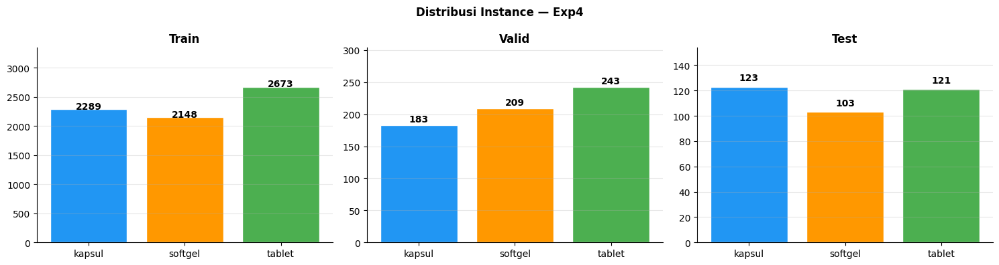

 Dataset analysis selesai!


In [ ]:
# ============================================================
# CELL 5: DATASET ANALYSIS
# ============================================================
import json, numpy as np, matplotlib.pyplot as plt, os

VALID_CLASSES = {'kapsul', 'softgel', 'tablet'}

def load_json(p):
    with open(p) as f: return json.load(f)

def count_instances(data):
    counts = {c:0 for c in VALID_CLASSES}
    for ann in data['annotations']:
        cat_name = next((c['name'].lower() for c in data['categories']
                         if c['id']==ann['category_id']),None)
        if cat_name in VALID_CLASSES:
            counts[cat_name] += 1
    return counts

train_data = load_json(TRAIN_ANN)
valid_data = load_json(VALID_ANN)
test_data  = load_json(TEST_ANN)

tc = count_instances(train_data)
vc = count_instances(valid_data)
ec = count_instances(test_data)

print(' Distribusi Instance:')
print(f'{"Kelas":<12} {"Train":>8} {"Valid":>8} {"Test":>8} {"Total":>8}')
print('-'*44)
for cls in sorted(VALID_CLASSES):
    t,v,e = tc[cls],vc[cls],ec[cls]
    print(f'{cls:<12} {t:>8} {v:>8} {e:>8} {t+v+e:>8}')
print('-'*44)
print(f'{"TOTAL":<12} {sum(tc.values()):>8} {sum(vc.values()):>8} {sum(ec.values()):>8}')

cls_colors = {'kapsul':'#2196F3','softgel':'#FF9800','tablet':'#4CAF50'}
fig,axes = plt.subplots(1,3,figsize=(15,4))
fig.suptitle('Distribusi Instance — Exp4',fontweight='bold')
for ax,(counts,title) in zip(axes,[(tc,'Train'),(vc,'Valid'),(ec,'Test')]):
    cls_list = sorted(counts.keys())
    vals = [counts[c] for c in cls_list]
    bars = ax.bar(cls_list,vals,color=[cls_colors[c] for c in cls_list],edgecolor='white')
    for bar,val in zip(bars,vals):
        ax.text(bar.get_x()+bar.get_width()/2,bar.get_height()+5,
                str(val),ha='center',fontweight='bold')
    ax.set_title(title,fontweight='bold'); ax.set_ylim(0,max(vals)*1.25)
    ax.grid(axis='y',alpha=0.3)
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'dataset_dist_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()
print(' Dataset analysis selesai!')

---
## 📦 CELL 6 — Dataset Class & DataLoader [Mosaic Augmentation]
> **Perubahan utama:** Tambah `MosaicTransform` — gabungkan 4 gambar jadi 1.
> Input size dinaikkan ke **1024px** untuk detail segmentasi lebih presisi.

In [ ]:
# ============================================================
# CELL 6: DATASET CLASS & DATALOADER
# PERUBAHAN EXP4:
#   - Input size: 800 → 1024px
#   - Augmentasi: tambah Mosaic (4 gambar → 1)
#   - AdamW config
#   - CosineAnnealingWarmRestarts config
# ============================================================
import torch
import torchvision.transforms.functional as TF
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
import json, numpy as np, os, random
from PIL import Image

CONFIG = {
    'num_classes'   : 4,
    'class_names'   : ['__background__','kapsul','softgel','tablet'],
    'valid_classes' : ['kapsul','softgel','tablet'],

    # Training
    'num_epochs'    : 150,
    'batch_size'    : 2,
    'num_workers'   : 2,

    # AdamW — learning rate
    # Jauh lebih kecil dari SGD karena AdamW adaptif
    # backbone: lr sangat kecil, sudah bagus dari COCO
    # head: lr 10× backbone, cukup untuk belajar 3 kelas baru
    'lr_backbone'   : 0.00001,
    'lr_fpn'        : 0.00005,
    'lr_rpn'        : 0.0001,
    'lr_head'       : 0.0001,
    'weight_decay'  : 0.01,    # AdamW weight decay lebih besar dari SGD

    # CosineAnnealingWarmRestarts
    # T0=40: siklus pertama 40 epoch, restart → 80 epoch → restart → ...
    # T_mult=2: setiap restart siklus 2× lebih panjang
    # eta_min: LR minimum di titik terbawah cosine
    'cosine_T0'     : 40,
    'cosine_T_mult' : 2,
    'cosine_eta_min': 1e-7,

    # Warmup
    'warmup_epochs' : 5,
    'warmup_factor' : 0.1,

    # Frozen backbone — lebih pendek dari Exp3
    # ResNet-101 lebih besar, cukup freeze 5 epoch saja
    'freeze_epochs' : 5,

    # Early Stopping
    'early_stop_patience' : 25,
    'early_stop_min_delta': 0.0005,

    # Checkpoint
    'checkpoint_interval': 5,

    # Input — dinaikkan dari 800 → 1024px
    # Alasan: resolusi lebih tinggi → segmentasi lebih presisi
    'min_size'      : 1024,
    'max_size'      : 1333,

    # Mosaic probability
    # 50% gambar pakai mosaic, 50% pakai augmentasi biasa
    'mosaic_prob'   : 0.5,

    # Per-class score threshold (sama dengan Exp3)
    'score_threshold_per_class': {
        1: 0.50,   # kapsul
        2: 0.45,   # softgel (AP terendah)
        3: 0.55,   # tablet (AP tertinggi)
    },
    'score_threshold'   : 0.45,
    'nms_threshold'     : 0.5,
    'detections_per_img': 100,
    'use_tta'           : True,
}

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f' Device: {DEVICE}')
print('\n  CONFIG Eksperimen 4:')
for k,v in CONFIG.items():
    print(f'   {k:<32}: {v}')


# ─── Dataset Class ───────────────────────────────────────────
class MedicineDataset(Dataset):
    LABEL_MAP = {'kapsul':1,'softgel':2,'tablet':3}

    def __init__(self, img_dir, ann_file, transforms=None, all_samples=None):
        """
        all_samples: daftar semua (img, target) dari dataset yang sama.
        Diperlukan untuk MosaicTransform yang butuh akses ke gambar lain.
        """
        self.img_dir    = img_dir
        self.transforms = transforms
        self.all_samples = all_samples  # akan di-set setelah init

        with open(ann_file) as f:
            coco = json.load(f)

        self.cat_id_to_name = {c['id']:c['name'].lower() for c in coco['categories']}
        self.valid_cat_ids  = {cid for cid,name in self.cat_id_to_name.items()
                               if name in self.LABEL_MAP}
        self.images = {img['id']:img for img in coco['images']}
        self.ann_by_img = {}
        for ann in coco['annotations']:
            if ann['category_id'] not in self.valid_cat_ids: continue
            if ann.get('iscrowd',0): continue
            self.ann_by_img.setdefault(ann['image_id'],[]).append(ann)
        self.img_ids = [iid for iid in self.images
                        if iid in self.ann_by_img and len(self.ann_by_img[iid])>0]

        counts = {n:0 for n in self.LABEL_MAP}
        for anns in self.ann_by_img.values():
            for ann in anns:
                counts[self.cat_id_to_name[ann['category_id']]] += 1
        print(f'   {len(self.img_ids)} gambar | {counts}')

    def __len__(self): return len(self.img_ids)

    def load_raw(self, idx):
        """Load gambar & target tanpa transform — dipakai oleh MosaicTransform."""
        img_id   = self.img_ids[idx]
        img_info = self.images[img_id]
        img = Image.open(os.path.join(self.img_dir,img_info['file_name'])).convert('RGB')
        W,H = img.size
        anns = self.ann_by_img.get(img_id,[])
        boxes,labels,masks,areas,iscrowd = [],[],[],[],[]
        for ann in anns:
            x,y,w,h = ann['bbox']
            x1,y1,x2,y2 = x,y,x+w,y+h
            if w<=0 or h<=0 or x2<=x1 or y2<=y1: continue
            cat_name = self.cat_id_to_name[ann['category_id']]
            boxes.append([x1,y1,x2,y2])
            labels.append(self.LABEL_MAP[cat_name])
            areas.append(ann.get('area',w*h))
            iscrowd.append(ann.get('iscrowd',0))
            masks.append(self._poly_to_mask(ann.get('segmentation',[]),H,W))
        return img, boxes, labels, masks, areas, iscrowd, (W,H)

    def __getitem__(self, idx):
        img, boxes, labels, masks, areas, iscrowd, (W,H) = self.load_raw(idx)

        if not boxes:
            boxes_t  = torch.zeros((0,4),dtype=torch.float32)
            labels_t = torch.zeros(0,dtype=torch.int64)
            masks_t  = torch.zeros((0,H,W),dtype=torch.uint8)
            areas_t  = torch.zeros(0,dtype=torch.float32)
            iscrowd_t= torch.zeros(0,dtype=torch.int64)
        else:
            boxes_t  = torch.as_tensor(boxes,dtype=torch.float32)
            labels_t = torch.as_tensor(labels,dtype=torch.int64)
            masks_t  = torch.as_tensor(np.array(masks),dtype=torch.uint8)
            areas_t  = torch.as_tensor(areas,dtype=torch.float32)
            iscrowd_t= torch.as_tensor(iscrowd,dtype=torch.int64)

        target = {
            'boxes':boxes_t,'labels':labels_t,'masks':masks_t,
            'image_id':torch.tensor([self.img_ids[idx]]),
            'area':areas_t,'iscrowd':iscrowd_t
        }
        if self.transforms:
            img,target = self.transforms(img, target, self, idx)
        else:
            img = TF.to_tensor(img)
        return img, target

    def _poly_to_mask(self, segmentation, H, W):
        import cv2
        mask = np.zeros((H,W),dtype=np.uint8)
        for seg in segmentation:
            if len(seg)<6: continue
            pts = np.array(seg,dtype=np.float32).reshape(-1,2).astype(np.int32)
            cv2.fillPoly(mask,[pts],1)
        return mask


# ─── Mosaic Augmentation ─────────────────────────────────────
def make_mosaic(dataset, idx, output_size=1024):
    """
    Gabungkan 4 gambar (idx + 3 random) menjadi 1 gambar mosaic.
    Setiap gambar ditempatkan di salah satu kuadran (TL, TR, BL, BR).
    Box dan mask di-transform sesuai posisi di kuadran.

    Output: PIL Image (output_size × output_size), target dict
    """
    import cv2
    half = output_size // 2

    # 4 index: gambar saat ini + 3 random
    indices = [idx] + random.sample(range(len(dataset)), 3)
    # Offset (x, y) tiap kuadran di canvas
    offsets = [(0,0),(half,0),(0,half),(half,half)]  # TL, TR, BL, BR

    canvas     = np.zeros((output_size, output_size, 3), dtype=np.uint8)
    all_boxes, all_labels, all_masks = [], [], []

    for (ox, oy), i in zip(offsets, indices):
        img_pil, boxes, labels, masks, _, _, (W,H) = dataset.load_raw(i)

        # Resize gambar ke ukuran kuadran (half × half)
        img_pil = img_pil.resize((half, half), Image.BILINEAR)
        img_np  = np.array(img_pil)
        scale_x = half / W
        scale_y = half / H

        # Tempatkan di canvas
        canvas[oy:oy+half, ox:ox+half] = img_np

        # Transform boxes dan masks ke koordinat canvas
        for box, lbl, mask in zip(boxes, labels, masks):
            x1,y1,x2,y2 = box
            nx1 = x1*scale_x + ox
            ny1 = y1*scale_y + oy
            nx2 = x2*scale_x + ox
            ny2 = y2*scale_y + oy
            if nx2-nx1 < 2 or ny2-ny1 < 2: continue
            all_boxes.append([nx1,ny1,nx2,ny2])
            all_labels.append(lbl)

            # Resize mask ke kuadran lalu tempatkan di mask canvas
            m_resized = cv2.resize(mask.astype(np.uint8),(half,half),
                                   interpolation=cv2.INTER_NEAREST)
            m_canvas  = np.zeros((output_size,output_size),dtype=np.uint8)
            m_canvas[oy:oy+half, ox:ox+half] = m_resized
            all_masks.append(m_canvas)

    if not all_boxes:
        return (Image.fromarray(canvas),
                {'boxes':torch.zeros((0,4),dtype=torch.float32),
                 'labels':torch.zeros(0,dtype=torch.int64),
                 'masks':torch.zeros((0,output_size,output_size),dtype=torch.uint8),
                 'image_id':torch.tensor([0]),
                 'area':torch.zeros(0,dtype=torch.float32),
                 'iscrowd':torch.zeros(0,dtype=torch.int64)})

    boxes_t  = torch.as_tensor(all_boxes,dtype=torch.float32)
    labels_t = torch.as_tensor(all_labels,dtype=torch.int64)
    masks_t  = torch.as_tensor(np.array(all_masks),dtype=torch.uint8)
    areas_t  = ((boxes_t[:,2]-boxes_t[:,0])*(boxes_t[:,3]-boxes_t[:,1]))

    target = {
        'boxes':boxes_t,'labels':labels_t,'masks':masks_t,
        'image_id':torch.tensor([0]),
        'area':areas_t,
        'iscrowd':torch.zeros(len(all_boxes),dtype=torch.int64)
    }
    return Image.fromarray(canvas), target


# ─── Transforms ──────────────────────────────────────────────
class TrainTransforms:
    """
    PERUBAHAN EXP4:
    - 50% kemungkinan pakai Mosaic (4 gambar jadi 1)
    - Sisanya: ColorJitter + RandomScale + flip (sama dengan Exp3)
    """
    def __init__(self, flip_prob=0.5, scale_range=(0.8,1.2),
                 mosaic_prob=0.5, mosaic_size=1024):
        self.flip_prob    = flip_prob
        self.scale_range  = scale_range
        self.mosaic_prob  = mosaic_prob
        self.mosaic_size  = mosaic_size
        self.color_jitter = T.ColorJitter(
            brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05
        )

    def __call__(self, img, target, dataset=None, idx=None):
        # Mosaic — butuh akses ke dataset dan idx
        if dataset is not None and random.random() < self.mosaic_prob:
            img, target = make_mosaic(dataset, idx, self.mosaic_size)
        else:
            # Standard augmentation
            img = self.color_jitter(img)
            scale = random.uniform(*self.scale_range)
            W,H   = img.size
            nW,nH = int(W*scale), int(H*scale)
            img   = img.resize((nW,nH), Image.BILINEAR)
            if target['boxes'].numel() > 0:
                target['boxes'] = target['boxes'] * scale
            if target['masks'].numel() > 0:
                import torch.nn.functional as F
                mf = target['masks'].float().unsqueeze(1)
                mf = F.interpolate(mf,size=(nH,nW),mode='nearest')
                target['masks'] = mf.squeeze(1).byte()

        # Random horizontal flip (selalu, baik mosaic maupun tidak)
        if random.random() < self.flip_prob:
            W2,_ = img.size
            img   = TF.hflip(img)
            if target['boxes'].numel() > 0:
                boxes = target['boxes'].clone()
                boxes[:,[0,2]] = W2 - boxes[:,[2,0]]
                target['boxes'] = boxes
            if target['masks'].numel() > 0:
                target['masks'] = target['masks'].flip(-1)

        return TF.to_tensor(img), target


class ValTransforms:
    def __call__(self, img, target, dataset=None, idx=None):
        return TF.to_tensor(img), target


def collate_fn(batch):
    return tuple(zip(*batch))


# ─── Load Dataset ────────────────────────────────────────────
print('\n Loading datasets...')
train_dataset = MedicineDataset(TRAIN_DIR, TRAIN_ANN,
                                transforms=TrainTransforms(
                                    mosaic_prob=CONFIG['mosaic_prob'],
                                    mosaic_size=CONFIG['min_size']
                                ))
valid_dataset = MedicineDataset(VALID_DIR, VALID_ANN, transforms=ValTransforms())
test_dataset  = MedicineDataset(TEST_DIR,  TEST_ANN,  transforms=ValTransforms())

train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'],
                          shuffle=True, num_workers=CONFIG['num_workers'],
                          collate_fn=collate_fn, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False,
                          num_workers=CONFIG['num_workers'], collate_fn=collate_fn)
test_loader  = DataLoader(test_dataset,  batch_size=1, shuffle=False,
                          num_workers=CONFIG['num_workers'], collate_fn=collate_fn)

print(f'\n DataLoaders:')
print(f'   Train : {len(train_dataset)} samples, {len(train_loader)} batches')
print(f'   Valid : {len(valid_dataset)} samples, {len(valid_loader)} batches')
print(f'   Test  : {len(test_dataset)} samples, {len(test_loader)} batches')

img_s,tgt_s = train_dataset[0]
assert tgt_s['labels'].max().item() < CONFIG['num_classes']
print(f'   Label range OK: max={tgt_s["labels"].max().item()} ')

 Device: cuda

  CONFIG Eksperimen 4:
   num_classes                     : 4
   class_names                     : ['__background__', 'kapsul', 'softgel', 'tablet']
   valid_classes                   : ['kapsul', 'softgel', 'tablet']
   num_epochs                      : 150
   batch_size                      : 2
   num_workers                     : 2
   lr_backbone                     : 1e-05
   lr_fpn                          : 5e-05
   lr_rpn                          : 0.0001
   lr_head                         : 0.0001
   weight_decay                    : 0.01
   cosine_T0                       : 40
   cosine_T_mult                   : 2
   cosine_eta_min                  : 1e-07
   warmup_epochs                   : 5
   warmup_factor                   : 0.1
   freeze_epochs                   : 5
   early_stop_patience             : 25
   early_stop_min_delta            : 0.0005
   checkpoint_interval             : 5
   min_size                        : 1024
   max_size               

---
## 📦 CELL 7 — Model ResNet-101 FPN + AdamW + CosineWarmRestarts
> **Backbone baru: ResNet-101** — 44.5M params vs ResNet-50 25.6M params.  
> Lebih dalam, fitur lebih kaya untuk membedakan tablet/kapsul yang mirip.

In [ ]:
# ============================================================
# CELL 7: MODEL ResNet-50 FPN V2 + AdamW + CosineWarmRestarts
# FIX: build_optimizer_adamw dengan deduplication
# ============================================================
import torch
from torchvision.models.detection import (
    maskrcnn_resnet50_fpn_v2,
    MaskRCNN_ResNet50_FPN_V2_Weights
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor


def build_model(num_classes, score_thresh=0.45, nms_thresh=0.5, detections_per_img=100):
    weights = MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model   = maskrcnn_resnet50_fpn_v2(
        weights                = weights,
        box_score_thresh       = score_thresh,
        box_nms_thresh         = nms_thresh,
        box_detections_per_img = detections_per_img,
        min_size               = CONFIG['min_size'],
        max_size               = CONFIG['max_size'],
    )
    in_box  = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_box, num_classes)
    in_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask, 256, num_classes)
    return model


def freeze_backbone(model):
    for param in model.backbone.parameters():
        param.requires_grad = False
    n = sum(p.numel() for p in model.backbone.parameters())
    print(f'   🔒 Backbone FROZEN: {n:,} params')


def unfreeze_backbone(model):
    for param in model.backbone.parameters():
        param.requires_grad = True
    n = sum(p.numel() for p in model.backbone.parameters())
    print(f'   🔓 Backbone UNFROZEN: {n:,} params')


def build_optimizer_adamw(model):
    """
    AdamW dengan layer-wise LR + deduplication.

    FIX: FPN adalah bagian dari model.backbone di torchvision.
    Tanpa deduplication, parameter FPN masuk ke grup 'backbone'
    sekaligus grup 'fpn' → ValueError saat unfreeze backbone.

    Solusi: assigned_ids set memastikan tiap parameter
    hanya masuk satu grup, dengan prioritas:
    fpn → backbone_sisa → rpn → head → other
    """
    assigned_ids = set()

    def get_params(module_params):
        params = []
        for p in module_params:
            if p.requires_grad and id(p) not in assigned_ids:
                params.append(p)
                assigned_ids.add(id(p))
        return params

    # FPN lebih dulu (subset dari backbone, harus di-assign duluan)
    fpn_params      = get_params(model.backbone.fpn.parameters()) \
                      if hasattr(model.backbone, 'fpn') else []
    # Backbone sisanya (FPN sudah ter-exclude via assigned_ids)
    backbone_params = get_params(model.backbone.parameters())
    rpn_params      = get_params(model.rpn.parameters())
    head_params     = get_params(
        list(model.roi_heads.box_predictor.parameters()) +
        list(model.roi_heads.mask_predictor.parameters()) +
        list(model.roi_heads.box_head.parameters()) +
        list(model.roi_heads.mask_head.parameters())
    )
    other_params    = get_params(model.parameters())

    param_groups = []
    if backbone_params:
        param_groups.append({'params': backbone_params,
                             'lr': CONFIG['lr_backbone'], 'name': 'backbone'})
    if fpn_params:
        param_groups.append({'params': fpn_params,
                             'lr': CONFIG['lr_fpn'], 'name': 'fpn'})
    if rpn_params:
        param_groups.append({'params': rpn_params,
                             'lr': CONFIG['lr_rpn'], 'name': 'rpn'})
    if head_params:
        param_groups.append({'params': head_params,
                             'lr': CONFIG['lr_head'], 'name': 'head'})
    if other_params:
        param_groups.append({'params': other_params,
                             'lr': CONFIG['lr_rpn'], 'name': 'other'})

    optimizer = torch.optim.AdamW(
        param_groups,
        weight_decay = CONFIG['weight_decay'],
    )

    # Verifikasi tidak ada duplikat
    all_ids = [id(p) for g in optimizer.param_groups for p in g['params']]
    assert len(all_ids) == len(set(all_ids)), '❌ Masih ada parameter duplikat!'

    print(f'   ✅ AdamW — {len(param_groups)} param groups:')
    for g in optimizer.param_groups:
        n = sum(p.numel() for p in g['params'])
        print(f"      {g['name']:<12}: LR={g['lr']:.5f} | {n:,} params")

    return optimizer


# ─── Build Model ─────────────────────────────────────────────
print('🏗️  Building Mask R-CNN ResNet-50 FPN V2...')
model = build_model(
    num_classes        = CONFIG['num_classes'],
    score_thresh       = CONFIG['score_threshold'],
    nms_thresh         = CONFIG['nms_threshold'],
    detections_per_img = CONFIG['detections_per_img'],
).to(DEVICE)

# Freeze backbone di awal
freeze_backbone(model)

total_p     = sum(p.numel() for p in model.parameters())
trainable_p = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'   Total params     : {total_p:,}')
print(f'   Trainable params : {trainable_p:,} (backbone frozen)')

# ─── Optimizer AdamW ─────────────────────────────────────────
optimizer = build_optimizer_adamw(model)

# ─── Scheduler: Warmup → CosineAnnealingWarmRestarts ─────────
warmup_scheduler = torch.optim.lr_scheduler.LinearLR(
    optimizer,
    start_factor = CONFIG['warmup_factor'],
    end_factor   = 1.0,
    total_iters  = CONFIG['warmup_epochs'],
)

cosine_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0     = CONFIG['cosine_T0'],
    T_mult  = CONFIG['cosine_T_mult'],
    eta_min = CONFIG['cosine_eta_min'],
)

lr_scheduler = torch.optim.lr_scheduler.SequentialLR(
    optimizer,
    schedulers = [warmup_scheduler, cosine_scheduler],
    milestones = [CONFIG['warmup_epochs']],
)

print(f'\n   Scheduler : LinearLR Warmup ({CONFIG["warmup_epochs"]} ep) '
      f'→ CosineWarmRestarts T0={CONFIG["cosine_T0"]} T_mult={CONFIG["cosine_T_mult"]}')
print(f'   Freeze    : Backbone frozen epoch 1-{CONFIG["freeze_epochs"]}')
print('\n✅ Model siap!')

🏗️  Building Mask R-CNN ResNet-50 FPN V2...
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth


100%|██████████| 177M/177M [00:05<00:00, 31.7MB/s]


   🔒 Backbone FROZEN: 26,854,464 params
   Total params     : 45,891,175
   Trainable params : 19,036,711 (backbone frozen)
   ✅ AdamW — 2 param groups:
      rpn         : LR=0.00010 | 1,184,015 params
      head        : LR=0.00010 | 17,852,696 params

   Scheduler : LinearLR Warmup (5 ep) → CosineWarmRestarts T0=40 T_mult=2
   Freeze    : Backbone frozen epoch 1-5

✅ Model siap!


---
## 📦 CELL 8 — Training Utilities [+Accuracy, Precision, F1-Score]
> **Perubahan utama:** Fungsi `evaluate_model` diperluas dengan metrik:
> Accuracy, Precision, Recall, F1-Score per kelas dan overall.

In [ ]:
# ============================================================
# CELL 8: TRAINING UTILITIES
# PERUBAHAN EXP4: evaluate_model + Accuracy, Precision, F1
# ============================================================
import torch, numpy as np, csv, os
from datetime import datetime
from collections import defaultdict


class EarlyStopping:
    def __init__(self, patience=25, min_delta=0.0005, verbose=True):
        self.patience   = patience
        self.min_delta  = min_delta
        self.verbose    = verbose
        self.counter    = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_map):
        if self.best_score is None:
            self.best_score = val_map
        elif val_map < self.best_score + self.min_delta:
            self.counter += 1
            if self.verbose:
                print(f'   !! EarlyStopping: {self.counter}/{self.patience} '
                      f'(best: {self.best_score:.4f})')
            if self.counter >= self.patience:
                self.early_stop = True
                print(f'   !!! Early stopping! {self.patience} epoch tanpa improvement.')
        else:
            if self.verbose and val_map > self.best_score:
                print(f'    mAP improved: {self.best_score:.4f} → {val_map:.4f}')
            self.best_score = max(self.best_score, val_map)
            self.counter    = 0


class TrainingLogger:
    def __init__(self, log_path):
        self.log_path   = log_path
        self.history    = defaultdict(list)
        self.fieldnames = [
            'epoch','phase','train_loss','train_loss_classifier',
            'train_loss_box_reg','train_loss_mask','train_loss_objectness',
            'train_loss_rpn_box_reg',
            # mAP
            'val_map','val_map_50','val_map_75','val_mar',
            'val_map_kapsul','val_map_softgel','val_map_tablet',
            'val_iou_mean',
            # Metrik baru
            'val_precision_kapsul','val_precision_softgel','val_precision_tablet',
            'val_recall_kapsul','val_recall_softgel','val_recall_tablet',
            'val_f1_kapsul','val_f1_softgel','val_f1_tablet',
            'val_accuracy',
            'val_precision_macro','val_recall_macro','val_f1_macro',
            # LR & time
            'lr_backbone','lr_head','epoch_time','es_counter'
        ]
        with open(log_path,'w',newline='') as f:
            csv.DictWriter(f,fieldnames=self.fieldnames).writeheader()

    def log(self, data):
        for k,v in data.items(): self.history[k].append(v)
        with open(self.log_path,'a',newline='') as f:
            csv.DictWriter(f,fieldnames=self.fieldnames,
                           extrasaction='ignore').writerow(data)

    def get(self, key): return self.history.get(key,[])


def compute_iou_box(b1, b2):
    x1=max(b1[0],b2[0]); y1=max(b1[1],b2[1])
    x2=min(b1[2],b2[2]); y2=min(b1[3],b2[3])
    inter=max(0,x2-x1)*max(0,y2-y1)
    a1=(b1[2]-b1[0])*(b1[3]-b1[1])
    a2=(b2[2]-b2[0])*(b2[3]-b2[1])
    u=a1+a2-inter
    return inter/u if u>0 else 0.0


def evaluate_model(model, data_loader, device, iou_thresh=0.5, num_classes=4):
    """
    Evaluasi lengkap:
    - mAP@50, mAP@75, mAR
    - Per-class AP
    - Mean IoU
    - Accuracy, Precision, Recall, F1 per kelas dan macro

    Definisi metrik untuk object detection:
      TP (True Positive)  = prediksi yang cocok dengan GT (IoU ≥ thresh, kelas sama)
      FP (False Positive) = prediksi yang tidak cocok dengan GT manapun
      FN (False Negative) = GT yang tidak terdeteksi oleh prediksi manapun

      Precision  = TP / (TP + FP)  → dari semua yang diprediksi, berapa % benar
      Recall     = TP / (TP + FN)  → dari semua GT, berapa % terdeteksi
      F1-Score   = 2 * P * R / (P + R)
      Accuracy   = TP / (TP + FP + FN)  → overall
    """
    model.eval()
    class_names = CONFIG['class_names'][1:]  # ['kapsul','softgel','tablet']
    all_preds, all_gts, all_ious = [], [], []

    with torch.no_grad():
        for images, targets in data_loader:
            images  = [img.to(device) for img in images]
            outputs = model(images)
            for output,target in zip(outputs,targets):
                pb=output['boxes'].cpu(); pl=output['labels'].cpu()
                ps=output['scores'].cpu(); pm=output['masks'].cpu().squeeze(1)
                gb=target['boxes'].cpu(); gl=target['labels'].cpu()
                all_preds.append({'boxes':pb,'labels':pl,'scores':ps,'masks':pm})
                all_gts.append({'boxes':gb,'labels':gl})
                for i in range(len(pb)):
                    best=0.0
                    for j in range(len(gb)):
                        if pl[i]==gl[j]:
                            best=max(best,compute_iou_box(pb[i].tolist(),gb[j].tolist()))
                    all_ious.append(best)

    # ── mAP calculation ──────────────────────────────────────
    def compute_ap(class_idx, iou_t=0.5):
        tp_list,fp_list,n_gt=[],[],0
        for preds,gts in zip(all_preds,all_gts):
            pm2=preds['labels']==class_idx; gm2=gts['labels']==class_idx
            pb2=preds['boxes'][pm2]; gb2=gts['boxes'][gm2]; ps2=preds['scores'][pm2]
            n_gt+=len(gb2)
            if not len(ps2): continue
            matched=set()
            for i_idx in torch.argsort(ps2,descending=True):
                best_iou,best_gi=0,-1
                for gi,gb_i in enumerate(gb2):
                    if gi in matched: continue
                    iou=compute_iou_box(pb2[i_idx].tolist(),gb_i.tolist())
                    if iou>best_iou: best_iou,best_gi=iou,gi
                if best_iou>=iou_t and best_gi not in matched:
                    tp_list.append(1); fp_list.append(0); matched.add(best_gi)
                else:
                    tp_list.append(0); fp_list.append(1)
        if n_gt==0: return 0.0
        tpc=np.cumsum(tp_list); fpc=np.cumsum(fp_list)
        rec=tpc/n_gt; prec=tpc/(tpc+fpc+1e-10)
        return sum(prec[rec>=t].max() if (rec>=t).any() else 0.0
                   for t in np.arange(0,1.1,0.1))/11.0

    per_class_ap = {cname:compute_ap(ci,0.5)
                    for ci,cname in enumerate(class_names,start=1)}
    map50 = np.mean(list(per_class_ap.values()))
    map75 = np.mean([compute_ap(ci,0.75) for ci in range(1,num_classes)])

    recalls_img=[]
    for preds,gts in zip(all_preds,all_gts):
        if not len(gts['boxes']): continue
        m=0
        for gb,gl in zip(gts['boxes'],gts['labels']):
            for pb,pl in zip(preds['boxes'],preds['labels']):
                if pl==gl and compute_iou_box(pb.tolist(),gb.tolist())>=0.5:
                    m+=1; break
        recalls_img.append(m/len(gts['boxes']))

    # ── Precision, Recall, F1, Accuracy per kelas ────────────
    per_class_metrics = {}
    total_tp = total_fp = total_fn = 0

    for ci, cname in enumerate(class_names, start=1):
        tp = fp = fn = 0

        for preds, gts in zip(all_preds, all_gts):
            pred_mask = preds['labels'] == ci
            gt_mask   = gts['labels']   == ci
            pred_boxes_c = preds['boxes'][pred_mask]
            gt_boxes_c   = gts['boxes'][gt_mask]

            matched_gt   = set()
            matched_pred = set()

            # Match setiap prediksi ke GT terbaik
            for pi, pb in enumerate(pred_boxes_c):
                best_iou, best_gi = 0, -1
                for gi, gb in enumerate(gt_boxes_c):
                    if gi in matched_gt: continue
                    iou = compute_iou_box(pb.tolist(), gb.tolist())
                    if iou > best_iou:
                        best_iou, best_gi = iou, gi
                if best_iou >= 0.5 and best_gi not in matched_gt:
                    tp += 1
                    matched_gt.add(best_gi)
                    matched_pred.add(pi)
                else:
                    fp += 1

            # FN = GT yang tidak ter-match
            fn += len(gt_boxes_c) - len(matched_gt)

        precision = tp / (tp + fp + 1e-10)
        recall    = tp / (tp + fn + 1e-10)
        f1        = 2*precision*recall / (precision+recall+1e-10)

        per_class_metrics[cname] = {
            'tp':tp, 'fp':fp, 'fn':fn,
            'precision':precision,
            'recall':recall,
            'f1':f1
        }
        total_tp += tp; total_fp += fp; total_fn += fn

    # Macro average
    macro_precision = np.mean([m['precision'] for m in per_class_metrics.values()])
    macro_recall    = np.mean([m['recall']    for m in per_class_metrics.values()])
    macro_f1        = np.mean([m['f1']        for m in per_class_metrics.values()])

    # Overall accuracy = TP / (TP + FP + FN)
    accuracy = total_tp / (total_tp + total_fp + total_fn + 1e-10)

    results = {
        'map'             : map50,
        'map_50'          : map50,
        'map_75'          : map75,
        'mar'             : np.mean(recalls_img) if recalls_img else 0.0,
        'iou_mean'        : np.mean(all_ious) if all_ious else 0.0,
        'per_class_ap'    : per_class_ap,
        'per_class_metrics': per_class_metrics,
        'accuracy'        : accuracy,
        'precision_macro' : macro_precision,
        'recall_macro'    : macro_recall,
        'f1_macro'        : macro_f1,
    }
    return results


def print_metrics(results, title='Validation'):
    """Print semua metrik dengan format rapi."""
    print(f'\n  ┌─── {title} ───────────────────────────────────┐')
    print(f'  │  mAP@0.50  : {results["map_50"]:.4f}  │  '
          f'mAP@0.75  : {results["map_75"]:.4f}')
    print(f'  │  mAR       : {results["mar"]:.4f}  │  '
          f'Mean IoU  : {results["iou_mean"]:.4f}')
    print(f'  │  Accuracy  : {results["accuracy"]:.4f}  │  '
          f'F1 Macro  : {results["f1_macro"]:.4f}')
    print(f'  │  Precision : {results["precision_macro"]:.4f}  │  '
          f'Recall    : {results["recall_macro"]:.4f}')
    print(f'  ├──────────────────────────────────────────────────')
    print(f'  │  Per-Class AP, Precision, Recall, F1:')
    print(f'  │  {"Kelas":<10} {"AP":>6} {"Prec":>6} {"Rec":>6} {"F1":>6}')
    print(f'  │  {"-"*40}')
    for cname, m in results['per_class_metrics'].items():
        ap = results['per_class_ap'].get(cname, 0)
        print(f'  │  {cname.capitalize():<10} {ap:>6.4f} '
              f'{m["precision"]:>6.4f} {m["recall"]:>6.4f} {m["f1"]:>6.4f}')
    print(f'  └──────────────────────────────────────────────────')


def save_checkpoint(model, optimizer, scheduler, epoch, metrics, path):
    torch.save({
        'epoch':epoch,'model_state':model.state_dict(),
        'optimizer_state':optimizer.state_dict(),
        'scheduler_state':scheduler.state_dict(),
        'metrics':metrics,'config':CONFIG,
        'timestamp':datetime.now().isoformat(),
    }, path)
    print(f'    Saved: {os.path.basename(path)}')


def load_checkpoint(path, model, optimizer=None, scheduler=None):
    ckpt = torch.load(path, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt['model_state'])
    if optimizer and 'optimizer_state' in ckpt:
        optimizer.load_state_dict(ckpt['optimizer_state'])
    if scheduler and 'scheduler_state' in ckpt:
        scheduler.load_state_dict(ckpt['scheduler_state'])
    print(f'    Loaded from epoch {ckpt["epoch"]}')
    return ckpt


print(' Training utilities siap!')
print('   Metrik tersedia: mAP@50, mAP@75, mAR, IoU,')
print('   Accuracy, Precision, Recall, F1 (per-kelas + macro)')

 Training utilities siap!
   Metrik tersedia: mAP@50, mAP@75, mAR, IoU,
   Accuracy, Precision, Recall, F1 (per-kelas + macro)


---
## 📦 CELL 9 — Training Loop 150 Epoch

In [ ]:
# ============================================================
# CELL 9: TRAINING LOOP — 150 EPOCH
# Resume otomatis dari checkpoint terakhir jika ada
# ============================================================
import time, re, os
from tqdm.notebook import tqdm
from collections import defaultdict

early_stopping = EarlyStopping(
    patience  = CONFIG['early_stop_patience'],
    min_delta = CONFIG['early_stop_min_delta'],
    verbose   = True
)
logger = TrainingLogger(os.path.join(LOG_DIR, 'training_log.csv'))

best_map        = 0.0
best_epoch      = 0
backbone_frozen = True
training_start  = time.time()
start_epoch     = 1

# ── Auto-resume dari checkpoint terakhir ─────────────────────
epoch_files = [
    f for f in os.listdir(CHECKPOINT_DIR)
    if re.match(r'^epoch_\d+', f) and f.endswith('.pth')
] if os.path.exists(CHECKPOINT_DIR) else []

if epoch_files:
    epoch_files.sort(key=lambda x: int(re.search(r'epoch_(\d+)', x).group(1)))
    latest_path = os.path.join(CHECKPOINT_DIR, epoch_files[-1])
    print(f' Resume dari: {epoch_files[-1]}')
    ckpt_data   = load_checkpoint(latest_path, model)
    start_epoch = ckpt_data['epoch'] + 1
    best_map    = ckpt_data['metrics'].get('val_map', 0)
    best_epoch  = ckpt_data['epoch']
    early_stopping.best_score = best_map
    early_stopping.counter    = ckpt_data['metrics'].get('es_counter', 0)

    if start_epoch > CONFIG['freeze_epochs']:
        unfreeze_backbone(model)
        backbone_frozen = False
        optimizer    = build_optimizer_adamw(model)
        remaining    = CONFIG['num_epochs'] - start_epoch + 1
        # Advance scheduler ke posisi yang benar
        steps_done = start_epoch - 1 - CONFIG['freeze_epochs']
        lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
            optimizer, T_0=CONFIG['cosine_T0'],
            T_mult=CONFIG['cosine_T_mult'], eta_min=CONFIG['cosine_eta_min']
        )
        for _ in range(steps_done):
            lr_scheduler.step()
        print(f'   Scheduler advanced {steps_done} steps')

    print(f'    Resume ep {start_epoch} | best mAP {best_map:.4f} | '
          f'ES {early_stopping.counter}/{CONFIG["early_stop_patience"]}')
else:
    print('ℹ  Training dari awal (tidak ada checkpoint)')

print('\n' + '=' * 70)
print('   TRAINING EKSPERIMEN 4')
print(f'  Backbone : ResNet-50 FPN V2 (upgraded dari V1)')
print(f'  Optimizer: AdamW | LR head: {CONFIG["lr_head"]}')
print(f'  Scheduler: CosineWarmRestarts T0={CONFIG["cosine_T0"]}')
print(f'  Mulai    : epoch {start_epoch} | Target: {CONFIG["num_epochs"]}')
print(f'  Best mAP : {best_map:.4f} (ep {best_epoch})')
print('=' * 70)

for epoch in range(start_epoch, CONFIG['num_epochs'] + 1):
    epoch_start       = time.time()
    unfreeze_happened = False

    # ── Unfreeze backbone di epoch freeze_epochs+1 ───────────
    if epoch == CONFIG['freeze_epochs'] + 1 and backbone_frozen:
        print(f'\n Epoch {epoch}: Unfreeze backbone!')
        unfreeze_backbone(model)
        backbone_frozen   = False
        unfreeze_happened = True
        optimizer    = build_optimizer_adamw(model)
        lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
            optimizer, T_0=CONFIG['cosine_T0'],
            T_mult=CONFIG['cosine_T_mult'], eta_min=CONFIG['cosine_eta_min']
        )
        early_stopping.counter = 0
        print(f'   ES counter di-reset | Optimizer & scheduler di-rebuild')

    phase = 'FROZEN' if backbone_frozen else 'COSINE-WR'

    # ── TRAINING ─────────────────────────────────────────────
    model.train()
    epoch_losses = defaultdict(float)
    n_batches    = 0

    pbar = tqdm(train_loader,
                desc=f'[{phase}] Ep [{epoch:03d}/{CONFIG["num_epochs"]}]',
                ncols=115, leave=False)

    for images, targets in pbar:
        images  = [img.to(DEVICE) for img in images]
        targets = [{k:v.to(DEVICE) for k,v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses    = sum(loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        for k,v in loss_dict.items(): epoch_losses[k] += v.item()
        epoch_losses['total'] += losses.item()
        n_batches += 1
        pbar.set_postfix({'loss':f'{losses.item():.4f}'})

    avg         = {k:v/n_batches for k,v in epoch_losses.items()}
    lr_by_group = {g.get('name','?'):g['lr'] for g in optimizer.param_groups}
    lr_backbone_val = lr_by_group.get('backbone',0)
    lr_head_val     = lr_by_group.get('head',0)

    if not unfreeze_happened:
        lr_scheduler.step()

    # ── VALIDATION ───────────────────────────────────────────
    print(f'\n[{phase}] Ep [{epoch:03d}/{CONFIG["num_epochs"]}] '
          f'Loss:{avg["total"]:.4f} '
          f'LR_bb:{lr_backbone_val:.6f} LR_head:{lr_head_val:.6f}')
    print(f'   cls:{avg.get("loss_classifier",0):.4f} '
          f'box:{avg.get("loss_box_reg",0):.4f} '
          f'mask:{avg.get("loss_mask",0):.4f}')

    print('    Validating...')
    val_res = evaluate_model(model, valid_loader, DEVICE,
                             num_classes=CONFIG['num_classes'])
    val_map = val_res['map_50']
    pca     = val_res['per_class_ap']
    pcm     = val_res['per_class_metrics']

    # Print semua metrik
    print_metrics(val_res, title=f'Epoch {epoch} Validation')

    epoch_time = time.time() - epoch_start

    # ── LOG ──────────────────────────────────────────────────
    log_data = {
        'epoch':epoch, 'phase':phase,
        'train_loss':avg.get('total',0),
        'train_loss_classifier':avg.get('loss_classifier',0),
        'train_loss_box_reg':avg.get('loss_box_reg',0),
        'train_loss_mask':avg.get('loss_mask',0),
        'train_loss_objectness':avg.get('loss_objectness',0),
        'train_loss_rpn_box_reg':avg.get('loss_rpn_box_reg',0),
        'val_map':val_map,'val_map_50':val_res['map_50'],
        'val_map_75':val_res['map_75'],'val_mar':val_res['mar'],
        'val_map_kapsul':pca.get('kapsul',0),
        'val_map_softgel':pca.get('softgel',0),
        'val_map_tablet':pca.get('tablet',0),
        'val_iou_mean':val_res['iou_mean'],
        # Metrik baru
        'val_precision_kapsul' :pcm.get('kapsul',{}).get('precision',0),
        'val_precision_softgel':pcm.get('softgel',{}).get('precision',0),
        'val_precision_tablet' :pcm.get('tablet',{}).get('precision',0),
        'val_recall_kapsul'    :pcm.get('kapsul',{}).get('recall',0),
        'val_recall_softgel'   :pcm.get('softgel',{}).get('recall',0),
        'val_recall_tablet'    :pcm.get('tablet',{}).get('recall',0),
        'val_f1_kapsul'        :pcm.get('kapsul',{}).get('f1',0),
        'val_f1_softgel'       :pcm.get('softgel',{}).get('f1',0),
        'val_f1_tablet'        :pcm.get('tablet',{}).get('f1',0),
        'val_accuracy'         :val_res['accuracy'],
        'val_precision_macro'  :val_res['precision_macro'],
        'val_recall_macro'     :val_res['recall_macro'],
        'val_f1_macro'         :val_res['f1_macro'],
        'lr_backbone':lr_backbone_val,'lr_head':lr_head_val,
        'epoch_time':epoch_time,
        'es_counter':early_stopping.counter,
    }
    logger.log(log_data)

    # ── BEST MODEL ───────────────────────────────────────────
    if val_map > best_map:
        best_map, best_epoch = val_map, epoch
        save_checkpoint(model, optimizer, lr_scheduler, epoch,
                        metrics=log_data, path=BEST_MODEL_PATH)
        print(f'    BEST MODEL! mAP={best_map:.4f} (epoch {best_epoch})')
    else:
        print(f'    Best tetap epoch {best_epoch} (mAP={best_map:.4f})')

    # ── CHECKPOINT TIAP 5 EPOCH ──────────────────────────────
    if epoch % CONFIG['checkpoint_interval'] == 0:
        save_checkpoint(model, optimizer, lr_scheduler, epoch,
                        metrics=log_data,
                        path=os.path.join(CHECKPOINT_DIR,f'epoch_{epoch:03d}.pth'))

    # ── EARLY STOPPING ───────────────────────────────────────
    if epoch > CONFIG['freeze_epochs'] + 3:
        early_stopping(val_map)
        if early_stopping.early_stop:
            print(f'\n Training dihentikan di epoch {epoch}')
            save_checkpoint(model, optimizer, lr_scheduler, epoch,
                            metrics=log_data,
                            path=os.path.join(CHECKPOINT_DIR,
                                              f'epoch_{epoch:03d}_early_stop.pth'))
            break

    elapsed = (time.time()-training_start)/60
    print(f'   ⏱️  {epoch_time:.0f}s | {elapsed:.1f} min elapsed')
    print('-'*70)

total_time = time.time()-training_start
print('\n'+'='*70)
print('   TRAINING SELESAI!')
print(f'  Waktu Total : {total_time/60:.1f} menit')
print(f'  Best mAP@50 : {best_map:.4f} (Epoch {best_epoch})')
print(f'  Best Model  : {BEST_MODEL_PATH}')
print('='*70)

 Resume dari: epoch_005.pth
    Loaded from epoch 5
   🔓 Backbone UNFROZEN: 26,854,464 params
   ✅ AdamW — 4 param groups:
      backbone    : LR=0.00001 | 23,508,032 params
      fpn         : LR=0.00005 | 3,346,432 params
      rpn         : LR=0.00010 | 1,184,015 params
      head        : LR=0.00010 | 17,852,696 params
   Scheduler advanced 0 steps
    Resume ep 6 | best mAP 0.7981 | ES 0/25

   TRAINING EKSPERIMEN 4
  Backbone : ResNet-50 FPN V2 (upgraded dari V1)
  Optimizer: AdamW | LR head: 0.0001
  Scheduler: CosineWarmRestarts T0=40
  Mulai    : epoch 6 | Target: 150
  Best mAP : 0.7981 (ep 5)


[COSINE-WR] Ep [006/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [006/150] Loss:0.3265 LR_bb:0.000010 LR_head:0.000100
   cls:0.0840 box:0.1177 mask:0.1106
    Validating...

  ┌─── Epoch 6 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8058  │  mAP@0.75  : 0.8019
  │  mAR       : 0.9794  │  Mean IoU  : 0.7912
  │  Accuracy  : 0.8331  │  F1 Macro  : 0.9115
  │  Precision : 0.8533  │  Recall    : 0.9806
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8099 0.8788 0.9508 0.9134
  │  Softgel    0.8377 0.8927 0.9952 0.9412
  │  Tablet     0.7698 0.7883 0.9959 0.8800
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8058 (epoch 6)
   ⏱️  761s | 12.9 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [007/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [007/150] Loss:0.2847 LR_bb:0.000010 LR_head:0.000100
   cls:0.0702 box:0.1005 mask:0.1034
    Validating...

  ┌─── Epoch 7 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8439  │  mAP@0.75  : 0.8426
  │  mAR       : 0.9809  │  Mean IoU  : 0.8423
  │  Accuracy  : 0.8872  │  F1 Macro  : 0.9417
  │  Precision : 0.8981  │  Recall    : 0.9902
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8465 0.9235 0.9891 0.9551
  │  Softgel    0.8351 0.9035 0.9856 0.9428
  │  Tablet     0.8501 0.8674 0.9959 0.9272
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8439 (epoch 7)
   ⏱️  771s | 25.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [008/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [008/150] Loss:0.2563 LR_bb:0.000010 LR_head:0.000099
   cls:0.0582 box:0.0907 mask:0.0988
    Validating...

  ┌─── Epoch 8 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8623  │  mAP@0.75  : 0.8598
  │  mAR       : 0.9805  │  Mean IoU  : 0.8539
  │  Accuracy  : 0.9022  │  F1 Macro  : 0.9490
  │  Precision : 0.9140  │  Recall    : 0.9870
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8381 0.9086 0.9781 0.9421
  │  Softgel    0.8794 0.9412 0.9952 0.9674
  │  Tablet     0.8695 0.8922 0.9877 0.9375
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8623 (epoch 8)
   ⏱️  770s | 38.7 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [009/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [009/150] Loss:0.2434 LR_bb:0.000010 LR_head:0.000099
   cls:0.0535 box:0.0870 mask:0.0960
    Validating...

  ┌─── Epoch 9 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8351  │  mAP@0.75  : 0.8315
  │  mAR       : 0.9836  │  Mean IoU  : 0.8377
  │  Accuracy  : 0.8820  │  F1 Macro  : 0.9378
  │  Precision : 0.8943  │  Recall    : 0.9888
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.7803 0.8349 0.9945 0.9077
  │  Softgel    0.8996 0.9808 0.9761 0.9784
  │  Tablet     0.8254 0.8674 0.9959 0.9272
  └──────────────────────────────────────────────────
    Best tetap epoch 8 (mAP=0.8623)
    mAP improved: 0.7981 → 0.8351
   ⏱️  772s | 51.6 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [010/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [010/150] Loss:0.2297 LR_bb:0.000010 LR_head:0.000098
   cls:0.0502 box:0.0786 mask:0.0949
    Validating...

  ┌─── Epoch 10 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8611  │  mAP@0.75  : 0.8604
  │  mAR       : 0.9837  │  Mean IoU  : 0.8701
  │  Accuracy  : 0.9115  │  F1 Macro  : 0.9536
  │  Precision : 0.9206  │  Recall    : 0.9891
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8391 0.9050 0.9891 0.9452
  │  Softgel    0.8667 0.9409 0.9904 0.9650
  │  Tablet     0.8773 0.9160 0.9877 0.9505
  └──────────────────────────────────────────────────
    Best tetap epoch 8 (mAP=0.8623)
    Saved: epoch_010.pth
    mAP improved: 0.8351 → 0.8611
   ⏱️  769s | 64.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [011/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [011/150] Loss:0.2236 LR_bb:0.000010 LR_head:0.000096
   cls:0.0471 box:0.0785 mask:0.0924
    Validating...

  ┌─── Epoch 11 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8784  │  mAP@0.75  : 0.8730
  │  mAR       : 0.9822  │  Mean IoU  : 0.8784
  │  Accuracy  : 0.9248  │  F1 Macro  : 0.9620
  │  Precision : 0.9383  │  Recall    : 0.9872
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8684 0.9474 0.9836 0.9651
  │  Softgel    0.8969 0.9583 0.9904 0.9741
  │  Tablet     0.8700 0.9091 0.9877 0.9467
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8784 (epoch 11)
    mAP improved: 0.8611 → 0.8784
   ⏱️  771s | 77.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [012/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [012/150] Loss:0.2140 LR_bb:0.000009 LR_head:0.000095
   cls:0.0432 box:0.0747 mask:0.0911
    Validating...

  ┌─── Epoch 12 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8656  │  mAP@0.75  : 0.8650
  │  mAR       : 0.9823  │  Mean IoU  : 0.8730
  │  Accuracy  : 0.9169  │  F1 Macro  : 0.9560
  │  Precision : 0.9243  │  Recall    : 0.9902
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8201 0.8911 0.9836 0.9351
  │  Softgel    0.8897 0.9585 0.9952 0.9765
  │  Tablet     0.8871 0.9234 0.9918 0.9563
  └──────────────────────────────────────────────────
    Best tetap epoch 11 (mAP=0.8784)
   !! EarlyStopping: 1/25 (best: 0.8784)
   ⏱️  770s | 90.4 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [013/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [013/150] Loss:0.2078 LR_bb:0.000009 LR_head:0.000093
   cls:0.0425 box:0.0714 mask:0.0895
    Validating...

  ┌─── Epoch 13 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8647  │  mAP@0.75  : 0.8647
  │  mAR       : 0.9791  │  Mean IoU  : 0.8823
  │  Accuracy  : 0.9221  │  F1 Macro  : 0.9591
  │  Precision : 0.9331  │  Recall    : 0.9875
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8223 0.8916 0.9891 0.9378
  │  Softgel    0.8962 0.9810 0.9856 0.9833
  │  Tablet     0.8757 0.9266 0.9877 0.9562
  └──────────────────────────────────────────────────
    Best tetap epoch 11 (mAP=0.8784)
   !! EarlyStopping: 2/25 (best: 0.8784)
   ⏱️  769s | 103.2 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [014/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [014/150] Loss:0.2048 LR_bb:0.000009 LR_head:0.000090
   cls:0.0408 box:0.0691 mask:0.0896
    Validating...

  ┌─── Epoch 14 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8749  │  mAP@0.75  : 0.8744
  │  mAR       : 0.9792  │  Mean IoU  : 0.8846
  │  Accuracy  : 0.9275  │  F1 Macro  : 0.9626
  │  Precision : 0.9392  │  Recall    : 0.9872
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8590 0.9326 0.9836 0.9574
  │  Softgel    0.8841 0.9583 0.9904 0.9741
  │  Tablet     0.8815 0.9266 0.9877 0.9562
  └──────────────────────────────────────────────────
    Best tetap epoch 11 (mAP=0.8784)
   !! EarlyStopping: 3/25 (best: 0.8784)
   ⏱️  769s | 116.0 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [015/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [015/150] Loss:0.1978 LR_bb:0.000009 LR_head:0.000088
   cls:0.0396 box:0.0668 mask:0.0875
    Validating...

  ┌─── Epoch 15 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8816  │  mAP@0.75  : 0.8810
  │  mAR       : 0.9819  │  Mean IoU  : 0.8934
  │  Accuracy  : 0.9386  │  F1 Macro  : 0.9691
  │  Precision : 0.9523  │  Recall    : 0.9868
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8810 0.9572 0.9781 0.9676
  │  Softgel    0.8973 0.9764 0.9904 0.9834
  │  Tablet     0.8666 0.9234 0.9918 0.9563
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8816 (epoch 15)
    Saved: epoch_015.pth
    mAP improved: 0.8784 → 0.8816
   ⏱️  768s | 128.9 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [016/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [016/150] Loss:0.1920 LR_bb:0.000009 LR_head:0.000085
   cls:0.0371 box:0.0651 mask:0.0861
    Validating...

  ┌─── Epoch 16 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8699  │  mAP@0.75  : 0.8683
  │  mAR       : 0.9808  │  Mean IoU  : 0.8861
  │  Accuracy  : 0.9291  │  F1 Macro  : 0.9640
  │  Precision : 0.9392  │  Recall    : 0.9904
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8560 0.9330 0.9891 0.9602
  │  Softgel    0.8887 0.9718 0.9904 0.9810
  │  Tablet     0.8651 0.9129 0.9918 0.9507
  └──────────────────────────────────────────────────
    Best tetap epoch 15 (mAP=0.8816)
   !! EarlyStopping: 1/25 (best: 0.8816)
   ⏱️  769s | 141.7 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [017/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [017/150] Loss:0.1890 LR_bb:0.000008 LR_head:0.000082
   cls:0.0360 box:0.0626 mask:0.0864
    Validating...

  ┌─── Epoch 17 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8786  │  mAP@0.75  : 0.8782
  │  mAR       : 0.9867  │  Mean IoU  : 0.8944
  │  Accuracy  : 0.9404  │  F1 Macro  : 0.9703
  │  Precision : 0.9483  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8633 0.9381 0.9945 0.9655
  │  Softgel    0.9040 0.9905 0.9952 0.9928
  │  Tablet     0.8685 0.9163 0.9918 0.9526
  └──────────────────────────────────────────────────
    Best tetap epoch 15 (mAP=0.8816)
   !! EarlyStopping: 2/25 (best: 0.8816)
   ⏱️  769s | 154.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [018/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [018/150] Loss:0.1855 LR_bb:0.000008 LR_head:0.000079
   cls:0.0347 box:0.0616 mask:0.0856
    Validating...

  ┌─── Epoch 18 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8772  │  mAP@0.75  : 0.8759
  │  mAR       : 0.9849  │  Mean IoU  : 0.8996
  │  Accuracy  : 0.9402  │  F1 Macro  : 0.9687
  │  Precision : 0.9482  │  Recall    : 0.9902
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8492 0.9231 0.9836 0.9524
  │  Softgel    0.8960 0.9765 0.9952 0.9858
  │  Tablet     0.8863 0.9451 0.9918 0.9679
  └──────────────────────────────────────────────────
    Best tetap epoch 15 (mAP=0.8816)
   !! EarlyStopping: 3/25 (best: 0.8816)
   ⏱️  766s | 167.3 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [019/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [019/150] Loss:0.1828 LR_bb:0.000008 LR_head:0.000076
   cls:0.0349 box:0.0597 mask:0.0845
    Validating...

  ┌─── Epoch 19 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8554  │  mAP@0.75  : 0.8554
  │  mAR       : 0.9859  │  Mean IoU  : 0.8702
  │  Accuracy  : 0.9090  │  F1 Macro  : 0.9548
  │  Precision : 0.9234  │  Recall    : 0.9902
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8478 0.9235 0.9891 0.9551
  │  Softgel    0.9023 0.9856 0.9856 0.9856
  │  Tablet     0.8161 0.8612 0.9959 0.9237
  └──────────────────────────────────────────────────
    Best tetap epoch 15 (mAP=0.8816)
   !! EarlyStopping: 4/25 (best: 0.8816)
   ⏱️  768s | 180.1 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [020/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [020/150] Loss:0.1750 LR_bb:0.000007 LR_head:0.000073
   cls:0.0329 box:0.0556 mask:0.0830
    Validating...

  ┌─── Epoch 20 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8736  │  mAP@0.75  : 0.8736
  │  mAR       : 0.9884  │  Mean IoU  : 0.8965
  │  Accuracy  : 0.9390  │  F1 Macro  : 0.9703
  │  Precision : 0.9481  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8818 0.9630 0.9945 0.9785
  │  Softgel    0.8934 0.9720 0.9952 0.9835
  │  Tablet     0.8457 0.9094 0.9918 0.9488
  └──────────────────────────────────────────────────
    Best tetap epoch 15 (mAP=0.8816)
    Saved: epoch_020.pth
   !! EarlyStopping: 5/25 (best: 0.8816)
   ⏱️  772s | 193.0 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [021/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [021/150] Loss:0.1704 LR_bb:0.000007 LR_head:0.000069
   cls:0.0309 box:0.0550 mask:0.0819
    Validating...

  ┌─── Epoch 21 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8876  │  mAP@0.75  : 0.8876
  │  mAR       : 0.9884  │  Mean IoU  : 0.9156
  │  Accuracy  : 0.9590  │  F1 Macro  : 0.9794
  │  Precision : 0.9654  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8787 0.9579 0.9945 0.9759
  │  Softgel    0.9010 0.9858 0.9952 0.9905
  │  Tablet     0.8831 0.9526 0.9918 0.9718
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8876 (epoch 21)
    mAP improved: 0.8816 → 0.8876
   ⏱️  770s | 205.9 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [022/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [022/150] Loss:0.1681 LR_bb:0.000007 LR_head:0.000065
   cls:0.0319 box:0.0528 mask:0.0809
    Validating...

  ┌─── Epoch 22 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8882  │  mAP@0.75  : 0.8882
  │  mAR       : 0.9884  │  Mean IoU  : 0.9089
  │  Accuracy  : 0.9532  │  F1 Macro  : 0.9759
  │  Precision : 0.9587  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8731 0.9529 0.9945 0.9733
  │  Softgel    0.8916 0.9630 0.9952 0.9788
  │  Tablet     0.8998 0.9602 0.9918 0.9757
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8882 (epoch 22)
    mAP improved: 0.8876 → 0.8882
   ⏱️  773s | 218.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [023/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [023/150] Loss:0.1667 LR_bb:0.000006 LR_head:0.000062
   cls:0.0305 box:0.0523 mask:0.0814
    Validating...

  ┌─── Epoch 23 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8908  │  mAP@0.75  : 0.8908
  │  mAR       : 0.9854  │  Mean IoU  : 0.9194
  │  Accuracy  : 0.9603  │  F1 Macro  : 0.9799
  │  Precision : 0.9694  │  Recall    : 0.9909
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8731 0.9529 0.9945 0.9733
  │  Softgel    0.9073 0.9952 0.9904 0.9928
  │  Tablet     0.8919 0.9600 0.9877 0.9736
  └──────────────────────────────────────────────────
    Saved: bestmodel_medicine_ver4.pth
    BEST MODEL! mAP=0.8908 (epoch 23)
    mAP improved: 0.8882 → 0.8908
   ⏱️  770s | 231.6 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [024/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [024/150] Loss:0.1614 LR_bb:0.000006 LR_head:0.000058
   cls:0.0291 box:0.0496 mask:0.0802
    Validating...

  ┌─── Epoch 24 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8841  │  mAP@0.75  : 0.8835
  │  mAR       : 0.9884  │  Mean IoU  : 0.9107
  │  Accuracy  : 0.9561  │  F1 Macro  : 0.9776
  │  Precision : 0.9619  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8731 0.9529 0.9945 0.9733
  │  Softgel    0.8939 0.9765 0.9952 0.9858
  │  Tablet     0.8853 0.9563 0.9918 0.9737
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 1/25 (best: 0.8908)
   ⏱️  770s | 244.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [025/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [025/150] Loss:0.1620 LR_bb:0.000005 LR_head:0.000054
   cls:0.0303 box:0.0492 mask:0.0800
    Validating...

  ┌─── Epoch 25 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8848  │  mAP@0.75  : 0.8848
  │  mAR       : 0.9873  │  Mean IoU  : 0.9088
  │  Accuracy  : 0.9502  │  F1 Macro  : 0.9743
  │  Precision : 0.9571  │  Recall    : 0.9922
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8650 0.9430 0.9945 0.9681
  │  Softgel    0.9000 0.9718 0.9904 0.9810
  │  Tablet     0.8894 0.9563 0.9918 0.9737
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
    Saved: epoch_025.pth
   !! EarlyStopping: 2/25 (best: 0.8908)
   ⏱️  770s | 257.4 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [026/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [026/150] Loss:0.1554 LR_bb:0.000005 LR_head:0.000050
   cls:0.0276 box:0.0472 mask:0.0786
    Validating...

  ┌─── Epoch 26 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8701  │  mAP@0.75  : 0.8683
  │  mAR       : 0.9886  │  Mean IoU  : 0.8937
  │  Accuracy  : 0.9349  │  F1 Macro  : 0.9666
  │  Precision : 0.9398  │  Recall    : 0.9952
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8482 0.9239 0.9945 0.9579
  │  Softgel    0.8924 0.9720 0.9952 0.9835
  │  Tablet     0.8697 0.9237 0.9959 0.9584
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 3/25 (best: 0.8908)
   ⏱️  768s | 270.2 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [027/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [027/150] Loss:0.1531 LR_bb:0.000005 LR_head:0.000046
   cls:0.0270 box:0.0458 mask:0.0784
    Validating...

  ┌─── Epoch 27 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8788  │  mAP@0.75  : 0.8761
  │  mAR       : 0.9865  │  Mean IoU  : 0.9049
  │  Accuracy  : 0.9474  │  F1 Macro  : 0.9727
  │  Precision : 0.9540  │  Recall    : 0.9925
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8540 0.9286 0.9945 0.9604
  │  Softgel    0.9005 0.9811 0.9952 0.9881
  │  Tablet     0.8818 0.9524 0.9877 0.9697
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 4/25 (best: 0.8908)
   ⏱️  770s | 283.0 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [028/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [028/150] Loss:0.1492 LR_bb:0.000004 LR_head:0.000042
   cls:0.0262 box:0.0435 mask:0.0774
    Validating...

  ┌─── Epoch 28 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8786  │  mAP@0.75  : 0.8786
  │  mAR       : 0.9865  │  Mean IoU  : 0.9006
  │  Accuracy  : 0.9403  │  F1 Macro  : 0.9695
  │  Precision : 0.9486  │  Recall    : 0.9916
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8604 0.9375 0.9836 0.9600
  │  Softgel    0.9005 0.9811 0.9952 0.9881
  │  Tablet     0.8748 0.9272 0.9959 0.9603
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 5/25 (best: 0.8908)
   ⏱️  770s | 295.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [029/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [029/150] Loss:0.1479 LR_bb:0.000004 LR_head:0.000038
   cls:0.0263 box:0.0427 mask:0.0770
    Validating...

  ┌─── Epoch 29 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8759  │  mAP@0.75  : 0.8759
  │  mAR       : 0.9870  │  Mean IoU  : 0.8982
  │  Accuracy  : 0.9375  │  F1 Macro  : 0.9679
  │  Precision : 0.9451  │  Recall    : 0.9922
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8482 0.9239 0.9945 0.9579
  │  Softgel    0.8985 0.9810 0.9904 0.9857
  │  Tablet     0.8811 0.9305 0.9918 0.9602
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 6/25 (best: 0.8908)
   ⏱️  770s | 308.7 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [030/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [030/150] Loss:0.1461 LR_bb:0.000004 LR_head:0.000035
   cls:0.0255 box:0.0419 mask:0.0769
    Validating...

  ┌─── Epoch 30 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8864  │  mAP@0.75  : 0.8864
  │  mAR       : 0.9854  │  Mean IoU  : 0.9084
  │  Accuracy  : 0.9473  │  F1 Macro  : 0.9733
  │  Precision : 0.9565  │  Recall    : 0.9906
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8729 0.9526 0.9891 0.9705
  │  Softgel    0.8954 0.9720 0.9952 0.9835
  │  Tablet     0.8908 0.9449 0.9877 0.9658
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
    Saved: epoch_030.pth
   !! EarlyStopping: 7/25 (best: 0.8908)
   ⏱️  771s | 321.7 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [031/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [031/150] Loss:0.1429 LR_bb:0.000003 LR_head:0.000031
   cls:0.0252 box:0.0398 mask:0.0762
    Validating...

  ┌─── Epoch 31 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8799  │  mAP@0.75  : 0.8799
  │  mAR       : 0.9873  │  Mean IoU  : 0.9013
  │  Accuracy  : 0.9403  │  F1 Macro  : 0.9697
  │  Precision : 0.9486  │  Recall    : 0.9920
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8632 0.9378 0.9891 0.9628
  │  Softgel    0.8966 0.9811 0.9952 0.9881
  │  Tablet     0.8798 0.9269 0.9918 0.9583
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 8/25 (best: 0.8908)
   ⏱️  768s | 334.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [032/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [032/150] Loss:0.1412 LR_bb:0.000003 LR_head:0.000027
   cls:0.0244 box:0.0388 mask:0.0764
    Validating...

  ┌─── Epoch 32 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8773  │  mAP@0.75  : 0.8754
  │  mAR       : 0.9884  │  Mean IoU  : 0.9017
  │  Accuracy  : 0.9418  │  F1 Macro  : 0.9698
  │  Precision : 0.9473  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8402 0.9146 0.9945 0.9529
  │  Softgel    0.9023 0.9858 0.9952 0.9905
  │  Tablet     0.8893 0.9414 0.9918 0.9659
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 9/25 (best: 0.8908)
   ⏱️  767s | 347.2 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [033/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [033/150] Loss:0.1398 LR_bb:0.000002 LR_head:0.000024
   cls:0.0242 box:0.0384 mask:0.0757
    Validating...

  ┌─── Epoch 33 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8810  │  mAP@0.75  : 0.8810
  │  mAR       : 0.9884  │  Mean IoU  : 0.9069
  │  Accuracy  : 0.9474  │  F1 Macro  : 0.9730
  │  Precision : 0.9532  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8563 0.9333 0.9945 0.9630
  │  Softgel    0.9005 0.9811 0.9952 0.9881
  │  Tablet     0.8861 0.9451 0.9918 0.9679
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 10/25 (best: 0.8908)
   ⏱️  767s | 360.0 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [034/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [034/150] Loss:0.1384 LR_bb:0.000002 LR_head:0.000021
   cls:0.0243 box:0.0373 mask:0.0752
    Validating...

  ┌─── Epoch 34 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8825  │  mAP@0.75  : 0.8825
  │  mAR       : 0.9884  │  Mean IoU  : 0.9085
  │  Accuracy  : 0.9503  │  F1 Macro  : 0.9748
  │  Precision : 0.9567  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8606 0.9381 0.9945 0.9655
  │  Softgel    0.9040 0.9905 0.9952 0.9928
  │  Tablet     0.8830 0.9414 0.9918 0.9659
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 11/25 (best: 0.8908)
   ⏱️  768s | 372.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [035/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [035/150] Loss:0.1348 LR_bb:0.000002 LR_head:0.000018
   cls:0.0236 box:0.0355 mask:0.0741
    Validating...

  ┌─── Epoch 35 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8820  │  mAP@0.75  : 0.8820
  │  mAR       : 0.9860  │  Mean IoU  : 0.9077
  │  Accuracy  : 0.9488  │  F1 Macro  : 0.9735
  │  Precision : 0.9559  │  Recall    : 0.9920
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8560 0.9330 0.9891 0.9602
  │  Softgel    0.9023 0.9858 0.9952 0.9905
  │  Tablet     0.8875 0.9488 0.9918 0.9698
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
    Saved: epoch_035.pth
   !! EarlyStopping: 12/25 (best: 0.8908)
   ⏱️  768s | 385.7 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [036/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [036/150] Loss:0.1318 LR_bb:0.000002 LR_head:0.000015
   cls:0.0228 box:0.0341 mask:0.0733
    Validating...

  ┌─── Epoch 36 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8902  │  mAP@0.75  : 0.8902
  │  mAR       : 0.9865  │  Mean IoU  : 0.9147
  │  Accuracy  : 0.9560  │  F1 Macro  : 0.9776
  │  Precision : 0.9631  │  Recall    : 0.9925
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8764 0.9529 0.9945 0.9733
  │  Softgel    0.9009 0.9765 0.9952 0.9858
  │  Tablet     0.8931 0.9600 0.9877 0.9736
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 13/25 (best: 0.8908)
   ⏱️  767s | 398.4 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [037/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [037/150] Loss:0.1330 LR_bb:0.000001 LR_head:0.000012
   cls:0.0228 box:0.0349 mask:0.0739
    Validating...

  ┌─── Epoch 37 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8822  │  mAP@0.75  : 0.8817
  │  mAR       : 0.9867  │  Mean IoU  : 0.9117
  │  Accuracy  : 0.9517  │  F1 Macro  : 0.9753
  │  Precision : 0.9579  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8563 0.9333 0.9945 0.9630
  │  Softgel    0.9074 0.9952 0.9952 0.9952
  │  Tablet     0.8829 0.9451 0.9918 0.9679
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 14/25 (best: 0.8908)
   ⏱️  769s | 411.3 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [038/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [038/150] Loss:0.1315 LR_bb:0.000001 LR_head:0.000010
   cls:0.0230 box:0.0336 mask:0.0736
    Validating...

  ┌─── Epoch 38 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8843  │  mAP@0.75  : 0.8838
  │  mAR       : 0.9851  │  Mean IoU  : 0.9103
  │  Accuracy  : 0.9488  │  F1 Macro  : 0.9738
  │  Precision : 0.9567  │  Recall    : 0.9918
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8644 0.9427 0.9891 0.9653
  │  Softgel    0.9022 0.9857 0.9904 0.9881
  │  Tablet     0.8863 0.9416 0.9959 0.9680
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 15/25 (best: 0.8908)
   ⏱️  768s | 424.1 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [039/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [039/150] Loss:0.1313 LR_bb:0.000001 LR_head:0.000007
   cls:0.0226 box:0.0339 mask:0.0735
    Validating...

  ┌─── Epoch 39 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8860  │  mAP@0.75  : 0.8860
  │  mAR       : 0.9865  │  Mean IoU  : 0.9083
  │  Accuracy  : 0.9474  │  F1 Macro  : 0.9736
  │  Precision : 0.9555  │  Recall    : 0.9925
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8711 0.9479 0.9945 0.9707
  │  Softgel    0.9006 0.9811 0.9952 0.9881
  │  Tablet     0.8862 0.9375 0.9877 0.9619
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 16/25 (best: 0.8908)
   ⏱️  769s | 436.9 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [040/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [040/150] Loss:0.1297 LR_bb:0.000001 LR_head:0.000006
   cls:0.0221 box:0.0332 mask:0.0730
    Validating...

  ┌─── Epoch 40 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8849  │  mAP@0.75  : 0.8849
  │  mAR       : 0.9854  │  Mean IoU  : 0.9113
  │  Accuracy  : 0.9487  │  F1 Macro  : 0.9743
  │  Precision : 0.9586  │  Recall    : 0.9909
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8689 0.9479 0.9945 0.9707
  │  Softgel    0.9040 0.9904 0.9904 0.9904
  │  Tablet     0.8817 0.9375 0.9877 0.9619
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
    Saved: epoch_040.pth
   !! EarlyStopping: 17/25 (best: 0.8908)
   ⏱️  767s | 449.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [041/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [041/150] Loss:0.1298 LR_bb:0.000000 LR_head:0.000004
   cls:0.0223 box:0.0331 mask:0.0731
    Validating...

  ┌─── Epoch 41 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8839  │  mAP@0.75  : 0.8839
  │  mAR       : 0.9884  │  Mean IoU  : 0.9074
  │  Accuracy  : 0.9489  │  F1 Macro  : 0.9741
  │  Precision : 0.9555  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8606 0.9381 0.9945 0.9655
  │  Softgel    0.9040 0.9905 0.9952 0.9928
  │  Tablet     0.8871 0.9377 0.9918 0.9640
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 18/25 (best: 0.8908)
   ⏱️  770s | 462.6 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [042/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [042/150] Loss:0.1292 LR_bb:0.000000 LR_head:0.000003
   cls:0.0221 box:0.0327 mask:0.0730
    Validating...

  ┌─── Epoch 42 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8854  │  mAP@0.75  : 0.8854
  │  mAR       : 0.9884  │  Mean IoU  : 0.9105
  │  Accuracy  : 0.9517  │  F1 Macro  : 0.9758
  │  Precision : 0.9587  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8658 0.9430 0.9945 0.9681
  │  Softgel    0.9074 0.9952 0.9952 0.9952
  │  Tablet     0.8831 0.9377 0.9918 0.9640
  └──────────────────────────────────────────────────
    Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 19/25 (best: 0.8908)
   ⏱️  766s | 475.4 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [043/150]:   0%|                                                            | 0/549 [00:00<?, ?…

In [ ]:
# ============================================================
# CELL 9B: RESUME TRAINING — lanjut dari checkpoint terakhir
# Jalankan cell ini jika training terputus di tengah jalan
# TANPA perlu restart dari Cell 1
# ============================================================
import time, re, os
from tqdm.notebook import tqdm
from collections import defaultdict

# ── STATE dari log terakhir sebelum terputus ─────────────────
# Update 3 nilai ini dari output epoch terakhir yang muncul
KNOWN_BEST_MAP   = 0.8908   # dari "Best tetap epoch 23 (mAP=0.8908)"
KNOWN_BEST_EPOCH = 23       # dari baris yang sama
KNOWN_ES_COUNTER = 19       # dari "EarlyStopping: 19/25"
# ─────────────────────────────────────────────────────────────

early_stopping = EarlyStopping(
    patience  = CONFIG['early_stop_patience'],
    min_delta = CONFIG['early_stop_min_delta'],
    verbose   = True
)
logger = TrainingLogger(os.path.join(LOG_DIR, 'training_log.csv'))

best_map       = 0.0
best_epoch     = 0
training_start = time.time()

# ── Cari checkpoint terakhir ─────────────────────────────────
print('🔄 Mencari checkpoint...')
epoch_files = [
    f for f in os.listdir(CHECKPOINT_DIR)
    if re.match(r'^epoch_\d+', f) and f.endswith('.pth')
]
if not epoch_files:
    raise FileNotFoundError(f'❌ Tidak ada checkpoint di {CHECKPOINT_DIR}')

epoch_files.sort(key=lambda x: int(re.search(r'epoch_(\d+)', x).group(1)))
latest_file = epoch_files[-1]
latest_path = os.path.join(CHECKPOINT_DIR, latest_file)
print(f'   Checkpoint : {latest_file}')
print(f'   Semua      : {epoch_files}')

# Load model weights saja (skip optimizer — hindari mismatch param groups)
ckpt_data   = load_checkpoint(latest_path, model)
start_epoch = ckpt_data['epoch'] + 1
best_map    = ckpt_data['metrics'].get('val_map', 0)
best_epoch  = ckpt_data['epoch']
print(f'   Loaded     : epoch {ckpt_data["epoch"]} | mAP {best_map:.4f}')

# Override dengan state yang diketahui dari log
if KNOWN_BEST_MAP > best_map:
    best_map   = KNOWN_BEST_MAP
    best_epoch = KNOWN_BEST_EPOCH
    print(f'   Override   : best_map={best_map:.4f} (epoch {best_epoch})')

# Restore EarlyStopping
early_stopping.best_score = best_map
early_stopping.counter    = KNOWN_ES_COUNTER
print(f'   ES restored: best={early_stopping.best_score:.4f} | '
      f'counter={early_stopping.counter}/{CONFIG["early_stop_patience"]}')

# ── Rebuild optimizer & scheduler ────────────────────────────
print('\n🔧 Rebuild optimizer & scheduler...')
unfreeze_backbone(model)
optimizer = build_optimizer_adamw(model)

# Hitung berapa step cosine yang sudah berjalan
# Cosine mulai setelah freeze_epochs, jadi steps_done = start_epoch-1 - freeze_epochs
steps_done = max(0, start_epoch - 1 - CONFIG['freeze_epochs'])
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0     = CONFIG['cosine_T0'],
    T_mult  = CONFIG['cosine_T_mult'],
    eta_min = CONFIG['cosine_eta_min'],
)
print(f'   Advance scheduler {steps_done} steps...')
for _ in range(steps_done):
    lr_scheduler.step()

lr_by_group = {g.get('name','?'): g['lr'] for g in optimizer.param_groups}
print('   LR setelah advance:')
for name, lr in lr_by_group.items():
    print(f'      {name:<12}: {lr:.8f}')

print('\n' + '=' * 70)
print('  🚀 RESUME TRAINING EKSPERIMEN 4')
print(f'  Resume dari  : epoch {start_epoch}')
print(f'  Target       : epoch {CONFIG["num_epochs"]}')
print(f'  Sisa epoch   : {CONFIG["num_epochs"] - start_epoch + 1}')
print(f'  Best mAP     : {best_map:.4f} (ep {best_epoch})')
print(f'  ES counter   : {early_stopping.counter}/{CONFIG["early_stop_patience"]}')
print('=' * 70)

# ============================================================
# TRAINING LOOP
# ============================================================
for epoch in range(start_epoch, CONFIG['num_epochs'] + 1):
    epoch_start = time.time()
    phase       = 'COSINE-WR'

    # ── TRAINING ─────────────────────────────────────────────
    model.train()
    epoch_losses = defaultdict(float)
    n_batches    = 0

    pbar = tqdm(
        train_loader,
        desc  = f'[{phase}] Ep [{epoch:03d}/{CONFIG["num_epochs"]}]',
        ncols = 115,
        leave = False
    )

    for images, targets in pbar:
        images  = [img.to(DEVICE) for img in images]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses    = sum(loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        for k, v in loss_dict.items(): epoch_losses[k] += v.item()
        epoch_losses['total'] += losses.item()
        n_batches += 1
        pbar.set_postfix({'loss': f'{losses.item():.4f}'})

    avg         = {k: v/n_batches for k, v in epoch_losses.items()}
    lr_by_group = {g.get('name','?'): g['lr'] for g in optimizer.param_groups}
    lr_backbone_val = lr_by_group.get('backbone', 0)
    lr_head_val     = lr_by_group.get('head', 0)
    lr_scheduler.step()

    # ── VALIDATION ───────────────────────────────────────────
    print(f'\n[{phase}] Ep [{epoch:03d}/{CONFIG["num_epochs"]}] '
          f'Loss:{avg["total"]:.4f} '
          f'LR_bb:{lr_backbone_val:.6f} LR_head:{lr_head_val:.6f}')
    print(f'   cls:{avg.get("loss_classifier",0):.4f} '
          f'box:{avg.get("loss_box_reg",0):.4f} '
          f'mask:{avg.get("loss_mask",0):.4f}')

    print('   🔍 Validating...')
    val_res = evaluate_model(model, valid_loader, DEVICE,
                             num_classes=CONFIG['num_classes'])
    val_map = val_res['map_50']
    pca     = val_res['per_class_ap']
    pcm     = val_res['per_class_metrics']

    print_metrics(val_res, title=f'Epoch {epoch} Validation')

    epoch_time = time.time() - epoch_start

    # ── LOG ──────────────────────────────────────────────────
    log_data = {
        'epoch':epoch, 'phase':phase,
        'train_loss':avg.get('total',0),
        'train_loss_classifier':avg.get('loss_classifier',0),
        'train_loss_box_reg':avg.get('loss_box_reg',0),
        'train_loss_mask':avg.get('loss_mask',0),
        'train_loss_objectness':avg.get('loss_objectness',0),
        'train_loss_rpn_box_reg':avg.get('loss_rpn_box_reg',0),
        'val_map':val_map,'val_map_50':val_res['map_50'],
        'val_map_75':val_res['map_75'],'val_mar':val_res['mar'],
        'val_map_kapsul':pca.get('kapsul',0),
        'val_map_softgel':pca.get('softgel',0),
        'val_map_tablet':pca.get('tablet',0),
        'val_iou_mean':val_res['iou_mean'],
        'val_precision_kapsul' :pcm.get('kapsul',{}).get('precision',0),
        'val_precision_softgel':pcm.get('softgel',{}).get('precision',0),
        'val_precision_tablet' :pcm.get('tablet',{}).get('precision',0),
        'val_recall_kapsul'    :pcm.get('kapsul',{}).get('recall',0),
        'val_recall_softgel'   :pcm.get('softgel',{}).get('recall',0),
        'val_recall_tablet'    :pcm.get('tablet',{}).get('recall',0),
        'val_f1_kapsul'        :pcm.get('kapsul',{}).get('f1',0),
        'val_f1_softgel'       :pcm.get('softgel',{}).get('f1',0),
        'val_f1_tablet'        :pcm.get('tablet',{}).get('f1',0),
        'val_accuracy'         :val_res['accuracy'],
        'val_precision_macro'  :val_res['precision_macro'],
        'val_recall_macro'     :val_res['recall_macro'],
        'val_f1_macro'         :val_res['f1_macro'],
        'lr_backbone':lr_backbone_val,'lr_head':lr_head_val,
        'epoch_time':epoch_time,
        'es_counter':early_stopping.counter,
    }
    logger.log(log_data)

    # ── BEST MODEL ───────────────────────────────────────────
    if val_map > best_map:
        best_map, best_epoch = val_map, epoch
        save_checkpoint(model, optimizer, lr_scheduler, epoch,
                        metrics=log_data, path=BEST_MODEL_PATH)
        print(f'   🏆 BEST MODEL BARU! mAP={best_map:.4f} (epoch {best_epoch})')
    else:
        print(f'   📌 Best tetap epoch {best_epoch} (mAP={best_map:.4f})')

    # ── CHECKPOINT TIAP 5 EPOCH ──────────────────────────────
    if epoch % CONFIG['checkpoint_interval'] == 0:
        save_checkpoint(model, optimizer, lr_scheduler, epoch,
                        metrics=log_data,
                        path=os.path.join(CHECKPOINT_DIR, f'epoch_{epoch:03d}.pth'))

    # ── EARLY STOPPING ───────────────────────────────────────
    early_stopping(val_map)
    if early_stopping.early_stop:
        print(f'\n⛔ Training dihentikan di epoch {epoch} (Early Stopping)')
        save_checkpoint(model, optimizer, lr_scheduler, epoch,
                        metrics=log_data,
                        path=os.path.join(CHECKPOINT_DIR,
                                          f'epoch_{epoch:03d}_early_stop.pth'))
        break

    elapsed = (time.time() - training_start) / 60
    print(f'   ⏱️  {epoch_time:.0f}s | {elapsed:.1f} min elapsed')
    print('-' * 70)

total_time = time.time() - training_start
print('\n' + '=' * 70)
print('  🎉 TRAINING SELESAI!')
print(f'  Waktu sesi ini : {total_time/60:.1f} menit')
print(f'  Best mAP@50    : {best_map:.4f} (Epoch {best_epoch})')
print(f'  Best Model     : {BEST_MODEL_PATH}')
print('=' * 70)

🔄 Mencari checkpoint...
   Checkpoint : epoch_040.pth
   Semua      : ['epoch_005.pth', 'epoch_010.pth', 'epoch_015.pth', 'epoch_020.pth', 'epoch_025.pth', 'epoch_030.pth', 'epoch_035.pth', 'epoch_040.pth']
    Loaded from epoch 40
   Loaded     : epoch 40 | mAP 0.8849
   Override   : best_map=0.8908 (epoch 23)
   ES restored: best=0.8908 | counter=19/25

🔧 Rebuild optimizer & scheduler...
   🔓 Backbone UNFROZEN: 26,854,464 params
   ✅ AdamW — 4 param groups:
      backbone    : LR=0.00001 | 23,508,032 params
      fpn         : LR=0.00005 | 3,346,432 params
      rpn         : LR=0.00010 | 1,184,015 params
      head        : LR=0.00010 | 17,852,696 params
   Advance scheduler 35 steps...
   LR setelah advance:
      backbone    : 0.00000048
      fpn         : 0.00000200
      rpn         : 0.00000390
      head        : 0.00000390

  🚀 RESUME TRAINING EKSPERIMEN 4
  Resume dari  : epoch 41
  Target       : epoch 150
  Sisa epoch   : 110
  Best mAP     : 0.8908 (ep 23)
  ES counter  

[COSINE-WR] Ep [041/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [041/150] Loss:0.1307 LR_bb:0.000000 LR_head:0.000004
   cls:0.0225 box:0.0333 mask:0.0736
   🔍 Validating...

  ┌─── Epoch 41 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8864  │  mAP@0.75  : 0.8864
  │  mAR       : 0.9884  │  Mean IoU  : 0.9136
  │  Accuracy  : 0.9532  │  F1 Macro  : 0.9764
  │  Precision : 0.9599  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8658 0.9430 0.9945 0.9681
  │  Softgel    0.9074 0.9952 0.9952 0.9952
  │  Tablet     0.8862 0.9414 0.9918 0.9659
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 20/25 (best: 0.8908)
   ⏱️  619s | 10.4 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [042/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [042/150] Loss:0.1299 LR_bb:0.000000 LR_head:0.000003
   cls:0.0222 box:0.0333 mask:0.0731
   🔍 Validating...

  ┌─── Epoch 42 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8816  │  mAP@0.75  : 0.8816
  │  mAR       : 0.9884  │  Mean IoU  : 0.9090
  │  Accuracy  : 0.9489  │  F1 Macro  : 0.9737
  │  Precision : 0.9547  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8522 0.9286 0.9945 0.9604
  │  Softgel    0.9040 0.9905 0.9952 0.9928
  │  Tablet     0.8884 0.9451 0.9918 0.9679
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 21/25 (best: 0.8908)
   ⏱️  622s | 20.8 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [043/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [043/150] Loss:0.1292 LR_bb:0.000000 LR_head:0.000001
   cls:0.0220 box:0.0329 mask:0.0730
   🔍 Validating...

  ┌─── Epoch 43 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8861  │  mAP@0.75  : 0.8861
  │  mAR       : 0.9884  │  Mean IoU  : 0.9121
  │  Accuracy  : 0.9532  │  F1 Macro  : 0.9763
  │  Precision : 0.9595  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8658 0.9430 0.9945 0.9681
  │  Softgel    0.9040 0.9905 0.9952 0.9928
  │  Tablet     0.8884 0.9451 0.9918 0.9679
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 22/25 (best: 0.8908)
   ⏱️  621s | 31.2 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [044/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [044/150] Loss:0.1288 LR_bb:0.000000 LR_head:0.000001
   cls:0.0218 box:0.0324 mask:0.0733
   🔍 Validating...

  ┌─── Epoch 44 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8850  │  mAP@0.75  : 0.8850
  │  mAR       : 0.9860  │  Mean IoU  : 0.9107
  │  Accuracy  : 0.9502  │  F1 Macro  : 0.9746
  │  Precision : 0.9581  │  Recall    : 0.9920
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8605 0.9378 0.9891 0.9628
  │  Softgel    0.9074 0.9952 0.9952 0.9952
  │  Tablet     0.8871 0.9414 0.9918 0.9659
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 23/25 (best: 0.8908)
   ⏱️  619s | 41.5 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [045/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [045/150] Loss:0.1286 LR_bb:0.000000 LR_head:0.000000
   cls:0.0218 box:0.0324 mask:0.0729
   🔍 Validating...

  ┌─── Epoch 45 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8847  │  mAP@0.75  : 0.8847
  │  mAR       : 0.9884  │  Mean IoU  : 0.9098
  │  Accuracy  : 0.9503  │  F1 Macro  : 0.9749
  │  Precision : 0.9570  │  Recall    : 0.9938
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8606 0.9381 0.9945 0.9655
  │  Softgel    0.9074 0.9952 0.9952 0.9952
  │  Tablet     0.8862 0.9377 0.9918 0.9640
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
    Saved: epoch_045.pth
   !! EarlyStopping: 24/25 (best: 0.8908)
   ⏱️  619s | 51.9 min elapsed
----------------------------------------------------------------------


[COSINE-WR] Ep [046/150]:   0%|                                                            | 0/549 [00:00<?, ?…


[COSINE-WR] Ep [046/150] Loss:0.1602 LR_bb:0.000010 LR_head:0.000100
   cls:0.0298 box:0.0491 mask:0.0787
   🔍 Validating...

  ┌─── Epoch 46 Validation ───────────────────────────────────┐
  │  mAP@0.50  : 0.8639  │  mAP@0.75  : 0.8635
  │  mAR       : 0.9848  │  Mean IoU  : 0.8837
  │  Accuracy  : 0.9249  │  F1 Macro  : 0.9619
  │  Precision : 0.9373  │  Recall    : 0.9888
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8395 0.9141 0.9891 0.9501
  │  Softgel    0.9073 0.9952 0.9856 0.9904
  │  Tablet     0.8448 0.9026 0.9918 0.9451
  └──────────────────────────────────────────────────
   📌 Best tetap epoch 23 (mAP=0.8908)
   !! EarlyStopping: 25/25 (best: 0.8908)
   !!! Early stopping! 25 epoch tanpa improvement.

⛔ Training dihentikan di epoch 46 (Early Stopping)
    Saved: epoch_046_early_stop.pth

  🎉 TRAINING SELESAI!
  Waktu

In [ ]:
# ============================================================
# CELL 9C: GABUNGKAN SEMUA LOG CSV → SATU FILE LENGKAP
# Jalankan SEBELUM Cell 10 agar grafik mulai dari epoch 1
# ============================================================
import pandas as pd
import os
import glob

# Cari semua file training_log.csv di folder LOG_DIR
# Termasuk log dari sesi-sesi training sebelumnya
log_files = sorted(glob.glob(os.path.join(LOG_DIR, '*.csv')))
print(f'📂 File CSV ditemukan di {LOG_DIR}:')
for f in log_files:
    df_tmp = pd.read_csv(f)
    print(f'   {os.path.basename(f)} → {len(df_tmp)} epochs '
          f'(ep {df_tmp["epoch"].min()}–{df_tmp["epoch"].max()})')

# Gabungkan semua CSV, sort by epoch, hapus duplikat
# Jika ada epoch yang sama (karena resume), ambil yang terakhir
df_all = pd.concat([pd.read_csv(f) for f in log_files], ignore_index=True)
df_all = df_all.sort_values('epoch').drop_duplicates(subset='epoch', keep='last')
df_all = df_all.reset_index(drop=True)

print(f'\n✅ Total setelah digabung: {len(df_all)} epochs '
      f'(ep {df_all["epoch"].min()}–{df_all["epoch"].max()})')

# Simpan sebagai file combined
COMBINED_LOG = os.path.join(LOG_DIR, 'training_log_combined.csv')
df_all.to_csv(COMBINED_LOG, index=False)
print(f'💾 Disimpan: {COMBINED_LOG}')

📂 File CSV ditemukan di /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/logs:
   training_log.csv → 6 epochs (ep 41–46)

✅ Total setelah digabung: 6 epochs (ep 41–46)
💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/logs/training_log_combined.csv


In [ ]:
# ============================================================
# CELL CEK: Lihat isi folder LOG_DIR
# ============================================================
import os, pandas as pd

print(f'📂 Isi {LOG_DIR}:')
for f in os.listdir(LOG_DIR):
    path = os.path.join(LOG_DIR, f)
    if f.endswith('.csv'):
        df_tmp = pd.read_csv(path)
        print(f'   {f}')
        print(f'      Jumlah baris : {len(df_tmp)}')
        print(f'      Epoch range  : {df_tmp["epoch"].min()} – {df_tmp["epoch"].max()}')
        print(f'      Kolom        : {list(df_tmp.columns)[:5]}...')

📂 Isi /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/logs:
   training_log.csv
      Jumlah baris : 6
      Epoch range  : 41 – 46
      Kolom        : ['epoch', 'phase', 'train_loss', 'train_loss_classifier', 'train_loss_box_reg']...
   training_log_combined.csv
      Jumlah baris : 6
      Epoch range  : 41 – 46
      Kolom        : ['epoch', 'phase', 'train_loss', 'train_loss_classifier', 'train_loss_box_reg']...


In [ ]:
# ============================================================
# CELL 9D: REKONSTRUKSI LOG DARI CHECKPOINT + CSV
# Gabungkan data epoch 1-40 (dari checkpoint) dengan
# epoch 41-46 (dari CSV) menjadi satu log lengkap
# ============================================================
import re, torch, os
import pandas as pd

# ── Step 1: Ambil data dari semua checkpoint ─────────────────
print('📦 Membaca checkpoint...')
checkpoint_files = sorted(
    [f for f in os.listdir(CHECKPOINT_DIR)
     if re.match(r'^epoch_\d+', f) and f.endswith('.pth')],
    key=lambda x: int(re.search(r'epoch_(\d+)', x).group(1))
)
print(f'   Ditemukan: {checkpoint_files}')

records_ckpt = []
for fname in checkpoint_files:
    path = os.path.join(CHECKPOINT_DIR, fname)
    ckpt = torch.load(path, map_location='cpu', weights_only=False)
    ep   = ckpt['epoch']
    met  = ckpt.get('metrics', {})
    records_ckpt.append({
        'epoch'              : ep,
        'phase'              : met.get('phase', 'UNKNOWN'),
        'train_loss'         : met.get('train_loss', None),
        'train_loss_classifier': met.get('train_loss_classifier', None),
        'train_loss_box_reg' : met.get('train_loss_box_reg', None),
        'train_loss_mask'    : met.get('train_loss_mask', None),
        'train_loss_objectness': met.get('train_loss_objectness', None),
        'train_loss_rpn_box_reg': met.get('train_loss_rpn_box_reg', None),
        'val_map'            : met.get('val_map', None),
        'val_map_50'         : met.get('val_map_50', None),
        'val_map_75'         : met.get('val_map_75', None),
        'val_mar'            : met.get('val_mar', None),
        'val_map_kapsul'     : met.get('val_map_kapsul', None),
        'val_map_softgel'    : met.get('val_map_softgel', None),
        'val_map_tablet'     : met.get('val_map_tablet', None),
        'val_iou_mean'       : met.get('val_iou_mean', None),
        'val_precision_kapsul' : met.get('val_precision_kapsul', None),
        'val_precision_softgel': met.get('val_precision_softgel', None),
        'val_precision_tablet' : met.get('val_precision_tablet', None),
        'val_recall_kapsul'  : met.get('val_recall_kapsul', None),
        'val_recall_softgel' : met.get('val_recall_softgel', None),
        'val_recall_tablet'  : met.get('val_recall_tablet', None),
        'val_f1_kapsul'      : met.get('val_f1_kapsul', None),
        'val_f1_softgel'     : met.get('val_f1_softgel', None),
        'val_f1_tablet'      : met.get('val_f1_tablet', None),
        'val_accuracy'       : met.get('val_accuracy', None),
        'val_precision_macro': met.get('val_precision_macro', None),
        'val_recall_macro'   : met.get('val_recall_macro', None),
        'val_f1_macro'       : met.get('val_f1_macro', None),
        'lr_backbone'        : met.get('lr_backbone', None),
        'lr_head'            : met.get('lr_head', None),
        'epoch_time'         : met.get('epoch_time', None),
        'es_counter'         : met.get('es_counter', None),
    })
    print(f'   ep {ep:03d}: mAP@50={met.get("val_map_50","?")} | '
          f'loss={met.get("train_loss","?")}')

df_ckpt = pd.DataFrame(records_ckpt)
print(f'\n   ✅ {len(df_ckpt)} epoch dari checkpoint '
      f'(ep {df_ckpt["epoch"].min()}–{df_ckpt["epoch"].max()})')

# ── Step 2: Load CSV yang ada (epoch 41-46) ──────────────────
print('\n📄 Membaca CSV...')
df_csv = pd.read_csv(os.path.join(LOG_DIR, 'training_log.csv'))
print(f'   ✅ {len(df_csv)} epoch dari CSV '
      f'(ep {df_csv["epoch"].min()}–{df_csv["epoch"].max()})')

# ── Step 3: Gabungkan, epoch yang sama ambil dari CSV ─────────
# CSV lebih lengkap dari checkpoint karena mencatat tiap epoch
# Checkpoint hanya ada tiap 5 epoch
df_combined = pd.concat([df_ckpt, df_csv], ignore_index=True)
df_combined = (df_combined
               .sort_values('epoch')
               .drop_duplicates(subset='epoch', keep='last')
               .reset_index(drop=True))

print(f'\n✅ Log gabungan: {len(df_combined)} epochs '
      f'(ep {df_combined["epoch"].min()}–{df_combined["epoch"].max()})')
print(f'   Epoch tersedia: {df_combined["epoch"].tolist()}')

# ── Step 4: Cek epoch yang hilang ────────────────────────────
all_epochs  = set(df_combined['epoch'].tolist())
max_ep      = df_combined['epoch'].max()
missing_eps = [e for e in range(1, max_ep+1) if e not in all_epochs]
if missing_eps:
    print(f'\n⚠️  Epoch tidak ada di log (hanya ada di antara checkpoint):')
    print(f'   {missing_eps}')
    print(f'   Data epoch ini tidak bisa direcovery (tidak ada checkpoint & CSV-nya)')
    print(f'   Grafik akan ada gap di epoch tersebut — ini normal')
else:
    print(f'\n✅ Tidak ada epoch yang hilang!')

# ── Step 5: Simpan ───────────────────────────────────────────
COMBINED_LOG = os.path.join(LOG_DIR, 'training_log_combined.csv')
df_combined.to_csv(COMBINED_LOG, index=False)
print(f'\n💾 Disimpan: {COMBINED_LOG}')
print(f'   Siap digunakan di Cell 10 untuk grafik lengkap!')

📦 Membaca checkpoint...
   Ditemukan: ['epoch_005.pth', 'epoch_010.pth', 'epoch_015.pth', 'epoch_020.pth', 'epoch_025.pth', 'epoch_030.pth', 'epoch_035.pth', 'epoch_040.pth', 'epoch_045.pth', 'epoch_046_early_stop.pth']
   ep 005: mAP@50=0.7981070601317795 | loss=0.3450444325641856
   ep 010: mAP@50=0.8610593792281276 | loss=0.2296742628072346
   ep 015: mAP@50=0.8816412539661589 | loss=0.19775019013382264
   ep 020: mAP@50=0.8736360165931057 | loss=0.17497318965435463
   ep 025: mAP@50=0.8848036749298562 | loss=0.16201177300488362
   ep 030: mAP@50=0.8863839703818802 | loss=0.14614449399362278
   ep 035: mAP@50=0.8819530753861381 | loss=0.13481203810004805
   ep 040: mAP@50=0.8848561102161135 | loss=0.12969205191932306
   ep 045: mAP@50=0.8846997763983109 | loss=0.12856000097288678
   ep 046: mAP@50=0.8638647878379437 | loss=0.1601576480763423

   ✅ 10 epoch dari checkpoint (ep 5–46)

📄 Membaca CSV...
   ✅ 6 epoch dari CSV (ep 41–46)

✅ Log gabungan: 14 epochs (ep 5–46)
   Epoch terse

---
## 📦 CELL 10 — Visualisasi + Perbandingan Exp1/2/3/4

 Exp4: 14 epochs


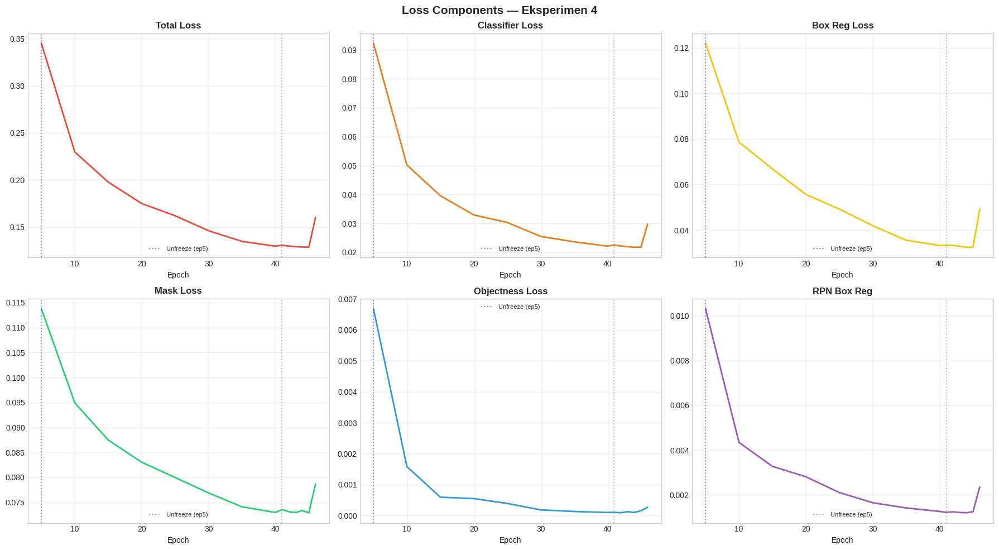

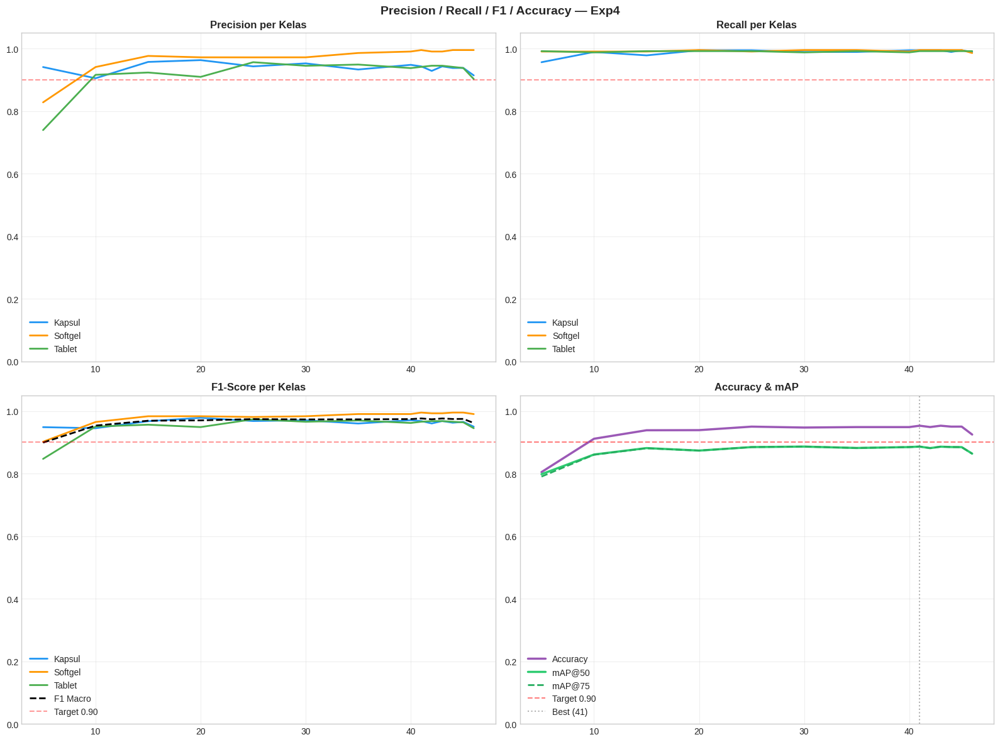

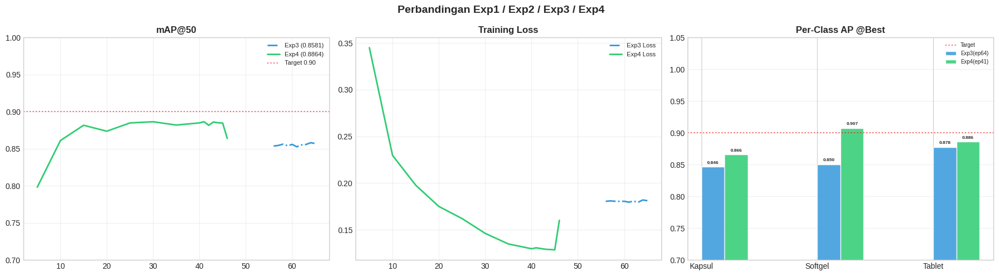


   Training Summary — Eksperimen 4
────────────────────────────────────────────────────────────
  Best Epoch         : 41
  Total Epochs       : 14
  Best mAP@50        : 0.8864
  Best mAP@75        : 0.8864
  Best mAR           : 0.9884
  Best IoU           : 0.9136
  Best Accuracy      : 0.9532
  Best F1 Macro      : 0.9764
  Best Prec Macro    : 0.9599
  AP Kapsul          : 0.8658
  AP Softgel         : 0.9074
  AP Tablet          : 0.8862

 Semua grafik disimpan di: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results


In [ ]:
# ============================================================
# CELL 10: VISUALISASI + PERBANDINGAN EXP1/2/3/4
# ============================================================
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np, os

plt.style.use('seaborn-v0_8-whitegrid')

df4 = pd.read_csv(os.path.join(LOG_DIR,'training_log_combined.csv'))
df4 = df4.sort_values('epoch').reset_index(drop=True)
print(f' Exp4: {len(df4)} epochs')

df1 = pd.read_csv(EXP1_LOG) if os.path.exists(EXP1_LOG) else None
df2 = pd.read_csv(EXP2_LOG) if os.path.exists(EXP2_LOG) else None
df3 = pd.read_csv(EXP3_LOG) if os.path.exists(EXP3_LOG) else None

ep4      = df4['epoch'].values
best_ep4 = df4.loc[df4['val_map'].idxmax(),'epoch']

exp_colors = {'exp1':'#E74C3C','exp2':'#F39C12','exp3':'#3498DB','exp4':'#2ECC71'}
cls_colors = {'kapsul':'#2196F3','softgel':'#FF9800','tablet':'#4CAF50'}

# ── Loss Curves Exp4 ─────────────────────────────────────────
fig,axes = plt.subplots(2,3,figsize=(18,10))
fig.suptitle('Loss Components — Eksperimen 4',fontsize=15,fontweight='bold')
loss_info = [
    ('train_loss','Total Loss','#E74C3C'),
    ('train_loss_classifier','Classifier Loss','#E67E22'),
    ('train_loss_box_reg','Box Reg Loss','#F1C40F'),
    ('train_loss_mask','Mask Loss','#2ECC71'),
    ('train_loss_objectness','Objectness Loss','#3498DB'),
    ('train_loss_rpn_box_reg','RPN Box Reg','#9B59B6'),
]
for ax,(col,title,color) in zip(axes.flatten(),loss_info):
    if col in df4.columns:
        ax.plot(ep4,df4[col],color=color,linewidth=2)
        ax.axvline(CONFIG['freeze_epochs'],color='blue',linestyle=':',alpha=0.5,
                   label=f'Unfreeze (ep{CONFIG["freeze_epochs"]})')
        ax.axvline(best_ep4,color='gray',linestyle=':',alpha=0.5)
        ax.set_title(title,fontweight='bold'); ax.set_xlabel('Epoch')
        ax.legend(fontsize=8); ax.grid(True,alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'loss_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()

# ── Metrik Baru: Precision, Recall, F1, Accuracy ─────────────
fig,axes = plt.subplots(2,2,figsize=(16,12))
fig.suptitle('Precision / Recall / F1 / Accuracy — Exp4',fontsize=14,fontweight='bold')

# Precision per kelas
ax=axes[0,0]
for cls in ['kapsul','softgel','tablet']:
    col = f'val_precision_{cls}'
    if col in df4.columns:
        ax.plot(ep4,df4[col],color=cls_colors[cls],linewidth=2,label=cls.capitalize())
ax.set_title('Precision per Kelas',fontweight='bold')
ax.set_ylim(0,1.05); ax.legend(); ax.grid(True,alpha=0.3)
ax.axhline(0.9,color='red',linestyle='--',alpha=0.4,label='Target 0.90')

# Recall per kelas
ax=axes[0,1]
for cls in ['kapsul','softgel','tablet']:
    col = f'val_recall_{cls}'
    if col in df4.columns:
        ax.plot(ep4,df4[col],color=cls_colors[cls],linewidth=2,label=cls.capitalize())
ax.set_title('Recall per Kelas',fontweight='bold')
ax.set_ylim(0,1.05); ax.legend(); ax.grid(True,alpha=0.3)
ax.axhline(0.9,color='red',linestyle='--',alpha=0.4)

# F1 per kelas
ax=axes[1,0]
for cls in ['kapsul','softgel','tablet']:
    col = f'val_f1_{cls}'
    if col in df4.columns:
        ax.plot(ep4,df4[col],color=cls_colors[cls],linewidth=2,label=cls.capitalize())
if 'val_f1_macro' in df4.columns:
    ax.plot(ep4,df4['val_f1_macro'],color='black',linewidth=2,
            linestyle='--',label='F1 Macro')
ax.axhline(0.9,color='red',linestyle='--',alpha=0.4,label='Target 0.90')
ax.set_title('F1-Score per Kelas',fontweight='bold')
ax.set_ylim(0,1.05); ax.legend(); ax.grid(True,alpha=0.3)

# Accuracy & mAP
ax=axes[1,1]
if 'val_accuracy' in df4.columns:
    ax.plot(ep4,df4['val_accuracy'],color='#9B59B6',linewidth=2.5,label='Accuracy')
ax.plot(ep4,df4['val_map_50'],color='#2ECC71',linewidth=2.5,label='mAP@50')
ax.plot(ep4,df4['val_map_75'],color='#27AE60',linewidth=2,
        linestyle='--',label='mAP@75')
ax.axhline(0.9,color='red',linestyle='--',alpha=0.5,label='Target 0.90')
ax.axvline(best_ep4,color='gray',linestyle=':',alpha=0.6,label=f'Best ({int(best_ep4)})')
ax.set_title('Accuracy & mAP',fontweight='bold')
ax.set_ylim(0,1.05); ax.legend(); ax.grid(True,alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'metrics_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()

# ── Perbandingan 4 Eksperimen ─────────────────────────────────
fig,axes = plt.subplots(1,3,figsize=(18,5))
fig.suptitle(' Perbandingan Exp1 / Exp2 / Exp3 / Exp4',fontsize=14,fontweight='bold')

def plot_s(ax,df,col,color,label,ls='-'):
    if df is not None and col in df.columns:
        ax.plot(df['epoch'],df[col],color=color,linewidth=2,label=label,linestyle=ls)

# mAP@50
ax=axes[0]
for df,name,c,ls in [(df1,'Exp1',exp_colors['exp1'],'--'),
                      (df2,'Exp2',exp_colors['exp2'],'--'),
                      (df3,'Exp3',exp_colors['exp3'],'-.'),(df4,'Exp4',exp_colors['exp4'],'-')]:
    if df is not None:
        best_val = df['val_map_50'].max()
        plot_s(ax,df,'val_map_50',c,f'{name} ({best_val:.4f})',ls)
ax.axhline(0.90,color='red',linestyle=':',alpha=0.6,label='Target 0.90')
ax.set_title('mAP@50',fontweight='bold'); ax.set_ylim(0.7,1.0)
ax.legend(fontsize=8); ax.grid(True,alpha=0.3)

# Training Loss
ax=axes[1]
for df,name,c,ls in [(df1,'Exp1',exp_colors['exp1'],'--'),
                      (df2,'Exp2',exp_colors['exp2'],'--'),
                      (df3,'Exp3',exp_colors['exp3'],'-.'),(df4,'Exp4',exp_colors['exp4'],'-')]:
    plot_s(ax,df,'train_loss',c,f'{name} Loss',ls)
ax.set_title('Training Loss',fontweight='bold')
ax.legend(fontsize=8); ax.grid(True,alpha=0.3)

# Per-class AP bar @ best epoch
ax=axes[2]
cls_list=['kapsul','softgel','tablet']
x=np.arange(len(cls_list)); w=0.2
for i,(df,name,c) in enumerate([
    (df1,'Exp1',exp_colors['exp1']),(df2,'Exp2',exp_colors['exp2']),
    (df3,'Exp3',exp_colors['exp3']),(df4,'Exp4',exp_colors['exp4'])
]):
    if df is not None:
        br  = df.loc[df['val_map'].idxmax()]
        ap_vals=[br.get(f'val_map_{c2}',0) for c2 in cls_list]
        bars=ax.bar(x+(i-1.5)*w,ap_vals,w,label=f'{name}(ep{int(br["epoch"])})',
                    color=c,alpha=0.85,edgecolor='white')
        for bar,val in zip(bars,ap_vals):
            ax.text(bar.get_x()+bar.get_width()/2,bar.get_height()+0.003,
                    f'{val:.3f}',ha='center',va='bottom',fontsize=6,fontweight='bold')
ax.axhline(0.90,color='red',linestyle=':',alpha=0.6,label='Target')
ax.set_xticks(x); ax.set_xticklabels([c.capitalize() for c in cls_list])
ax.set_title('Per-Class AP @Best',fontweight='bold')
ax.set_ylim(0.7,1.05); ax.legend(fontsize=7); ax.grid(axis='y',alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'comparison_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()

# Summary
best_row = df4.loc[df4['val_map'].idxmax()]
print(f"""
{'='*60}
   Training Summary — Eksperimen 4
{'─'*60}
  Best Epoch         : {int(best_ep4)}
  Total Epochs       : {len(df4)}
  Best mAP@50        : {best_row['val_map_50']:.4f}
  Best mAP@75        : {best_row['val_map_75']:.4f}
  Best mAR           : {best_row['val_mar']:.4f}
  Best IoU           : {best_row['val_iou_mean']:.4f}
  Best Accuracy      : {best_row.get('val_accuracy',0):.4f}
  Best F1 Macro      : {best_row.get('val_f1_macro',0):.4f}
  Best Prec Macro    : {best_row.get('val_precision_macro',0):.4f}
  AP Kapsul          : {best_row.get('val_map_kapsul',0):.4f}
  AP Softgel         : {best_row.get('val_map_softgel',0):.4f}
  AP Tablet          : {best_row.get('val_map_tablet',0):.4f}
{'='*60}
""")
print(' Semua grafik disimpan di:', RESULT_DIR)

---
## 📦 CELL 11 — Load Best Model + TTA Inference

🔄 Loading best model (Exp4)...
    Loaded from epoch 23
✅ Loaded epoch 23 | mAP: 0.8908

🧪 Test inference...


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


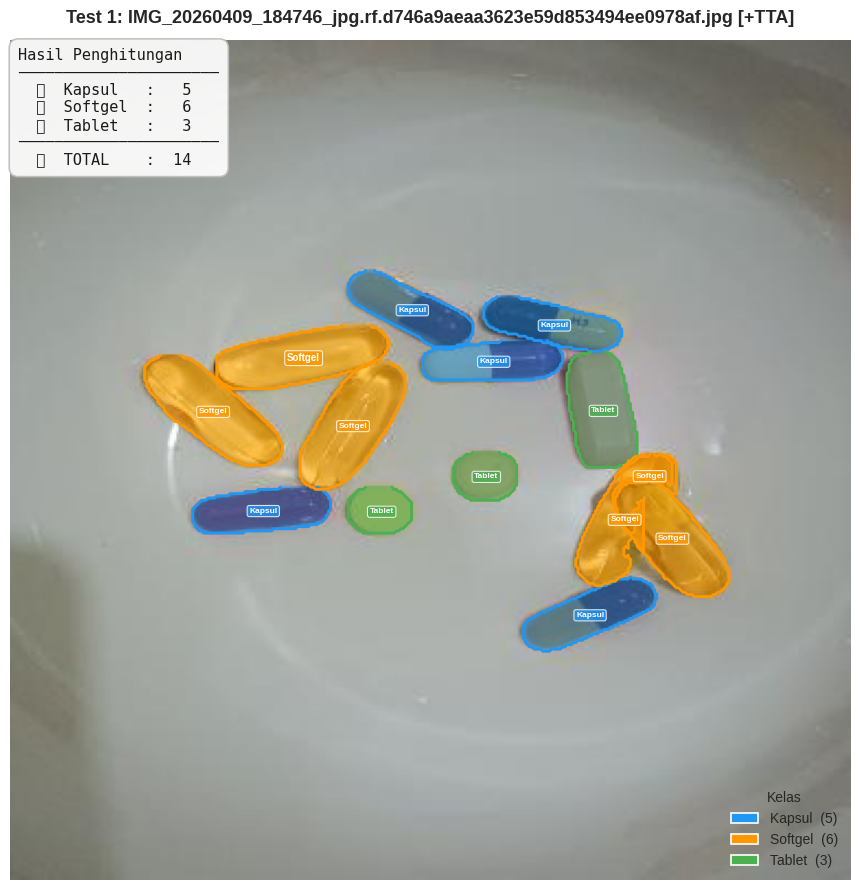


📊 Test 1: IMG_20260409_184746_jpg.rf.d746a9aeaa3623e59d853494ee0978af.jpg
   🔵 Kapsul  : 5
   🟠 Softgel : 6
   🟢 Tablet  : 3
   ─────────────
   📦 Total   : 14


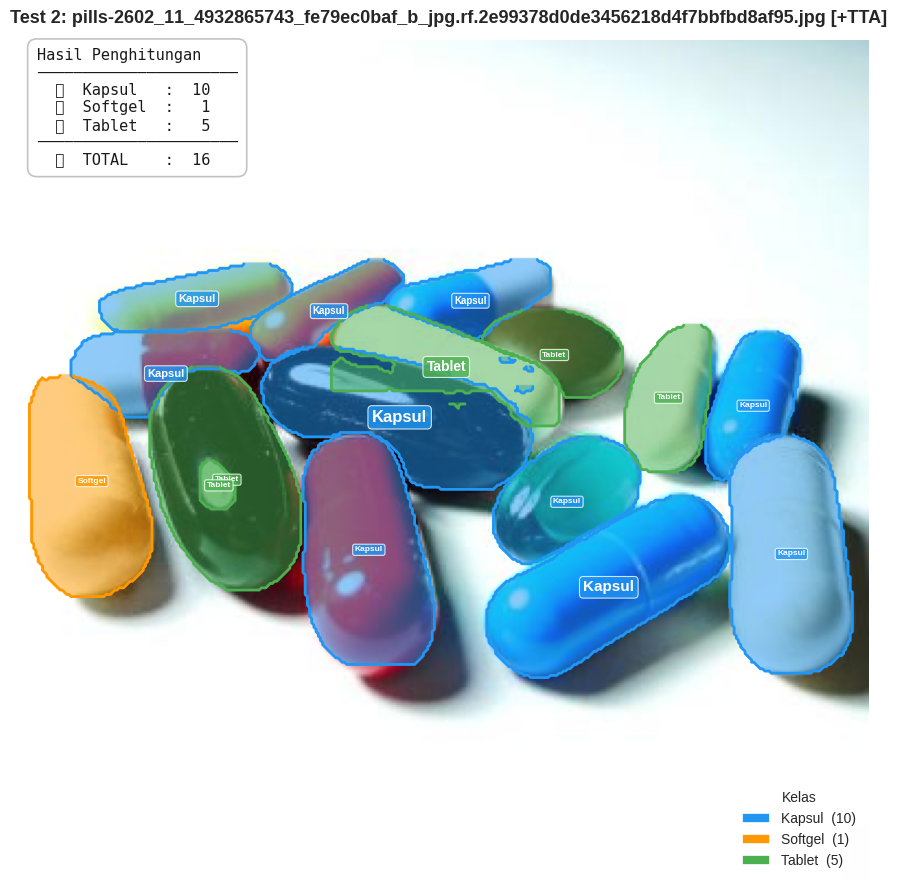


📊 Test 2: pills-2602_11_4932865743_fe79ec0baf_b_jpg.rf.2e99378d0de3456218d4f7bbfbd8af95.jpg
   🔵 Kapsul  : 10
   🟠 Softgel : 1
   🟢 Tablet  : 5
   ─────────────
   📦 Total   : 16


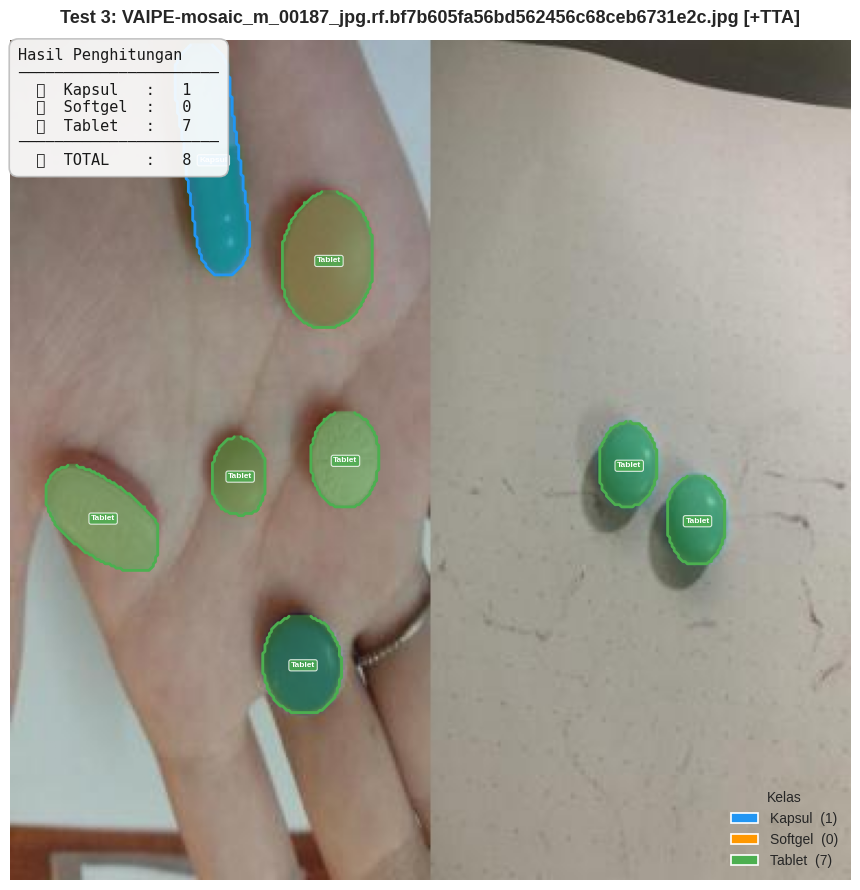


📊 Test 3: VAIPE-mosaic_m_00187_jpg.rf.bf7b605fa56bd562456c68ceb6731e2c.jpg
   🔵 Kapsul  : 1
   🟠 Softgel : 0
   🟢 Tablet  : 7
   ─────────────
   📦 Total   : 8


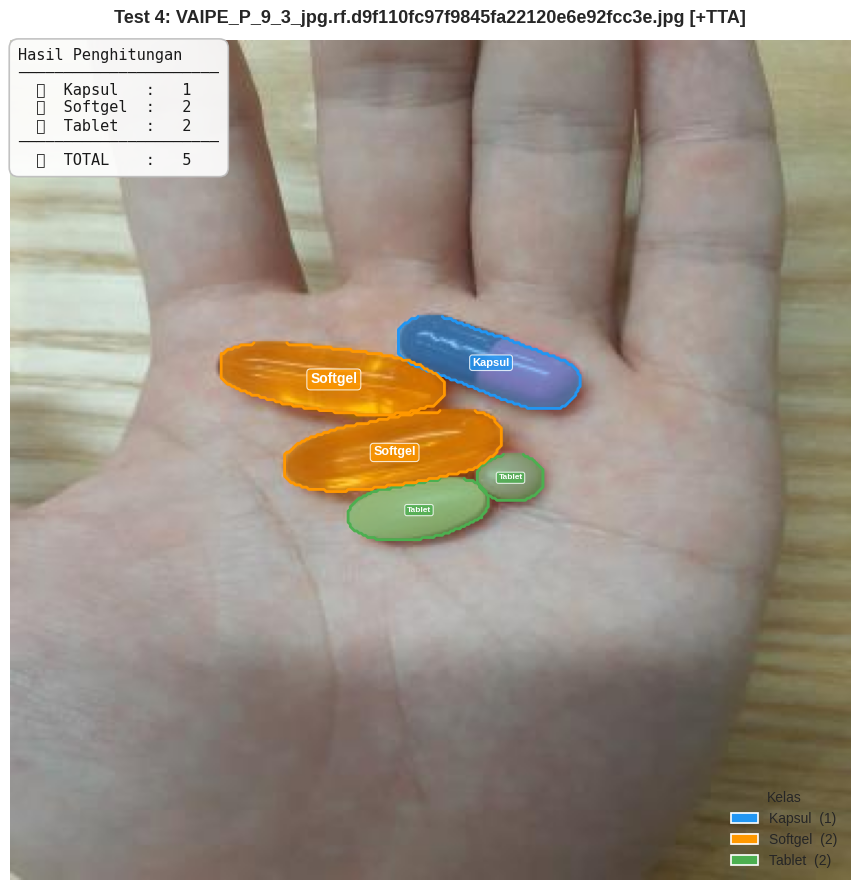


📊 Test 4: VAIPE_P_9_3_jpg.rf.d9f110fc97f9845fa22120e6e92fcc3e.jpg
   🔵 Kapsul  : 1
   🟠 Softgel : 2
   🟢 Tablet  : 2
   ─────────────
   📦 Total   : 5


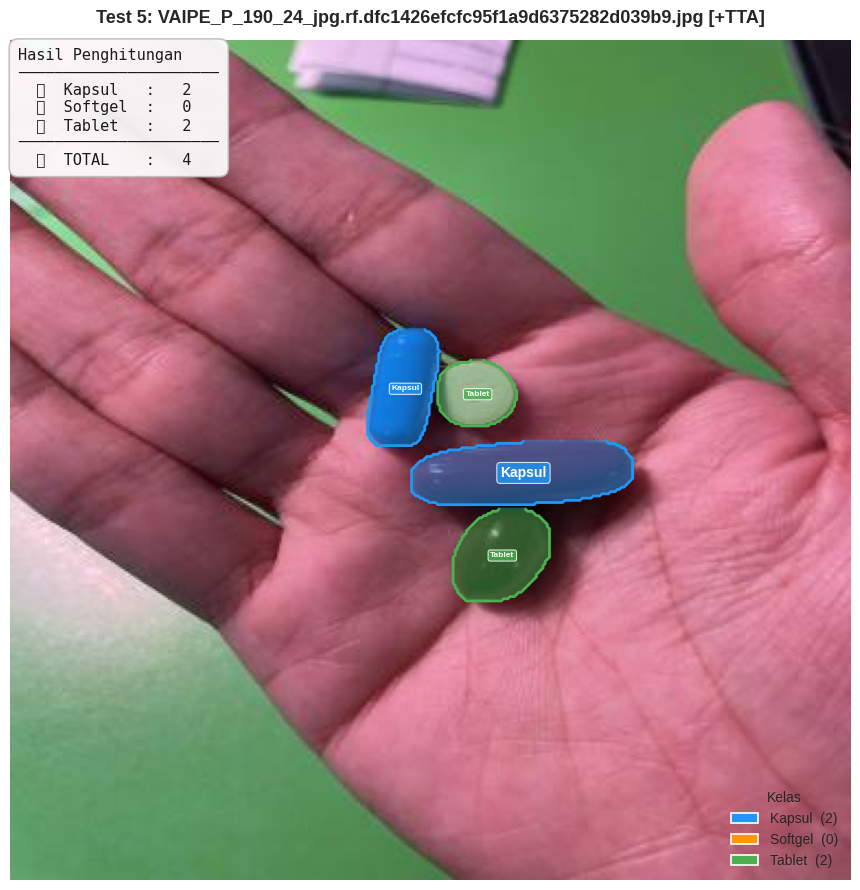


📊 Test 5: VAIPE_P_190_24_jpg.rf.dfc1426efcfc95f1a9d6375282d039b9.jpg
   🔵 Kapsul  : 2
   🟠 Softgel : 0
   🟢 Tablet  : 2
   ─────────────
   📦 Total   : 4


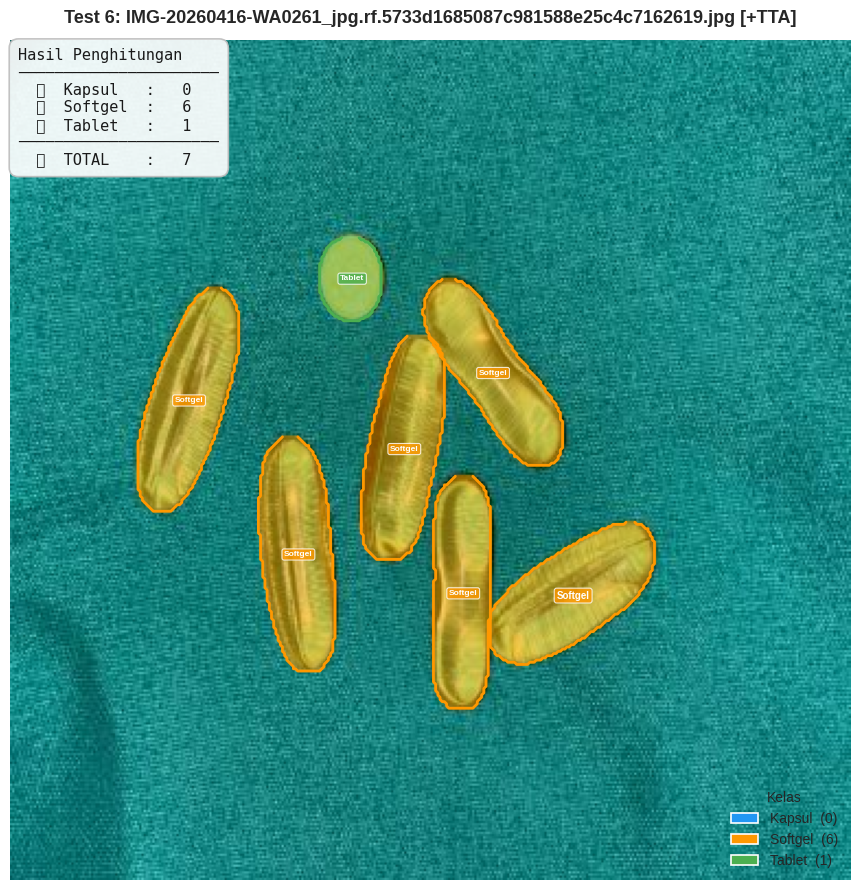


📊 Test 6: IMG-20260416-WA0261_jpg.rf.5733d1685087c981588e25c4c7162619.jpg
   🔵 Kapsul  : 0
   🟠 Softgel : 6
   🟢 Tablet  : 1
   ─────────────
   📦 Total   : 7

✅ Inference selesai!


In [ ]:
# ============================================================
# CELL 11: LOAD BEST MODEL + TTA INFERENCE
# Sama dengan Exp3 — TTA + per-class threshold
# ============================================================
import torch, numpy as np, cv2, os, random
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import to_rgba
from PIL import Image

CLASS_DISPLAY = {
    1: ('Kapsul',  '#2196F3', 0.50),
    2: ('Softgel', '#FF9800', 0.50),
    3: ('Tablet',  '#4CAF50', 0.50),
}

def inference_single(model, img_tensor, device):
    with torch.no_grad():
        return model([img_tensor.to(device)])[0]

def apply_per_class_threshold(output, threshold_dict):
    keep_list = [i for i,(lbl,score) in
                 enumerate(zip(output['labels'],output['scores']))
                 if score.item() >= threshold_dict.get(lbl.item(),0.5)]
    if not keep_list:
        return {k:v[[]] for k,v in output.items() if isinstance(v,torch.Tensor)}
    keep = torch.tensor(keep_list)
    return {'boxes':output['boxes'][keep].cpu(),'labels':output['labels'][keep].cpu(),
            'scores':output['scores'][keep].cpu(),'masks':output['masks'][keep].cpu()}

def tta_inference(model, pil_img, device, threshold_dict, use_tta=True):
    W,H = pil_img.size
    out_orig = inference_single(model, TF.to_tensor(pil_img), device)
    if not use_tta:
        return apply_per_class_threshold(out_orig, threshold_dict)
    out_flip = inference_single(model, TF.to_tensor(TF.hflip(pil_img)), device)
    fb = out_flip['boxes'].clone()
    fb[:,[0,2]] = W - fb[:,[2,0]]
    from torchvision.ops import nms
    all_boxes  = torch.cat([out_orig['boxes'],  fb])
    all_labels = torch.cat([out_orig['labels'], out_flip['labels']])
    all_scores = torch.cat([out_orig['scores'], out_flip['scores']])
    all_masks  = torch.cat([out_orig['masks'],  out_flip['masks'].flip(-1)])
    if len(all_boxes):
        keep = nms(all_boxes.float(), all_scores.float(), iou_threshold=0.5)
        merged = {'boxes':all_boxes[keep],'labels':all_labels[keep],
                  'scores':all_scores[keep],'masks':all_masks[keep]}
    else:
        merged = {'boxes':all_boxes,'labels':all_labels,
                  'scores':all_scores,'masks':all_masks}
    return apply_per_class_threshold(merged, threshold_dict)

def inference_and_visualize(model, img_input, device, use_tta=True, title='Hasil'):
    model.eval()
    if isinstance(img_input,str): pil_img=Image.open(img_input).convert('RGB')
    elif isinstance(img_input,np.ndarray): pil_img=Image.fromarray(img_input)
    else: pil_img=img_input

    filtered = tta_inference(model,pil_img,device,
                              CONFIG['score_threshold_per_class'],use_tta)
    labels=filtered['labels'].numpy(); scores=filtered['scores'].numpy()
    masks=filtered['masks'].numpy();   boxes=filtered['boxes'].numpy()

    counts={'Kapsul':0,'Softgel':0,'Tablet':0}
    for lbl in labels:
        info=CLASS_DISPLAY.get(int(lbl))
        if info: counts[info[0]]+=1
    counts['Total']=sum(counts.values())

    img_np=np.array(pil_img)
    overlay=img_np.copy().astype(np.float32)/255.0
    fig,ax=plt.subplots(figsize=(14,9))
    ax.set_title(f'{title}{" [+TTA]" if use_tta else ""}',
                 fontsize=13,fontweight='bold',pad=12)
    ax.axis('off')

    for lbl,score,mask,box in zip(labels,scores,masks,boxes):
        info=CLASS_DISPLAY.get(int(lbl),('Unknown','#FFFFFF',0.4))
        cls_name,hex_color,alpha=info
        rgb=np.array(to_rgba(hex_color)[:3])
        binary=mask[0]>0.5
        for ci,cv in enumerate(rgb):
            overlay[:,:,ci]=np.where(binary,
                overlay[:,:,ci]*(1-alpha)+cv*alpha,overlay[:,:,ci])
        conts,_=cv2.findContours(binary.astype(np.uint8),
                                  cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        for cnt in conts:
            ax.plot(cnt[:,0,0],cnt[:,0,1],color=hex_color,linewidth=2.0)
        x1,y1,x2,y2=box; cx,cy=(x1+x2)/2,(y1+y2)/2
        fs=max(6,min(12,int((x2-x1)/10)))
        ax.text(cx,cy,cls_name,color='white',fontsize=fs,fontweight='bold',
                ha='center',va='center',zorder=10,
                bbox=dict(facecolor=hex_color,alpha=0.80,edgecolor='white',
                          linewidth=0.8,boxstyle='round,pad=0.25'))

    ax.imshow(overlay)
    count_text='\n'.join(['Hasil Penghitungan','─'*22,
        f'  🔵  Kapsul   : {counts["Kapsul"]:>3}',
        f'  🟠  Softgel  : {counts["Softgel"]:>3}',
        f'  🟢  Tablet   : {counts["Tablet"]:>3}','─'*22,
        f'  📦  TOTAL    : {counts["Total"]:>3}'])
    ax.text(0.01,0.99,count_text,transform=ax.transAxes,fontsize=11,
            verticalalignment='top',fontfamily='monospace',color='#1a1a1a',
            bbox=dict(boxstyle='round,pad=0.6',facecolor='white',alpha=0.92,
                      edgecolor='#BDBDBD',linewidth=1.2),zorder=20)
    legend_patches=[patches.Patch(facecolor=info[1],edgecolor='white',linewidth=1.2,
                    label=f"{info[0]}  ({counts[info[0]]})") for info in CLASS_DISPLAY.values()]
    ax.legend(handles=legend_patches,loc='lower right',fontsize=10,
              framealpha=0.92,edgecolor='#BDBDBD',title='Kelas',title_fontsize=10)
    plt.tight_layout(); plt.show()

    print(f'\n📊 {title}')
    print(f'   🔵 Kapsul  : {counts["Kapsul"]}')
    print(f'   🟠 Softgel : {counts["Softgel"]}')
    print(f'   🟢 Tablet  : {counts["Tablet"]}')
    print(f'   ─────────────')
    print(f'   📦 Total   : {counts["Total"]}')
    return counts, filtered

# Load best model
print('🔄 Loading best model (Exp4)...')
best_model = build_model(
    num_classes=CONFIG['num_classes'],
    score_thresh=CONFIG['score_threshold'],
    nms_thresh=CONFIG['nms_threshold'],
    detections_per_img=CONFIG['detections_per_img'],
).to(DEVICE)

ckpt = load_checkpoint(BEST_MODEL_PATH, best_model)
print(f'✅ Loaded epoch {ckpt["epoch"]} | mAP: {ckpt["metrics"]["val_map_50"]:.4f}')

print('\n🧪 Test inference...')
test_imgs=[os.path.join(TEST_DIR,f) for f in os.listdir(TEST_DIR)
           if f.endswith(('.jpg','.jpeg','.png'))]
for i,p in enumerate(random.sample(test_imgs,min(6,len(test_imgs))),1):
    inference_and_visualize(best_model,p,DEVICE,use_tta=CONFIG['use_tta'],
                             title=f'Test {i}: {os.path.basename(p)}')
print('\n✅ Inference selesai!')

---
## 📦 CELL 12 — Final Evaluation Lengkap
> Evaluasi pada **test set** dengan semua metrik: mAP, IoU, **Accuracy, Precision, Recall, F1**.

   FINAL EVALUATION LENGKAP — TEST SET (Exp4)

  ┌─── TEST SET — Eksperimen 4 ───────────────────────────────────┐
  │  mAP@0.50  : 0.8727  │  mAP@0.75  : 0.8727
  │  mAR       : 0.9804  │  Mean IoU  : 0.9010
  │  Accuracy  : 0.9205  │  F1 Macro  : 0.9594
  │  Precision : 0.9518  │  Recall    : 0.9680
  ├──────────────────────────────────────────────────
  │  Per-Class AP, Precision, Recall, F1:
  │  Kelas          AP   Prec    Rec     F1
  │  ----------------------------------------
  │  Kapsul     0.8935 0.9675 0.9675 0.9675
  │  Softgel    0.8911 0.9802 0.9612 0.9706
  │  Tablet     0.8336 0.9077 0.9752 0.9402
  └──────────────────────────────────────────────────


Counting accuracy:   0%|          | 0/53 [00:00<?, ?it/s]

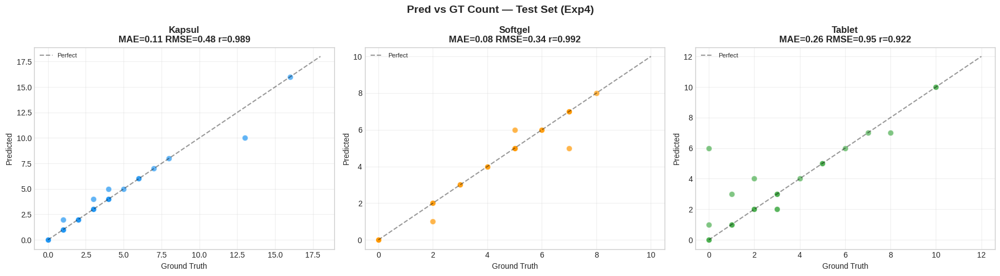

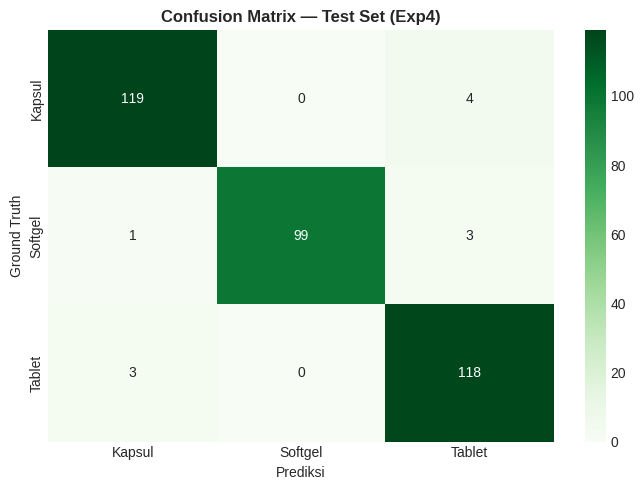


📊 TABEL PERBANDINGAN SEMUA EKSPERIMEN:
Eksperimen mAP@50 mAP@75    mAR    IoU Accuracy Precision     F1
      Exp1 0.8898 0.8550 0.9724 0.8591   0.0000    0.0000 0.0000
      Exp2 0.8898 0.8550 0.9724 0.8591   0.0000    0.0000 0.0000
      Exp3 0.8710 0.8618 0.9919 0.8871   0.0000    0.0000 0.0000
      Exp4 0.8727 0.8727 0.9804 0.9010   0.9205    0.9518 0.9594

📋 LAPORAN LENGKAP EXP4:
           Metric   Exp4
           mAP@50 0.8727
           mAP@75 0.8727
              mAR 0.9804
         Mean IoU 0.9010
         Accuracy 0.9205
Precision (Macro) 0.9518
   Recall (Macro) 0.9680
       F1 (Macro) 0.9594
        AP Kapsul 0.8935
       AP Softgel 0.8911
        AP Tablet 0.8336
 Precision Kapsul 0.9675
Precision Softgel 0.9802
 Precision Tablet 0.9077
    Recall Kapsul 0.9675
   Recall Softgel 0.9612
    Recall Tablet 0.9752
        F1 Kapsul 0.9675
       F1 Softgel 0.9706
        F1 Tablet 0.9402
       MAE Kapsul   0.11
      MAE Softgel   0.08
       MAE Tablet   0.26

✅ Semua h

In [ ]:
# ============================================================
# CELL 12: FINAL EVALUATION LENGKAP
# Metrik: mAP, IoU, Accuracy, Precision, Recall, F1, Confusion Matrix
# ============================================================
import torch, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from collections import defaultdict
import os

print('='*65)
print('   FINAL EVALUATION LENGKAP — TEST SET (Exp4)')
print('='*65)

# Evaluasi lengkap
test_res = evaluate_model(best_model, test_loader, DEVICE,
                          num_classes=CONFIG['num_classes'])
print_metrics(test_res, title='TEST SET — Eksperimen 4')

# Counting accuracy
class_names = CONFIG['class_names'][1:]
best_model.eval()
count_errors = {cls:[] for cls in class_names}
pred_counts  = {cls:[] for cls in class_names}
gt_counts    = {cls:[] for cls in class_names}

with torch.no_grad():
    for images,targets in tqdm(test_loader,desc='Counting accuracy'):
        images  = [img.to(DEVICE) for img in images]
        outputs = best_model(images)
        for output,target in zip(outputs,targets):
            keep_list=[i for i,(lbl,sc) in
                       enumerate(zip(output['labels'],output['scores']))
                       if sc.item()>=CONFIG['score_threshold_per_class'].get(lbl.item(),0.5)]
            pl=output['labels'][keep_list].cpu() if keep_list else torch.tensor([])
            gl=target['labels'].cpu()
            for ci,cls in enumerate(class_names,start=1):
                pn=(pl==ci).sum().item() if len(pl) else 0
                gn=(gl==ci).sum().item()
                pred_counts[cls].append(pn)
                gt_counts[cls].append(gn)
                count_errors[cls].append(pn-gn)

# Scatter pred vs GT
cls_colors2={'kapsul':'#2196F3','softgel':'#FF9800','tablet':'#4CAF50'}
fig,axes=plt.subplots(1,3,figsize=(18,5))
fig.suptitle('Pred vs GT Count — Test Set (Exp4)',fontsize=14,fontweight='bold')
for ax,cls in zip(axes,class_names):
    ps,gs=pred_counts[cls],gt_counts[cls]
    mx=max(max(ps),max(gs))+2
    ax.scatter(gs,ps,color=cls_colors2[cls],alpha=0.7,s=60,edgecolors='white')
    ax.plot([0,mx],[0,mx],'k--',alpha=0.4,label='Perfect')
    mae=np.mean(np.abs(count_errors[cls]))
    rmse=np.sqrt(np.mean(np.array(count_errors[cls])**2))
    corr=np.corrcoef(gs,ps)[0,1]
    ax.set_title(f'{cls.capitalize()}\nMAE={mae:.2f} RMSE={rmse:.2f} r={corr:.3f}',
                 fontweight='bold')
    ax.set_xlabel('Ground Truth'); ax.set_ylabel('Predicted')
    ax.legend(fontsize=8); ax.grid(True,alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'counting_accuracy_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()

# Confusion Matrix
conf=defaultdict(lambda:defaultdict(int))
ci_to_name={i+1:n for i,n in enumerate(class_names)}
best_model.eval()
with torch.no_grad():
    for images,targets in test_loader:
        images=[img.to(DEVICE) for img in images]
        outputs=best_model(images)
        for output,target in zip(outputs,targets):
            keep_list=[i for i,(lbl,sc) in
                       enumerate(zip(output['labels'],output['scores']))
                       if sc.item()>=CONFIG['score_threshold_per_class'].get(lbl.item(),0.5)]
            pl=output['labels'][keep_list].cpu()
            pb=output['boxes'][keep_list].cpu()
            gl=target['labels'].cpu(); gb=target['boxes'].cpu()
            matched=set()
            for pb_i,pl_i in zip(pb,pl):
                best_iou,best_gi,best_gl=0,-1,-1
                for gi,(gb_i,gl_i) in enumerate(zip(gb,gl)):
                    if gi in matched: continue
                    iou=compute_iou_box(pb_i.tolist(),gb_i.tolist())
                    if iou>best_iou: best_iou,best_gi,best_gl=iou,gi,gl_i.item()
                if best_iou>=0.5 and best_gi!=-1:
                    matched.add(best_gi)
                    conf[ci_to_name.get(best_gl,'unk')][ci_to_name.get(pl_i.item(),'unk')]+=1

matrix=[[conf[gt][pred] for pred in class_names] for gt in class_names]
df_cm=pd.DataFrame(matrix,index=class_names,columns=class_names)

fig,ax=plt.subplots(figsize=(7,5))
sns.heatmap(df_cm,annot=True,fmt='d',cmap='Greens',ax=ax,
            xticklabels=[c.capitalize() for c in class_names],
            yticklabels=[c.capitalize() for c in class_names])
ax.set_title('Confusion Matrix — Test Set (Exp4)',fontweight='bold')
ax.set_ylabel('Ground Truth'); ax.set_xlabel('Prediksi')
plt.tight_layout()
plt.savefig(os.path.join(RESULT_DIR,'confusion_matrix_exp4.png'),dpi=150,bbox_inches='tight')
plt.show()

# ── Radar Chart: Perbandingan Metrik Antar Eksperimen ─────────
# Nilai dari eksperimen sebelumnya (dari hasil test set)
exp_results = {
    'Exp1': {'mAP@50':0.8898,'mAP@75':0.8550,'mAR':0.9724,'IoU':0.8591,
             'Accuracy':0.0,'Precision':0.0,'F1':0.0},
    'Exp2': {'mAP@50':0.8898,'mAP@75':0.8550,'mAR':0.9724,'IoU':0.8591,
             'Accuracy':0.0,'Precision':0.0,'F1':0.0},
    'Exp3': {'mAP@50':0.8710,'mAP@75':0.8618,'mAR':0.9919,'IoU':0.8871,
             'Accuracy':0.0,'Precision':0.0,'F1':0.0},
    'Exp4': {'mAP@50':test_res['map_50'],'mAP@75':test_res['map_75'],
             'mAR':test_res['mar'],'IoU':test_res['iou_mean'],
             'Accuracy':test_res['accuracy'],
             'Precision':test_res['precision_macro'],
             'F1':test_res['f1_macro']},
}

# ── Tabel Perbandingan Final ──────────────────────────────────
metrics_order = ['mAP@50','mAP@75','mAR','IoU','Accuracy','Precision','F1']
rows=[]
for exp,vals in exp_results.items():
    row={'Eksperimen':exp}
    row.update({m:f'{vals[m]:.4f}' for m in metrics_order})
    rows.append(row)
df_compare=pd.DataFrame(rows)
print('\n📊 TABEL PERBANDINGAN SEMUA EKSPERIMEN:')
print(df_compare.to_string(index=False))

# ── Final Report CSV ─────────────────────────────────────────
pcm = test_res['per_class_metrics']
report = pd.DataFrame({
    'Metric':[
        'mAP@50','mAP@75','mAR','Mean IoU',
        'Accuracy','Precision (Macro)','Recall (Macro)','F1 (Macro)',
        'AP Kapsul','AP Softgel','AP Tablet',
        'Precision Kapsul','Precision Softgel','Precision Tablet',
        'Recall Kapsul','Recall Softgel','Recall Tablet',
        'F1 Kapsul','F1 Softgel','F1 Tablet',
        'MAE Kapsul','MAE Softgel','MAE Tablet',
    ],
    'Exp4':[
        f"{test_res['map_50']:.4f}",f"{test_res['map_75']:.4f}",
        f"{test_res['mar']:.4f}",f"{test_res['iou_mean']:.4f}",
        f"{test_res['accuracy']:.4f}",
        f"{test_res['precision_macro']:.4f}",
        f"{test_res['recall_macro']:.4f}",
        f"{test_res['f1_macro']:.4f}",
        f"{test_res['per_class_ap'].get('kapsul',0):.4f}",
        f"{test_res['per_class_ap'].get('softgel',0):.4f}",
        f"{test_res['per_class_ap'].get('tablet',0):.4f}",
        f"{pcm.get('kapsul',{}).get('precision',0):.4f}",
        f"{pcm.get('softgel',{}).get('precision',0):.4f}",
        f"{pcm.get('tablet',{}).get('precision',0):.4f}",
        f"{pcm.get('kapsul',{}).get('recall',0):.4f}",
        f"{pcm.get('softgel',{}).get('recall',0):.4f}",
        f"{pcm.get('tablet',{}).get('recall',0):.4f}",
        f"{pcm.get('kapsul',{}).get('f1',0):.4f}",
        f"{pcm.get('softgel',{}).get('f1',0):.4f}",
        f"{pcm.get('tablet',{}).get('f1',0):.4f}",
        f"{np.mean(np.abs(count_errors['kapsul'])):.2f}",
        f"{np.mean(np.abs(count_errors['softgel'])):.2f}",
        f"{np.mean(np.abs(count_errors['tablet'])):.2f}",
    ]
})

print('\n📋 LAPORAN LENGKAP EXP4:')
print(report.to_string(index=False))
report.to_csv(os.path.join(RESULT_DIR,'final_report_exp4.csv'),index=False)
df_compare.to_csv(os.path.join(RESULT_DIR,'comparison_all_experiments.csv'),index=False)

print(f'\n✅ Semua hasil disimpan di {RESULT_DIR}')
print('   - confusion_matrix_exp4.png')
print('   - counting_accuracy_exp4.png')
print('   - metrics_exp4.png')
print('   - comparison_exp4.png')
print('   - final_report_exp4.csv')
print('   - comparison_all_experiments.csv')

CELL 12B (MEMASTIKAN DOKUMEN)

In [ ]:
# ============================================================
# CELL 12B: SIMPAN HASIL TEST SET KE JSON
# Supaya bisa dibaca otomatis oleh notebook YOLOv8m-seg
# untuk tabel perbandingan (Tabel 4.9), tanpa perlu ketik manual
# ============================================================
import json, os

maskrcnn_test_metrics = {
    'mAP@50'            : float(test_res['map_50']),
    'mAP@75'             : float(test_res['map_75']),
    'mAR'                : float(test_res['mar']),
    'Mean IoU'           : float(test_res['iou_mean']),
    'Precision (Macro)'  : float(test_res['precision_macro']),
    'Recall (Macro)'     : float(test_res['recall_macro']),
    'F1 (Macro)'         : float(test_res['f1_macro']),
    'Accuracy'           : float(test_res['accuracy']),
    'AP Kapsul'          : float(test_res['per_class_ap'].get('kapsul', 0)),
    'AP Softgel'         : float(test_res['per_class_ap'].get('softgel', 0)),
    'AP Tablet'          : float(test_res['per_class_ap'].get('tablet', 0)),
}

metrics_path = os.path.join(RESULT_DIR, 'maskrcnn_test_metrics.json')
with open(metrics_path, 'w') as f:
    json.dump(maskrcnn_test_metrics, f, indent=2)

print(f'💾 Metrics Mask R-CNN (test set) disimpan: {metrics_path}')
print(json.dumps(maskrcnn_test_metrics, indent=2))

💾 Metrics Mask R-CNN (test set) disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/maskrcnn_test_metrics.json
{
  "mAP@50": 0.8727307695762653,
  "mAP@75": 0.8727307695762653,
  "mAR": 0.9804224077808983,
  "Mean IoU": 0.9009579646241264,
  "Precision (Macro)": 0.9517900007628602,
  "Recall (Macro)": 0.9679504449693864,
  "F1 (Macro)": 0.9594356512543829,
  "Accuracy": 0.9205479452052273,
  "AP Kapsul": 0.8935367662542231,
  "AP Softgel": 0.8910891089100089,
  "AP Tablet": 0.8335664335645638
}


KECEPATAN INFERENSI YG AKAN DIBANDIGKAN DENGAN YOLOv8m-seg


In [ ]:
# ============================================================
# BENCHMARK KECEPATAN INFERENSI — MASK R-CNN (measured, bukan estimasi)
# Jalankan setelah best_model & test_loader siap
# ============================================================
import time
import numpy as np

best_model.eval()
sample_images = []
for images, targets in test_loader:
    sample_images.extend(images)
    if len(sample_images) >= 11:   # ambil 11 (1 warmup + 10 diukur)
        break
sample_images = sample_images[:11]

times = []
with torch.no_grad():
    for img in sample_images:
        img_gpu = img.to(DEVICE)
        start = time.time()
        _ = best_model([img_gpu])
        torch.cuda.synchronize()  # penting untuk pengukuran GPU yang akurat
        times.append((time.time() - start) * 1000)

avg_time_maskrcnn = np.mean(times[1:])  # skip warmup pertama
print(f'⏱️  Rata-rata waktu inferensi Mask R-CNN: {avg_time_maskrcnn:.1f} ms/gambar')
print(f'   (dari {len(times)-1} sample gambar test set, GPU: {torch.cuda.get_device_name(0)})')

⏱️  Rata-rata waktu inferensi Mask R-CNN: 174.0 ms/gambar
   (dari 10 sample gambar test set, GPU: Tesla T4)


---
## 📦 CELL 13 — Upload Gambar Custom

📁 Upload gambar obat...


Saving gambar 4 inference.jpeg to gambar 4 inference.jpeg

🔬 gambar 4 inference.jpeg ((868, 1156))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


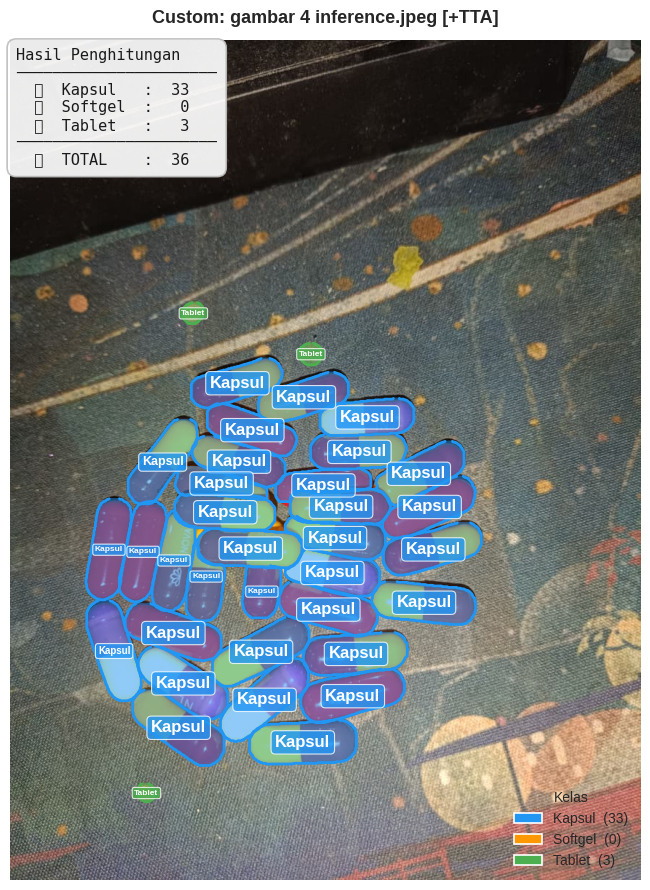


📊 Custom: gambar 4 inference.jpeg
   🔵 Kapsul  : 33
   🟠 Softgel : 0
   🟢 Tablet  : 3
   ─────────────
   📦 Total   : 36
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_gambar 4 inference.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving gambar 3 inference.jpeg to gambar 3 inference.jpeg

🔬 gambar 3 inference.jpeg ((868, 1156))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


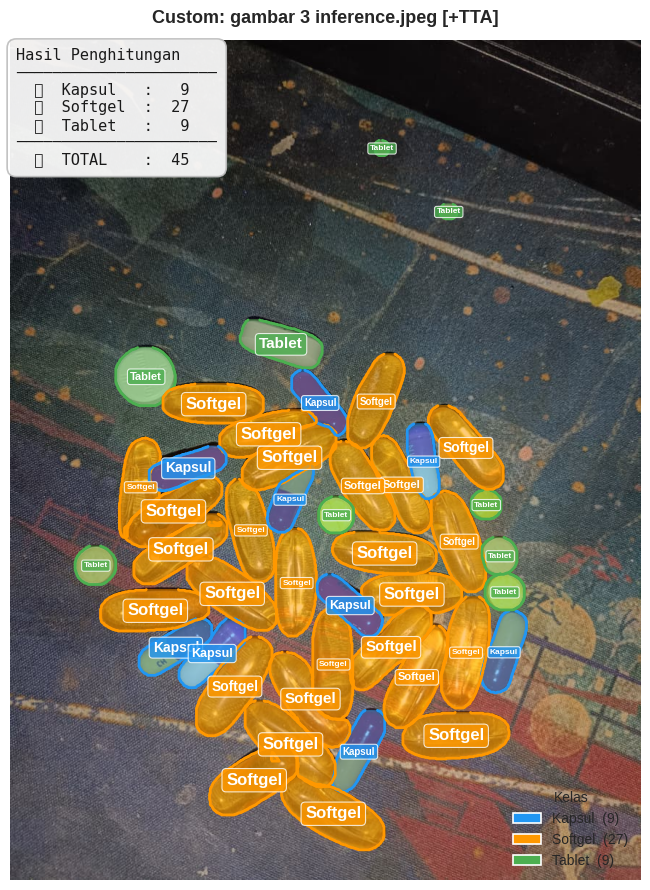


📊 Custom: gambar 3 inference.jpeg
   🔵 Kapsul  : 9
   🟠 Softgel : 27
   🟢 Tablet  : 9
   ─────────────
   📦 Total   : 45
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_gambar 3 inference.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving gambar 6 inference.jpeg to gambar 6 inference.jpeg

🔬 gambar 6 inference.jpeg ((868, 1156))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


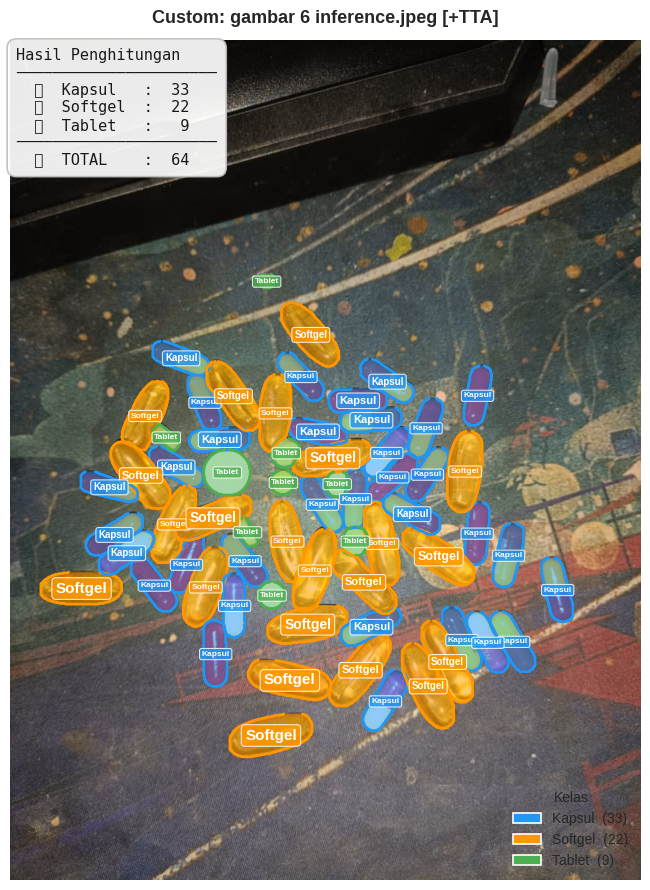


📊 Custom: gambar 6 inference.jpeg
   🔵 Kapsul  : 33
   🟠 Softgel : 22
   🟢 Tablet  : 9
   ─────────────
   📦 Total   : 64
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_gambar 6 inference.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving gambar 7 inference.jpeg to gambar 7 inference.jpeg

🔬 gambar 7 inference.jpeg ((1201, 1600))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


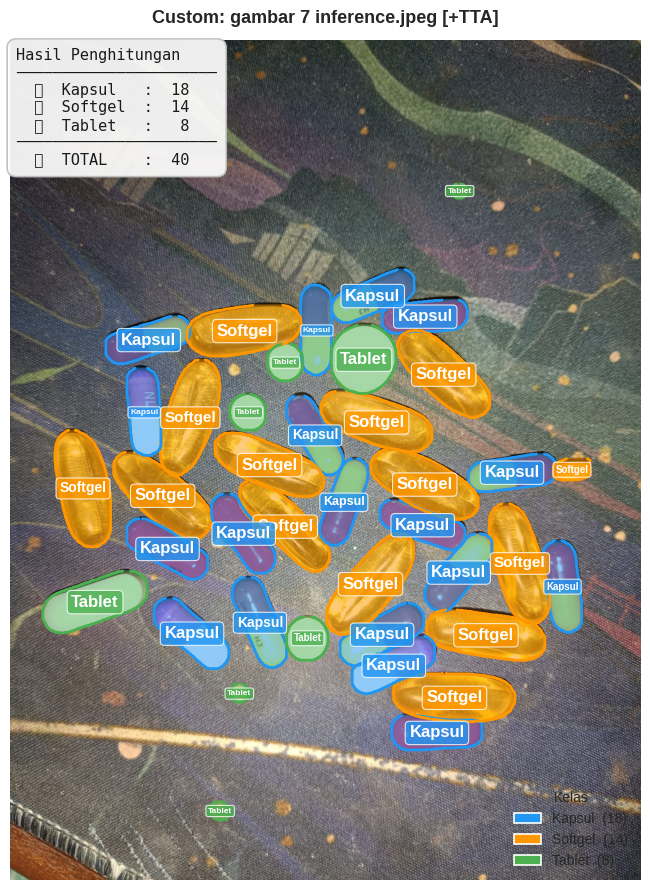


📊 Custom: gambar 7 inference.jpeg
   🔵 Kapsul  : 18
   🟠 Softgel : 14
   🟢 Tablet  : 8
   ─────────────
   📦 Total   : 40
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_gambar 7 inference.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving WhatsApp Image 2026-04-22 at 09.30.16.jpeg to WhatsApp Image 2026-04-22 at 09.30.16.jpeg

🔬 WhatsApp Image 2026-04-22 at 09.30.16.jpeg ((868, 1156))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


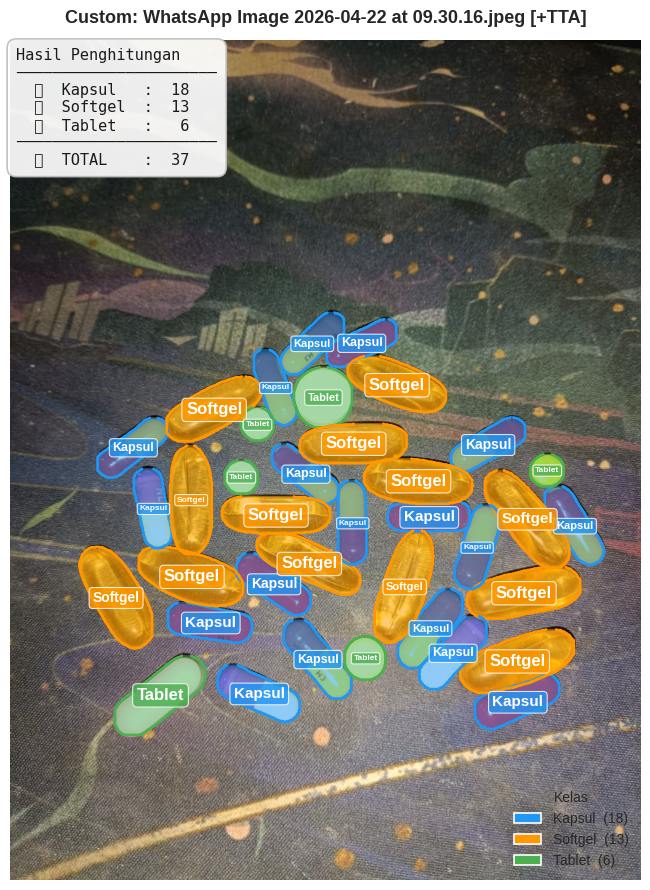


📊 Custom: WhatsApp Image 2026-04-22 at 09.30.16.jpeg
   🔵 Kapsul  : 18
   🟠 Softgel : 13
   🟢 Tablet  : 6
   ─────────────
   📦 Total   : 37
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_WhatsApp Image 2026-04-22 at 09.30.16.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

# FORMAT ONNX

In [ ]:
!pip install onnx onnxruntime onnxscript -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 714.8/714.8 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.8/166.8 kB 9.8 MB/s eta 0:00:00


In [ ]:
import onnx
import onnxruntime
import onnxscript

In [ ]:
# ============================================================
# CELL ONNX A: LOAD BEST MODEL EXP4
# Skip cell ini jika best_model sudah ada di memory
# ============================================================
import torch
import os

# Pastikan build_model dan CONFIG sudah terdefinisi (dari Cell 6 & 7)
print('🔄 Loading best model Exp4...')

best_model = build_model(
    num_classes        = CONFIG['num_classes'],
    score_thresh       = CONFIG['score_threshold'],
    nms_thresh         = CONFIG['nms_threshold'],
    detections_per_img = CONFIG['detections_per_img'],
).to(DEVICE)

ckpt = load_checkpoint(BEST_MODEL_PATH, best_model)
best_model.eval()

print(f'✅ Model loaded dari epoch {ckpt["epoch"]}')
print(f'   mAP@50 : {ckpt["metrics"]["val_map_50"]:.4f}')
print(f'   Device : {DEVICE}')

🔄 Loading best model Exp4...
    Loaded from epoch 23
✅ Model loaded dari epoch 23
   mAP@50 : 0.8908
   Device : cuda


In [ ]:
# ============================================================
# CELL ONNX B (REWRITE STABLE VERSION)
# KONVERSI MASK R-CNN -> ONNX (lebih aman untuk Colab/PyTorch baru)
# Fokus: exporter lama (dynamo=False) + opset 11
# ============================================================

import torch
import numpy as np
import os
import time
import subprocess
import sys

# ============================================================
# INSTALL PACKAGE
# ============================================================
print("📦 Checking package...")

subprocess.check_call([
    sys.executable, "-m", "pip", "install", "-q",
    "onnx", "onnxruntime"
])

import onnx
import onnxruntime as ort

# ============================================================
# PATH OUTPUT
# ============================================================
ONNX_PATH = os.path.join(DRIVE_BASE, "bestmodel_medicine_ver4.onnx")

# ============================================================
# WRAPPER MODEL
# Mask R-CNN output list[dict] -> tensor outputs
# ============================================================
class MaskRCNNWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, image):
        # image shape = (3,H,W)
        outputs = self.model([image])
        out = outputs[0]

        return (
            out["boxes"],    # (N,4)
            out["labels"],   # (N,)
            out["scores"],   # (N,)
            out["masks"],    # (N,1,H,W)
        )

# ============================================================
# PREPARE MODEL
# ============================================================
print("\n🔄 Preparing model...")

best_model.eval()
wrapper = MaskRCNNWrapper(best_model).to(DEVICE)
wrapper.eval()

# ============================================================
# DUMMY INPUT
# ============================================================
print("🔧 Creating dummy input...")

dummy_input = torch.zeros(3, 1024, 1024).to(DEVICE)

print("   Shape :", tuple(dummy_input.shape))
print("   Device:", DEVICE)

# ============================================================
# EXPORT ONNX
# ============================================================
print("\n📤 Exporting ONNX...")
print("   Please wait 2-5 minutes...")

start = time.time()

with torch.no_grad():
    torch.onnx.export(
        wrapper,
        dummy_input,
        ONNX_PATH,

        export_params=True,
        do_constant_folding=True,

        input_names=["image"],
        output_names=["boxes", "labels", "scores", "masks"],

        dynamic_axes={
            "image":  {1: "height", 2: "width"},
            "boxes":  {0: "num_detections"},
            "labels": {0: "num_detections"},
            "scores": {0: "num_detections"},
            "masks":  {0: "num_detections", 2: "height", 3: "width"},
        },

        opset_version=11,

        # 🔥 PALING PENTING
        dynamo=False,

        verbose=False
    )

elapsed = time.time() - start

print("✅ Export selesai!")
print(f"   Waktu export : {elapsed:.1f} detik")

# ============================================================
# FILE INFO
# ============================================================
size_mb = os.path.getsize(ONNX_PATH) / 1024 / 1024

print(f"   File path    : {ONNX_PATH}")
print(f"   Ukuran file  : {size_mb:.1f} MB")

# ============================================================
# VALIDASI ONNX
# ============================================================
print("\n🔍 Validating ONNX...")

model_onnx = onnx.load(ONNX_PATH)
onnx.checker.check_model(model_onnx)

print("✅ ONNX valid!")

# ============================================================
# TEST LOAD ONNX RUNTIME
# ============================================================
print("\n🚀 Testing ONNX Runtime...")

providers = (
    ["CUDAExecutionProvider", "CPUExecutionProvider"]
    if DEVICE.type == "cuda"
    else ["CPUExecutionProvider"]
)

session = ort.InferenceSession(
    ONNX_PATH,
    providers=providers
)

print("✅ ONNX Runtime loaded!")
print("   Provider :", session.get_providers()[0])

# ============================================================
# INPUT / OUTPUT INFO
# ============================================================
print("\n📋 Model Info")

print("Input Name :", session.get_inputs()[0].name)
print("Input Shape:", session.get_inputs()[0].shape)

print("Outputs:")
for out in session.get_outputs():
    print(" -", out.name, out.shape)

print("\n🎉 ONNX siap untuk backend web / Cloud Run")

📦 Checking package...

🔄 Preparing model...
🔧 Creating dummy input...
   Shape : (3, 1024, 1024)
   Device: cuda

📤 Exporting ONNX...
   Please wait 2-5 minutes...


You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter has become the default. Learn more about the new export logic: https://docs.pytorch.org/docs/stable/onnx_export.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html
To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't rec

✅ Export selesai!
   Waktu export : 5.6 detik
   File path    : /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/bestmodel_medicine_ver4.onnx
   Ukuran file  : 175.3 MB

🔍 Validating ONNX...
✅ ONNX valid!

🚀 Testing ONNX Runtime...
✅ ONNX Runtime loaded!
   Provider : CPUExecutionProvider

📋 Model Info
Input Name : image
Input Shape: [3, 'height', 'width']
Outputs:
 - boxes ['num_detections', 4]
 - labels ['num_detections']
 - scores ['num_detections']
 - masks ['num_detections', 1, 'height', 'width']

🎉 ONNX siap untuk backend web / Cloud Run


Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'


📁 Upload gambar obat...


Saving tablet TA.jpeg to tablet TA.jpeg

🔬 tablet TA.jpeg ((960, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


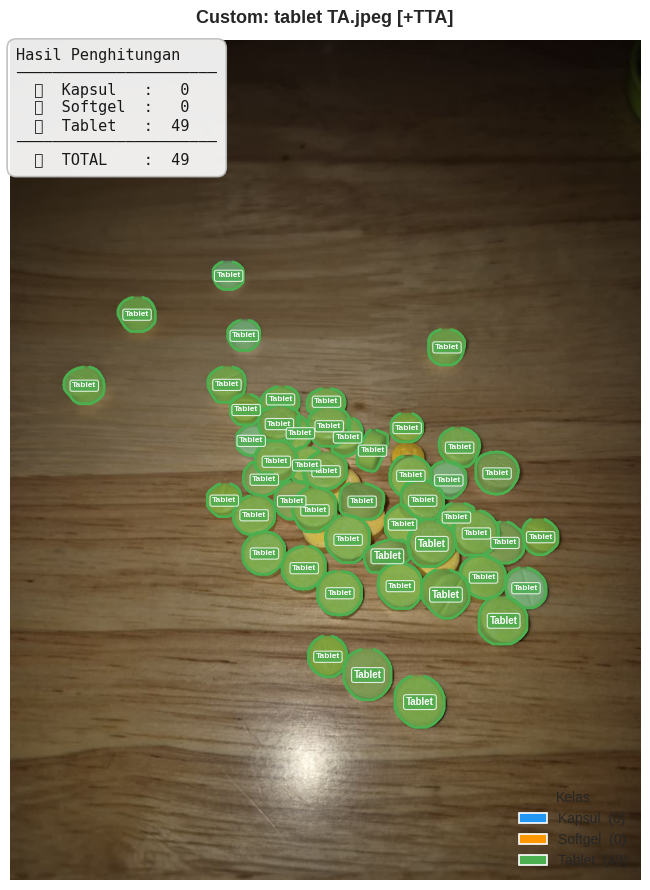


📊 Custom: tablet TA.jpeg
   🔵 Kapsul  : 0
   🟠 Softgel : 0
   🟢 Tablet  : 49
   ─────────────
   📦 Total   : 49
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_tablet TA.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving kapsull.jpeg to kapsull.jpeg

🔬 kapsull.jpeg ((960, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


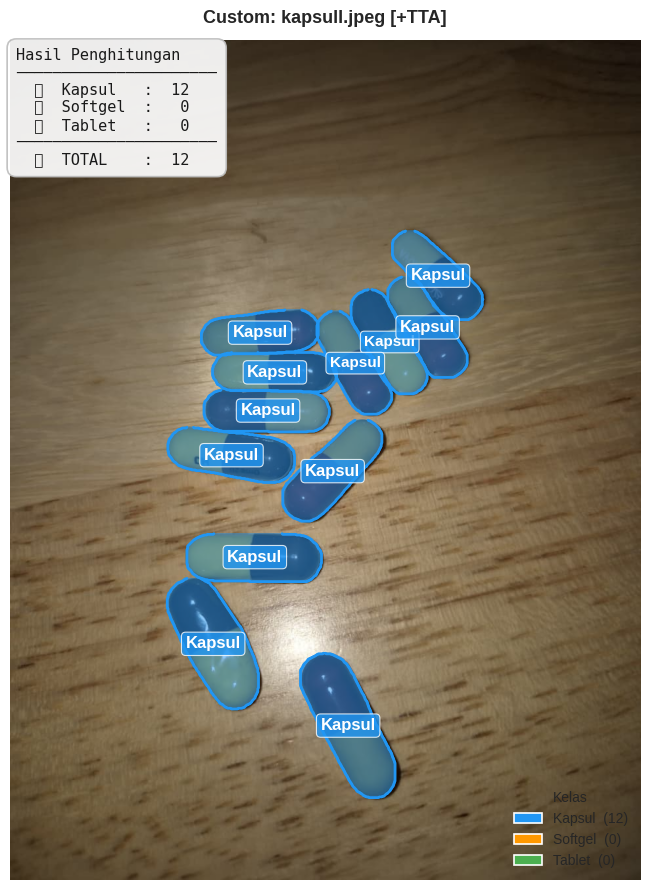


📊 Custom: kapsull.jpeg
   🔵 Kapsul  : 12
   🟠 Softgel : 0
   🟢 Tablet  : 0
   ─────────────
   📦 Total   : 12
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_kapsull.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving softgell TA.jpeg to softgell TA.jpeg

🔬 softgell TA.jpeg ((960, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


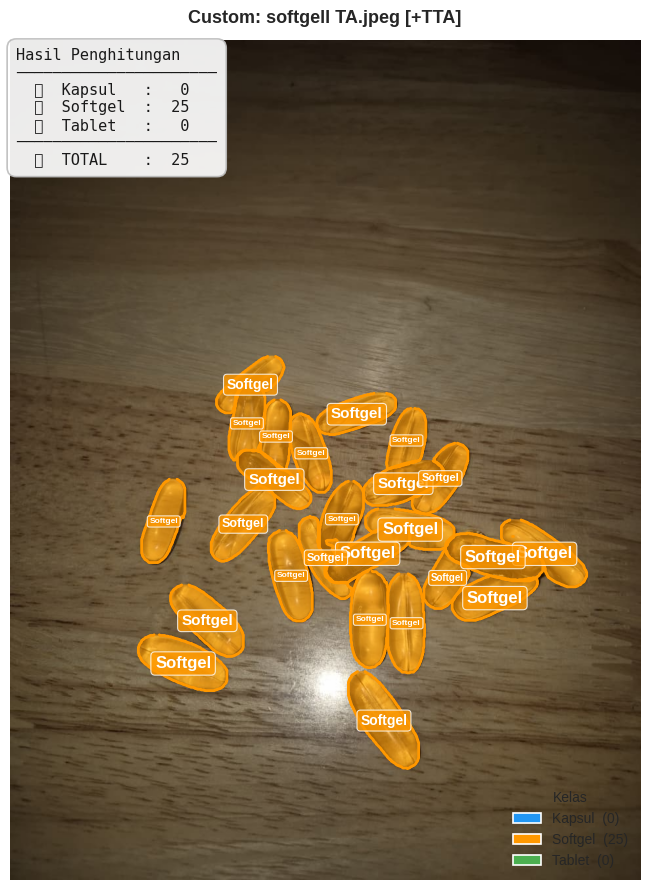


📊 Custom: softgell TA.jpeg
   🔵 Kapsul  : 0
   🟠 Softgel : 25
   🟢 Tablet  : 0
   ─────────────
   📦 Total   : 25
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_softgell TA.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving tablet eyak.jpeg to tablet eyak.jpeg

🔬 tablet eyak.jpeg ((720, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


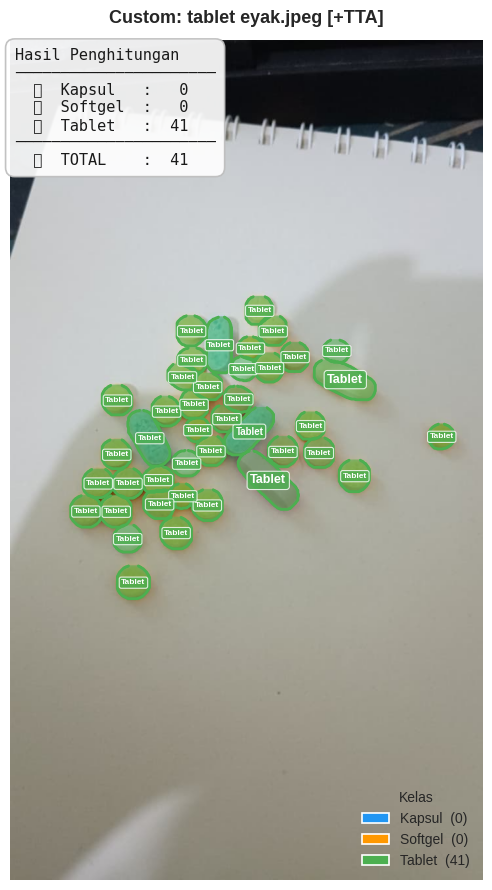


📊 Custom: tablet eyak.jpeg
   🔵 Kapsul  : 0
   🟠 Softgel : 0
   🟢 Tablet  : 41
   ─────────────
   📦 Total   : 41
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_tablet eyak.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving hahahy tablet.jpeg to hahahy tablet.jpeg

🔬 hahahy tablet.jpeg ((720, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


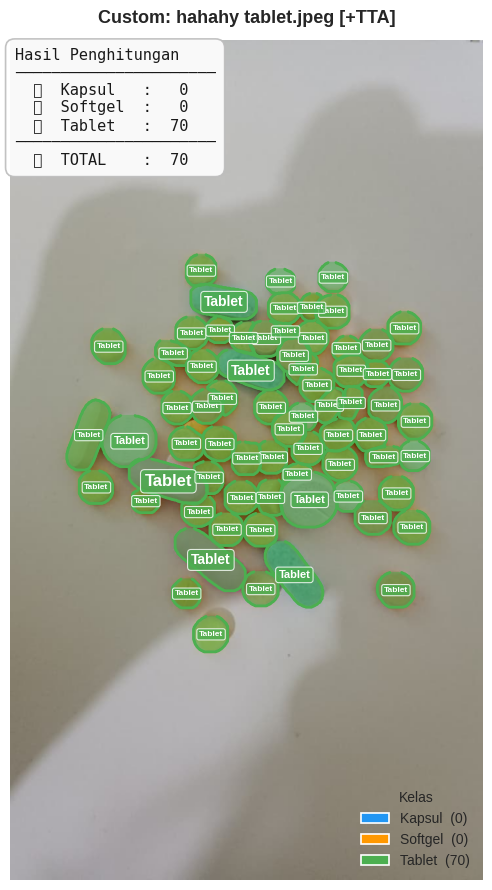


📊 Custom: hahahy tablet.jpeg
   🔵 Kapsul  : 0
   🟠 Softgel : 0
   🟢 Tablet  : 70
   ─────────────
   📦 Total   : 70
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_hahahy tablet.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving bab 4 - vis 5 rev.jpeg to bab 4 - vis 5 rev.jpeg

🔬 bab 4 - vis 5 rev.jpeg ((960, 1280))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


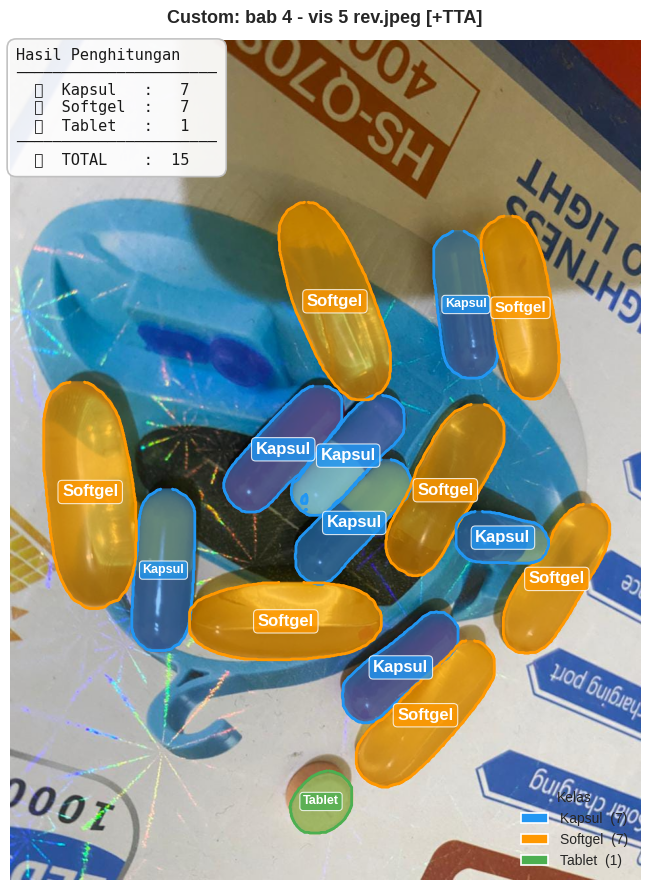


📊 Custom: bab 4 - vis 5 rev.jpeg
   🔵 Kapsul  : 7
   🟠 Softgel : 7
   🟢 Tablet  : 1
   ─────────────
   📦 Total   : 15
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_bab 4 - vis 5 rev.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')

📁 Upload gambar obat...


Saving bab 4 - vis 1.jpeg to bab 4 - vis 1.jpeg
Saving bab 4 - vis 2.jpeg to bab 4 - vis 2.jpeg
Saving bab 4 - vis 3.jpeg to bab 4 - vis 3.jpeg
Saving bab 4 - vis 4.jpeg to bab 4 - vis 4.jpeg

🔬 bab 4 - vis 1.jpeg ((800, 1040))


Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans Mono.
Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans Mono.


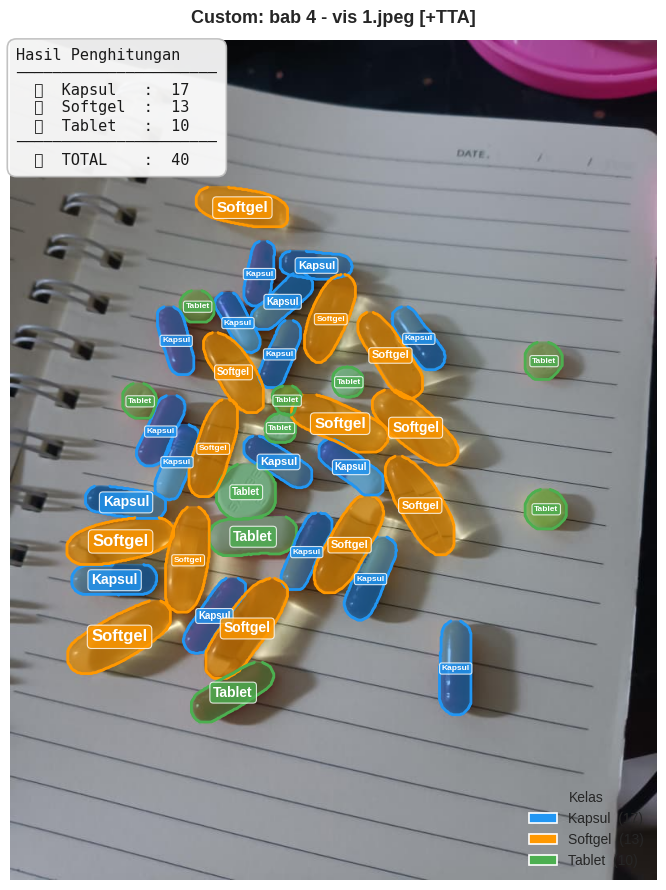


📊 Custom: bab 4 - vis 1.jpeg
   🔵 Kapsul  : 17
   🟠 Softgel : 13
   🟢 Tablet  : 10
   ─────────────
   📦 Total   : 40
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_bab 4 - vis 1.png

🔬 bab 4 - vis 2.jpeg ((1195, 1280))


<Figure size 640x480 with 0 Axes>

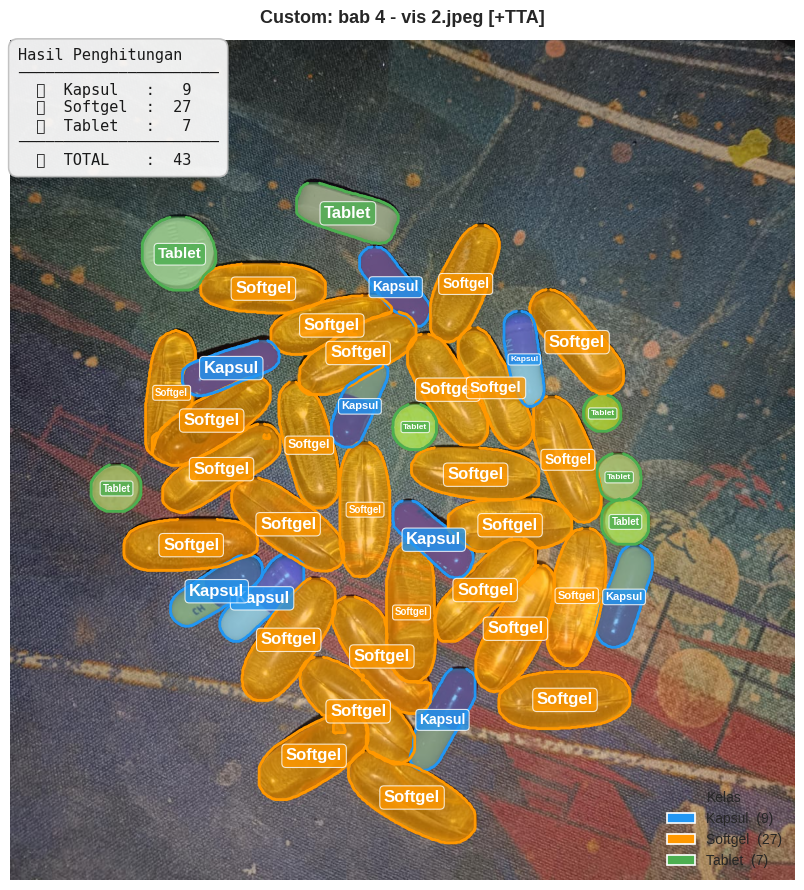


📊 Custom: bab 4 - vis 2.jpeg
   🔵 Kapsul  : 9
   🟠 Softgel : 27
   🟢 Tablet  : 7
   ─────────────
   📦 Total   : 43
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_bab 4 - vis 2.png

🔬 bab 4 - vis 3.jpeg ((960, 1280))


<Figure size 640x480 with 0 Axes>

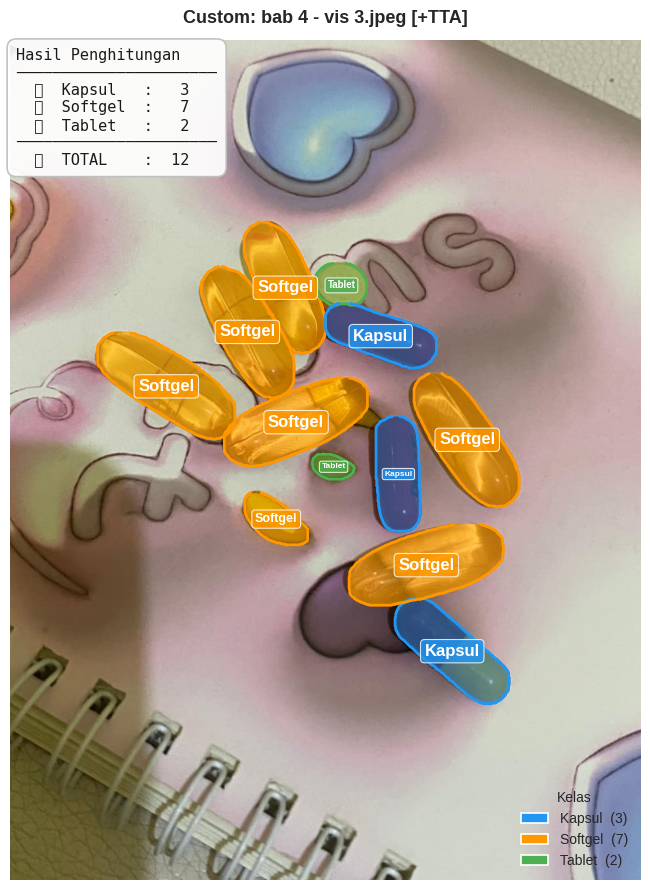


📊 Custom: bab 4 - vis 3.jpeg
   🔵 Kapsul  : 3
   🟠 Softgel : 7
   🟢 Tablet  : 2
   ─────────────
   📦 Total   : 12
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_bab 4 - vis 3.png

🔬 bab 4 - vis 4.jpeg ((868, 1156))


<Figure size 640x480 with 0 Axes>

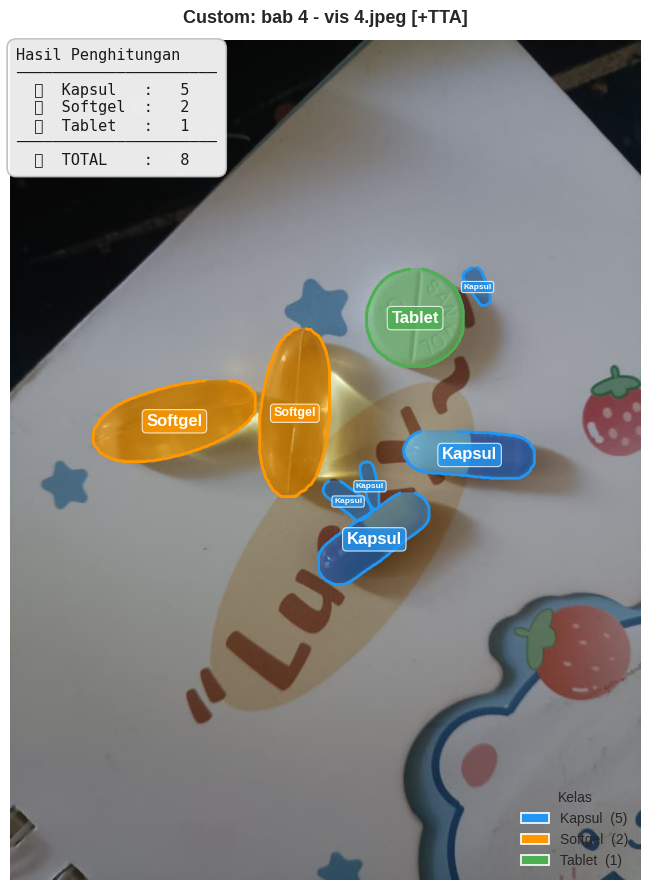


📊 Custom: bab 4 - vis 4.jpeg
   🔵 Kapsul  : 5
   🟠 Softgel : 2
   🟢 Tablet  : 1
   ─────────────
   📦 Total   : 8
   💾 Disimpan: /content/drive/MyDrive/Capstone/IRSHINE/Epoch150_ResNet101_Exp4/results/inference_bab 4 - vis 4.png


<Figure size 640x480 with 0 Axes>

In [ ]:
# ============================================================
# CELL 13: UPLOAD GAMBAR CUSTOM & INFERENCE
# ============================================================
from google.colab import files
from PIL import Image
import io, os, matplotlib.pyplot as plt

print('📁 Upload gambar obat...')
uploaded = files.upload()

for fname,fdata in uploaded.items():
    pil_img = Image.open(io.BytesIO(fdata)).convert('RGB')
    print(f'\n🔬 {fname} ({pil_img.size})')
    counts,_ = inference_and_visualize(
        best_model, pil_img, DEVICE,
        use_tta = CONFIG['use_tta'],
        title   = f'Custom: {fname}'
    )
    out = os.path.join(RESULT_DIR,f'inference_{fname.rsplit(".",1)[0]}.png')
    plt.savefig(out,dpi=150,bbox_inches='tight')
    print(f'   💾 Disimpan: {out}')